# LimTOD — thesis master notebook
## Gaussian validation → HornDry baseline → rotation A–G → priors → beam mismatch → GLS

This notebook is an **end-to-end, sequential thesis notebook** built around the coordinate-consistent LimTOD workflow.

It deliberately keeps the analysis elaborate. “Clean” here means:

- every variable is defined before it is used;
- each scientific stage follows from the previous one;
- the native LimTOD `HPW_mapmaking` workflow remains the main recovery method;
- the **mapmaker selection threshold remains fixed at 0.05**;
- the **beam truncation fraction remains fixed at 0.05**;
- weighted-hit cuts are used only for *analysis metrics*, not to expand the reconstructed sky patch;
- baseline means **24 h with no antenna self-rotation**;
- GLS appears only after the deterministic LimTOD pipeline has been validated.

The required thesis figures are tracked as **F1–F24**. Each figure is saved under:

`RoastSim/THESIS_MASTER_FIGURES/`

and the final cell checks that every F1–F24 output exists.

---

## Scientific sequence

1. Coordinate-consistent GDSM sky and reference smoothing.
2. Gaussian-beam validation at FWHM 10°, 20°, and 40°.
3. Circular-Gaussian rotation null test.
4. Gaussian closure test.
5. HornDry 24 h **no-rotation** baseline.
6. Native LimTOD reference-smoothing comparison.
7. Rotation scenarios A–G.
8. Common-pixel and orientation-coverage diagnostics.
9. Native LimTOD prior/regularisation ladder.
10. HornDry/HornWet beam mismatch.
11. GLS/noise extension.
12. Additional diagnostics and optional robustness appendices.

# 0. Imports, API verification, fixed configuration

In [2]:
# ============================================================
# 0.1 Imports and LimTOD API verification
# ============================================================

from __future__ import annotations

import os
import re
import glob
import inspect
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp
import scipy.linalg as la
from astropy.io import fits

import limTOD
from limTOD import (
    generate_LSTs_deg,
    generate_TOD_sky,
    GDSM_sky_model,
    HPW_mapmaking,
)
from limTOD.simulator import generate_sky2sys_projection

print("limTOD imported from:", limTOD.__file__)

# Fail early if the installed API differs from the notebook.
hpw_call_sig = inspect.signature(HPW_mapmaking.__call__)
for required_name in [
    "TOD_group",
    "dtime",
    "noise_variance",
    "regularization",
    "Tsky_prior_mean",
    "Tsky_prior_inv_cov_diag",
    "use_high_pass",
]:
    if required_name not in hpw_call_sig.parameters:
        raise RuntimeError(
            f"Installed HPW_mapmaking.__call__ is missing '{required_name}'. "
            f"Installed signature: {hpw_call_sig}"
        )

proj_sig = inspect.signature(generate_sky2sys_projection)
for required_name in [
    "beam_map",
    "LST_deg_list",
    "lat_deg",
    "azimuth_deg_list",
    "elevation_deg_list",
    "selfrot_deg_list",
    "pixel_indices",
    "nside_hires",
    "nside_target",
    "normalize_beam",
    "truncate_frac_thres",
]:
    if required_name not in proj_sig.parameters:
        raise RuntimeError(
            f"Installed generate_sky2sys_projection is missing '{required_name}'. "
            f"Installed signature: {proj_sig}"
        )

print("LimTOD API checks passed.")

limTOD imported from: /Users/user/LimTOD/rhino-TODsim/limTOD/__init__.py
LimTOD API checks passed.


In [3]:
# ============================================================
# 0.2 One-place fixed configuration
# ============================================================

FREQ_MHZ = 70.0

TOD_SKY_NSIDE = 32
SIM_NSIDE = 32
MAP_NSIDE = 8
PLOT_SKY_NSIDE_LIST = [8, 32]

SKY_INPUT_COORD = "G"
ANALYSIS_COORD = "C"

FWHM_DEG_LIST = [10.0, 20.0, 40.0]

ANT_LAT_DEG = 53.2421
ANT_LON_DEG = -2.3067
ANT_HEIGHT_M = 100.0
START_TIME_UTC = "2019-04-23 20:41:56.397"

OBS_HOURS = 24.0
DT_SECONDS = 60.0
N_TIME_24H = int(round(OBS_HOURS * 3600.0 / DT_SECONDS))

AZIMUTH_DEG = 0.0
ELEVATION_DEG = 90.0

# ------------------------------------------------------------
# IMPORTANT: keep these fixed throughout the thesis pipeline.
# ------------------------------------------------------------
NORMALIZE_BEAM = True
THRESHOLD_SELECT_PIX = 0.05
BEAM_TRUNCATE_FRAC = 0.05

NOISE_VARIANCE = 1.0

REG_WEAK = 1e-8
REG_RIDGE = 1e-4

ABSOLUTE_SIGMA_K_LIST = [5000.0, 2000.0, 1000.0, 500.0, 200.0, 100.0]
RELATIVE_SIGMA_FRAC_LIST = [0.5, 0.3]
RELATIVE_SIGMA_FLOOR_K = 300.0

WEIGHTED_HIT_CUTS = [0.0, 0.2, 0.5, 1.0, 2.0]
PLOT_HIT_CUT = 1.0

# Reference used for a single representative map panel.
# F8 explicitly compares against every reference, so this is NOT
# treated as an unquestioned exact truth.
REPRESENTATIVE_REF = "fwhm10"

# Derive repository paths from the imported LimTOD package.
REPO_ROOT = Path(limTOD.__file__).resolve().parent.parent
DATA_DIR = REPO_ROOT / "data"

HORN_DRY_DIR = DATA_DIR / "HornDry"
HORN_WET_DIR = DATA_DIR / "HornWet"

OUT_ROOT = REPO_ROOT / "RoastSim" / "THESIS_MASTER_OUTPUTS"
FIG_DIR = REPO_ROOT / "RoastSim" / "THESIS_MASTER_FIGURES"
TABLE_DIR = OUT_ROOT / "tables"

for p in [OUT_ROOT, FIG_DIR, TABLE_DIR]:
    p.mkdir(parents=True, exist_ok=True)

print("Configuration")
for key in [
    "FREQ_MHZ", "TOD_SKY_NSIDE", "SIM_NSIDE", "MAP_NSIDE",
    "SKY_INPUT_COORD", "ANALYSIS_COORD", "DT_SECONDS",
    "NORMALIZE_BEAM", "THRESHOLD_SELECT_PIX", "BEAM_TRUNCATE_FRAC",
    "REG_WEAK", "REG_RIDGE",
]:
    print(f"  {key} = {globals()[key]}")

assert THRESHOLD_SELECT_PIX == 0.05
assert BEAM_TRUNCATE_FRAC == 0.05

Configuration
  FREQ_MHZ = 70.0
  TOD_SKY_NSIDE = 32
  SIM_NSIDE = 32
  MAP_NSIDE = 8
  SKY_INPUT_COORD = G
  ANALYSIS_COORD = C
  DT_SECONDS = 60.0
  NORMALIZE_BEAM = True
  THRESHOLD_SELECT_PIX = 0.05
  BEAM_TRUNCATE_FRAC = 0.05
  REG_WEAK = 1e-08
  REG_RIDGE = 0.0001


In [4]:
# ============================================================
# 0.3 Core helper functions
# ============================================================

def as_finite_array(x, clip_negative=False):
    arr = np.nan_to_num(
        np.asarray(x, dtype=float),
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    if clip_negative:
        arr = np.where(arr < 0.0, 0.0, arr)
    return arr


def finite_percentile(values, q, fallback=0.0):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return float(fallback)
    return float(np.percentile(values, q))


def print_percentiles(name, x):
    x = np.asarray(x, dtype=float)
    p = np.nanpercentile(x, [0, 1, 5, 50, 95, 99, 100])
    print(
        f"{name:34s}: min/p1/p5/med/p95/p99/max = "
        + " / ".join(f"{v:.5g}" for v in p)
    )


def save_current_figure(filename):
    path = FIG_DIR / filename
    plt.savefig(path, dpi=220, bbox_inches="tight")
    print("Saved:", path)
    return path


def patch_to_full(patch, pix, nside, unseen=hp.UNSEEN):
    full = np.full(hp.nside2npix(nside), unseen, dtype=float)
    full[np.asarray(pix, dtype=int)] = np.asarray(patch, dtype=float).reshape(-1)
    return full


def full_to_patch(full_map, pix):
    return np.asarray(full_map, dtype=float).reshape(-1)[np.asarray(pix, dtype=int)]


def rotate_healpix_coord(map_in, coord_in=SKY_INPUT_COORD, coord_out=ANALYSIS_COORD):
    map_in = np.asarray(map_in, dtype=float).reshape(-1)
    if coord_in == coord_out:
        return map_in.copy()
    rot = hp.Rotator(coord=[coord_in, coord_out])
    return as_finite_array(rot.rotate_map_pixel(map_in))


def load_gdsm_raw(freq_mhz, nside):
    return as_finite_array(GDSM_sky_model(freq=freq_mhz, nside=nside))


def simple_degrade_sky(sky, nside_out):
    return as_finite_array(hp.ud_grade(sky, nside_out=nside_out))


def gaussian_degrade_truth_from_sky(sky_source, nside_out, fwhm_deg):
    smoothed = hp.smoothing(
        np.asarray(sky_source, dtype=float),
        fwhm=np.radians(float(fwhm_deg)),
        verbose=False,
    )
    smoothed = as_finite_array(smoothed)
    truth = as_finite_array(hp.ud_grade(smoothed, nside_out=nside_out))
    return smoothed, truth


def find_beam_file(beam_dir, freq_mhz):
    beam_dir = Path(beam_dir).expanduser()
    if not beam_dir.exists():
        raise FileNotFoundError(f"Beam directory does not exist: {beam_dir}")

    fits_files = (
        sorted(glob.glob(str(beam_dir / "*.fits")))
        + sorted(glob.glob(str(beam_dir / "*.FITS")))
    )
    if not fits_files:
        raise FileNotFoundError(f"No FITS files found in {beam_dir}")

    target = f"{float(freq_mhz):.1f}"
    candidates = [f for f in fits_files if target in Path(f).name]

    if not candidates:
        target_int = str(int(round(float(freq_mhz))))
        candidates = [f for f in fits_files if target_int in Path(f).name]

    if not candidates:
        raise FileNotFoundError(
            f"No beam FITS filename in {beam_dir} clearly matches {freq_mhz} MHz."
        )

    chosen = Path(candidates[0])
    print("Chosen beam file:", chosen)
    return chosen


def load_healpix_beam_from_fits(path, target_nside=None):
    data = np.asarray(fits.getdata(path), dtype=float)

    if data.ndim == 1:
        beam = data
    elif data.ndim == 2:
        row_is_hp = False
        col_is_hp = False

        try:
            hp.npix2nside(data.shape[0])
            row_is_hp = True
        except Exception:
            pass

        try:
            hp.npix2nside(data.shape[1])
            col_is_hp = True
        except Exception:
            pass

        if col_is_hp:
            beam = data[0]
        elif row_is_hp:
            beam = data[:, 0]
        else:
            beam = data.reshape(-1)
    else:
        beam = data.reshape(-1)

    beam = as_finite_array(beam, clip_negative=True)

    if np.nanmax(np.abs(beam)) <= 0:
        raise ValueError(f"Beam {path} has zero/non-positive peak.")

    beam = beam / np.nanmax(beam)

    nside_in = hp.get_nside(beam)
    if target_nside is not None and nside_in != target_nside:
        beam = hp.ud_grade(beam, nside_out=target_nside)
        beam = as_finite_array(beam, clip_negative=True)
        beam = beam / np.nanmax(beam)

    return beam


def circular_gaussian_beam(nside, fwhm_deg):
    theta, _ = hp.pix2ang(nside, np.arange(hp.nside2npix(nside)))
    sigma = np.radians(float(fwhm_deg)) / np.sqrt(8.0 * np.log(2.0))
    beam = np.exp(-0.5 * (theta / sigma) ** 2)
    return beam / np.nanmax(beam)


def compute_hitmap_from_operator(A):
    A = np.asarray(A, dtype=float)
    hits = np.sum(np.abs(A) > 0.0, axis=0)
    weighted_hits = np.sum(np.abs(A), axis=0)
    return hits, weighted_hits


def map_metrics(recovered, truth, weighted_hit=None, cut=0.0):
    recovered = np.asarray(recovered, dtype=float).reshape(-1)
    truth = np.asarray(truth, dtype=float).reshape(-1)

    good = np.isfinite(recovered) & np.isfinite(truth)

    if weighted_hit is not None:
        weighted_hit = np.asarray(weighted_hit, dtype=float).reshape(-1)
        good &= np.isfinite(weighted_hit) & (weighted_hit > float(cut))

    if good.sum() < 3:
        return dict(
            n_pix=int(good.sum()),
            rmse=np.nan,
            bias=np.nan,
            std=np.nan,
            corr=np.nan,
            mae=np.nan,
            p95_abs_residual=np.nan,
        )

    residual = recovered[good] - truth[good]

    corr = np.nan
    if np.std(recovered[good]) > 0 and np.std(truth[good]) > 0:
        corr = float(np.corrcoef(truth[good], recovered[good])[0, 1])

    return dict(
        n_pix=int(good.sum()),
        rmse=float(np.sqrt(np.mean(residual**2))),
        bias=float(np.mean(residual)),
        std=float(np.std(residual)),
        corr=corr,
        mae=float(np.mean(np.abs(residual))),
        p95_abs_residual=float(np.percentile(np.abs(residual), 95)),
    )


def edge_mask_for_patch(pix, nside):
    pix = np.asarray(pix, dtype=int)
    solved = set(pix.tolist())
    edge = np.zeros(len(pix), dtype=bool)

    for i, p in enumerate(pix):
        neighbours = hp.get_all_neighbours(nside, int(p))
        neighbours = neighbours[neighbours >= 0]
        if any(int(n) not in solved for n in neighbours):
            edge[i] = True

    return edge


print("Core helpers ready.")

Core helpers ready.


In [5]:
# ============================================================
# 0.4 Scan helpers — baseline and A–G are defined explicitly
# ============================================================

def make_scan(
    *,
    label,
    n_days=1,
    rotation_period_hours=None,
    same_lst_each_day=False,
    daily_phase_step_deg=0.0,
    initial_phase_deg=0.0,
    dt_seconds=DT_SECONDS,
):
    n_per_day = int(round(24.0 * 3600.0 / dt_seconds))
    n_total = int(n_days * n_per_day)

    if same_lst_each_day:
        base_time_s = np.arange(n_per_day, dtype=float) * dt_seconds
        base_lst = np.asarray(
            generate_LSTs_deg(
                ANT_LAT_DEG,
                ANT_LON_DEG,
                ANT_HEIGHT_M,
                base_time_s,
                start_time_utc=START_TIME_UTC,
            ),
            dtype=float,
        )

        LST_deg = np.tile(base_lst, n_days)
        day_index = np.repeat(np.arange(n_days), n_per_day)
        time_in_day_s = np.tile(base_time_s, n_days)
        time_s = np.arange(n_total, dtype=float) * dt_seconds
    else:
        time_s = np.arange(n_total, dtype=float) * dt_seconds
        LST_deg = np.asarray(
            generate_LSTs_deg(
                ANT_LAT_DEG,
                ANT_LON_DEG,
                ANT_HEIGHT_M,
                time_s,
                start_time_utc=START_TIME_UTC,
            ),
            dtype=float,
        )
        day_index = np.floor(time_s / (24.0 * 3600.0)).astype(int)
        time_in_day_s = time_s

    if rotation_period_hours is None:
        continuous_rotation = np.zeros(n_total, dtype=float)
    else:
        period_s = float(rotation_period_hours) * 3600.0
        continuous_rotation = (360.0 * time_in_day_s / period_s) % 360.0

    daily_phase = day_index * float(daily_phase_step_deg)

    selfrot_deg = (
        float(initial_phase_deg) + continuous_rotation + daily_phase
    ) % 360.0

    return {
        "label": label,
        "time_s": time_s,
        "time_h": time_s / 3600.0,
        "LST_deg": LST_deg,
        "az_deg": np.full(n_total, AZIMUTH_DEG, dtype=float),
        "el_deg": np.full(n_total, ELEVATION_DEG, dtype=float),
        "selfrot_deg": selfrot_deg,
        "n_days": int(n_days),
        "dt_seconds": float(dt_seconds),
        "rotation_period_hours": rotation_period_hours,
        "same_lst_each_day": bool(same_lst_each_day),
        "daily_phase_step_deg": float(daily_phase_step_deg),
        "initial_phase_deg": float(initial_phase_deg),
    }


# Baseline is explicitly no rotation.
baseline_scan = make_scan(
    label="A_no_rotation_24h",
    n_days=1,
    rotation_period_hours=None,
    same_lst_each_day=False,
    daily_phase_step_deg=0.0,
)

ROTATION_CONFIGS = {
    "A": dict(
        label="A_no_rotation_24h",
        n_days=1,
        rotation_period_hours=None,
        same_lst_each_day=False,
        daily_phase_step_deg=0.0,
    ),
    "B": dict(
        label="B_slow_rotation_24h_one_turn_per_day",
        n_days=1,
        rotation_period_hours=24.0,
        same_lst_each_day=False,
        daily_phase_step_deg=0.0,
    ),
    "C": dict(
        label="C_fast_rotation_24h_one_turn_per_hour",
        n_days=1,
        rotation_period_hours=1.0,
        same_lst_each_day=False,
        daily_phase_step_deg=0.0,
    ),
    "D": dict(
        label="D_same_LST_6days_60deg_step",
        n_days=6,
        rotation_period_hours=None,
        same_lst_each_day=True,
        daily_phase_step_deg=60.0,
    ),
    "E": dict(
        label="E_same_LST_12days_30deg_step",
        n_days=12,
        rotation_period_hours=None,
        same_lst_each_day=True,
        daily_phase_step_deg=30.0,
    ),
    "F": dict(
        label="F_same_LST_3days_fast_hourly",
        n_days=3,
        rotation_period_hours=1.0,
        same_lst_each_day=True,
        daily_phase_step_deg=0.0,
    ),
    "G": dict(
        label="G_same_LST_12days_fast_hourly",
        n_days=12,
        rotation_period_hours=1.0,
        same_lst_each_day=True,
        daily_phase_step_deg=0.0,
    ),
}

rotation_scans = {
    key: make_scan(**cfg)
    for key, cfg in ROTATION_CONFIGS.items()
}

scan_table = pd.DataFrame([
    {
        "ID": key,
        "label": scan["label"],
        "n_days": scan["n_days"],
        "rotation_period_hours": scan["rotation_period_hours"],
        "same_lst_each_day": scan["same_lst_each_day"],
        "daily_phase_step_deg": scan["daily_phase_step_deg"],
        "n_samples": len(scan["LST_deg"]),
    }
    for key, scan in rotation_scans.items()
])

display(scan_table)
scan_table.to_csv(TABLE_DIR / "rotation_A_to_G_registry.csv", index=False)

assert np.allclose(baseline_scan["selfrot_deg"], 0.0)
print("Baseline self-rotation is identically zero.")

,ID,label,n_days,rotation_period_hours,same_lst_each_day,daily_phase_step_deg,n_samples
0,A,A_no_rotation_24h,1,NaN,False,0.0,1440
1,B,B_slow_rotation_24h_one_turn_per_day,1,24.0,False,0.0,1440
2,C,C_fast_rotation_24h_one_turn_per_hour,1,1.0,False,0.0,1440
3,D,D_same_LST_6days_60deg_step,6,NaN,True,60.0,8640
4,E,E_same_LST_12days_30deg_step,12,NaN,True,30.0,17280
5,F,F_same_LST_3days_fast_hourly,3,1.0,True,0.0,4320
6,G,G_same_LST_12days_fast_hourly,12,1.0,True,0.0,17280


Baseline self-rotation is identically zero.


In [6]:
# ============================================================
# 0.5 Matched LimTOD operator and generic recovery runner
# ============================================================

def build_mapper_with_matched_operator(beam_map, scan):
    mapper = HPW_mapmaking(
        beam_map=beam_map,
        LST_deg_list_group=scan["LST_deg"],
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list_group=scan["az_deg"],
        elevation_deg_list_group=scan["el_deg"],
        selfrot_deg_list_group=scan["selfrot_deg"],
        threshold=THRESHOLD_SELECT_PIX,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        beam_truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )

    matched_A = generate_sky2sys_projection(
        beam_map=beam_map,
        LST_deg_list=scan["LST_deg"],
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list=scan["az_deg"],
        elevation_deg_list=scan["el_deg"],
        selfrot_deg_list=scan["selfrot_deg"],
        pixel_indices=mapper.pixel_indices,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        normalize_beam=NORMALIZE_BEAM,
        truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )

    mapper.Tsys_operators = np.asarray(matched_A, dtype=float)
    return mapper


def generate_physical_tod(beam_map, sky_map, scan):
    tod = generate_TOD_sky(
        beam_map=beam_map,
        sky_map=sky_map,
        LST_deg_list=scan["LST_deg"],
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list=scan["az_deg"],
        elevation_deg_list=scan["el_deg"],
        selfrot_deg_list=scan["selfrot_deg"],
        nside_hires=SIM_NSIDE,
        normalize_beam=NORMALIZE_BEAM,
        truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )
    return np.asarray(tod, dtype=float).reshape(-1)


def recover_native(
    mapper,
    tod,
    *,
    regularization,
    prior_mean=None,
    prior_inv_cov_diag=None,
    dtime=DT_SECONDS,
    noise_variance=NOISE_VARIANCE,
):
    kwargs = {
        "TOD_group": np.asarray(tod, dtype=float).reshape(-1),
        "dtime": float(dtime),
        "noise_variance": noise_variance,
        "regularization": float(regularization),
        "use_high_pass": False,
    }

    if prior_mean is not None:
        prior_mean = np.asarray(prior_mean, dtype=float).reshape(-1)
        if prior_mean.size != mapper.nsky_params:
            raise ValueError(
                f"prior_mean length={prior_mean.size}; mapper.nsky_params={mapper.nsky_params}"
            )
        kwargs["Tsky_prior_mean"] = prior_mean

    if prior_inv_cov_diag is not None:
        prior_inv_cov_diag = np.asarray(prior_inv_cov_diag, dtype=float).reshape(-1)
        if prior_inv_cov_diag.size != mapper.nsky_params:
            raise ValueError(
                "prior_inv_cov_diag length does not match mapper.nsky_params"
            )
        kwargs["Tsky_prior_inv_cov_diag"] = prior_inv_cov_diag

    rec, unc = mapper(**kwargs)
    return (
        np.asarray(rec, dtype=float).reshape(-1),
        np.asarray(unc, dtype=float).reshape(-1),
    )


def run_native_scenario(
    *,
    scenario_id,
    scan,
    beam_tod,
    beam_mapper,
    sky_map,
    reference_full,
    reference_name,
    regularization=REG_RIDGE,
    prior_mean_full=None,
    prior_sigma_k=None,
    tod_override=None,
):
    if tod_override is None:
        tod = generate_physical_tod(beam_tod, sky_map, scan)
    else:
        tod = np.asarray(tod_override, dtype=float).reshape(-1)

    mapper = build_mapper_with_matched_operator(beam_mapper, scan)
    A = np.asarray(mapper.Tsys_operators, dtype=float)
    pix = np.asarray(mapper.pixel_indices, dtype=int)

    if A.shape[0] != tod.size:
        raise ValueError(
            f"{scenario_id}: operator rows {A.shape[0]} != TOD length {tod.size}"
        )
    if A.shape[1] != pix.size:
        raise ValueError(
            f"{scenario_id}: operator columns {A.shape[1]} != selected pixels {pix.size}"
        )

    truth_patch = full_to_patch(reference_full, pix)
    prior_mean_patch = None
    prior_inv_cov_diag = None

    if prior_mean_full is not None:
        prior_mean_patch = full_to_patch(prior_mean_full, pix)

        if prior_sigma_k is None:
            raise ValueError("prior_sigma_k must be supplied when prior_mean_full is used.")

        prior_inv_cov_diag = np.ones_like(prior_mean_patch) / float(prior_sigma_k) ** 2

    rec, unc = recover_native(
        mapper,
        tod,
        regularization=regularization,
        prior_mean=prior_mean_patch,
        prior_inv_cov_diag=prior_inv_cov_diag,
        dtime=scan["dt_seconds"],
    )

    hits, weighted_hits = compute_hitmap_from_operator(A)

    svals = np.linalg.svd(A, compute_uv=False)
    condition_number = (
        float(svals[0] / svals[-1])
        if svals[-1] > 0
        else np.inf
    )

    return {
        "scenario_id": scenario_id,
        "scan": scan,
        "tod": tod,
        "mapper": mapper,
        "A": A,
        "pix": pix,
        "hits": hits,
        "weighted_hits": weighted_hits,
        "truth_patch": truth_patch,
        "recovered": rec,
        "unc": unc,
        "residual": rec - truth_patch,
        "reference": reference_name,
        "regularization": float(regularization),
        "rank": int(np.linalg.matrix_rank(A)),
        "condition_number": condition_number,
    }


print("Matched operator and generic scenario runner ready.")

Matched operator and generic scenario runner ready.


# 1. Coordinate-consistent GDSM sky and reference maps

In [7]:
# ============================================================
# 1.1 Load GDSM and rotate Galactic -> Celestial/equatorial
# ============================================================

raw_input_skies = {}
analysis_skies = {}

for nside in PLOT_SKY_NSIDE_LIST:
    sky_input = load_gdsm_raw(FREQ_MHZ, nside)
    sky_analysis = rotate_healpix_coord(
        sky_input,
        coord_in=SKY_INPUT_COORD,
        coord_out=ANALYSIS_COORD,
    )

    raw_input_skies[nside] = sky_input
    analysis_skies[nside] = sky_analysis

    print(f"NSIDE={nside}")
    print_percentiles("input Galactic sky", sky_input)
    print_percentiles("analysis Celestial sky", sky_analysis)

sky_nside32 = analysis_skies[TOD_SKY_NSIDE]

if hp.get_nside(sky_nside32) != TOD_SKY_NSIDE:
    raise RuntimeError("sky_nside32 has the wrong NSIDE.")

print("sky_nside32 ready in ANALYSIS_COORD =", ANALYSIS_COORD)

NSIDE=8
input Galactic sky                : min/p1/p5/med/p95/p99/max = 1182 / 1265.2 / 1399.1 / 2147.1 / 6311.9 / 12156 / 20070
analysis Celestial sky            : min/p1/p5/med/p95/p99/max = 1205.6 / 1278.8 / 1400.3 / 2162.4 / 6127.9 / 11420 / 19063
NSIDE=32
input Galactic sky                : min/p1/p5/med/p95/p99/max = -2736.2 / 1227.9 / 1381.8 / 2136.3 / 6155.5 / 12470 / 73142
analysis Celestial sky            : min/p1/p5/med/p95/p99/max = -1220.8 / 1236.3 / 1385.3 / 2136.1 / 6172 / 12646 / 41439
sky_nside32 ready in ANALYSIS_COORD = C


In [8]:
# ============================================================
# 1.2 Build plain / 10 / 20 / 40 degree reference skies
# ============================================================

reference_maps_full = {
    "plain": simple_degrade_sky(sky_nside32, MAP_NSIDE),
}
smoothed_nside32_maps = {}

for fwhm_deg in FWHM_DEG_LIST:
    smoothed32, truth8 = gaussian_degrade_truth_from_sky(
        sky_nside32,
        MAP_NSIDE,
        fwhm_deg,
    )
    smoothed_nside32_maps[int(fwhm_deg)] = smoothed32
    reference_maps_full[f"fwhm{int(fwhm_deg)}"] = truth8

print("Reference maps:", list(reference_maps_full.keys()))
for name, m in reference_maps_full.items():
    print_percentiles(name, m)

Reference maps: ['plain', 'fwhm10', 'fwhm20', 'fwhm40']
plain                             : min/p1/p5/med/p95/p99/max = 1181.7 / 1273.9 / 1399.2 / 2140.1 / 6210.1 / 11691 / 20209
fwhm10                            : min/p1/p5/med/p95/p99/max = 1231.5 / 1300.6 / 1416.2 / 2171.9 / 6317.4 / 10914 / 14885
fwhm20                            : min/p1/p5/med/p95/p99/max = 1319.5 / 1356 / 1461.8 / 2211.6 / 6420.6 / 9458.2 / 10778
fwhm40                            : min/p1/p5/med/p95/p99/max = 1486.8 / 1519.6 / 1599.1 / 2329.6 / 5751.8 / 6966.4 / 7328.8


/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_37142/1739690132.py:68: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smoothed = hp.smoothing(


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F1_GDSM_plain_10_20_40.png


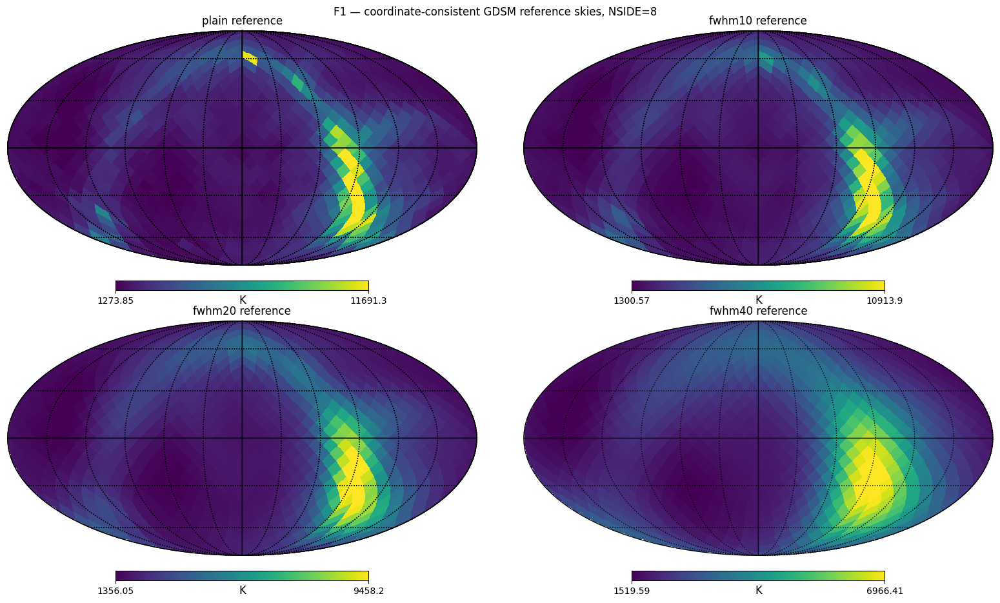

In [9]:
# ============================================================
# F1 — GDSM plain, 10°, 20°, 40° smoothing
# ============================================================

fig = plt.figure(figsize=(16, 9))

for i, key in enumerate(["plain", "fwhm10", "fwhm20", "fwhm40"], start=1):
    m = reference_maps_full[key]
    hp.mollview(
        m,
        fig=fig.number,
        sub=(2, 2, i),
        title=f"{key} reference",
        unit="K",
        min=finite_percentile(m, 1),
        max=finite_percentile(m, 99),
        badcolor="gray",
    )
    hp.graticule()

plt.suptitle(
    f"F1 — coordinate-consistent GDSM reference skies, NSIDE={MAP_NSIDE}",
    y=1.02,
)
save_current_figure("F1_GDSM_plain_10_20_40.png")
plt.show()

## Additional coordinate sanity checks
These plots are retained because they are useful when explaining why the recovered patch does not fill the whole sky.

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/A1_coordinate_G_to_C_sanity.png


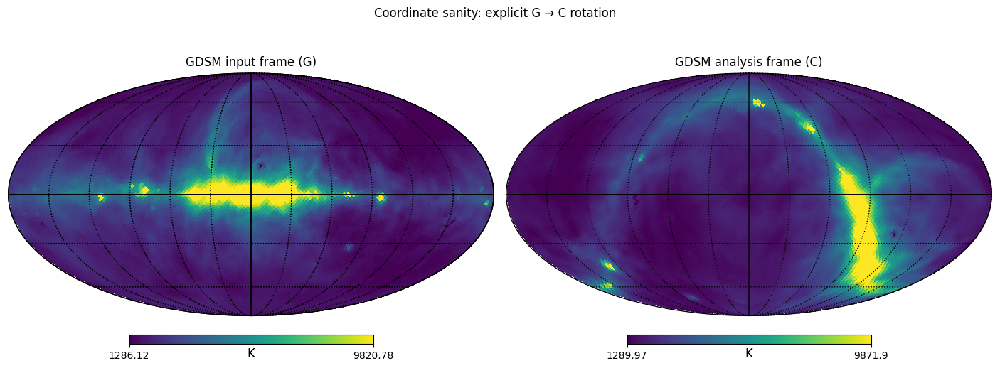

In [10]:
# Input-frame versus analysis-frame sanity figure
fig = plt.figure(figsize=(14, 5))

hp.mollview(
    raw_input_skies[TOD_SKY_NSIDE],
    fig=fig.number,
    sub=(1, 2, 1),
    title=f"GDSM input frame ({SKY_INPUT_COORD})",
    unit="K",
    min=finite_percentile(raw_input_skies[TOD_SKY_NSIDE], 2),
    max=finite_percentile(raw_input_skies[TOD_SKY_NSIDE], 98),
)
hp.graticule()

hp.mollview(
    sky_nside32,
    fig=fig.number,
    sub=(1, 2, 2),
    title=f"GDSM analysis frame ({ANALYSIS_COORD})",
    unit="K",
    min=finite_percentile(sky_nside32, 2),
    max=finite_percentile(sky_nside32, 98),
)
hp.graticule()

plt.suptitle("Coordinate sanity: explicit G → C rotation", y=1.02)
save_current_figure("A1_coordinate_G_to_C_sanity.png")
plt.show()

# 2. Gaussian-beam validation
The Gaussian tests come first because they validate the machinery before introducing the structured horn beam.

In [11]:
# ============================================================
# 2.1 Build Gaussian validation beams
# ============================================================

gaussian_beams = {
    int(fwhm): circular_gaussian_beam(SIM_NSIDE, fwhm)
    for fwhm in FWHM_DEG_LIST
}

for fwhm, beam in gaussian_beams.items():
    print(f"Gaussian {fwhm} deg: nside={hp.get_nside(beam)}, peak={beam.max():.6f}")

Gaussian 10 deg: nside=32, peak=1.000000
Gaussian 20 deg: nside=32, peak=1.000000
Gaussian 40 deg: nside=32, peak=1.000000


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F2_Gaussian_beams_10_20_40.png


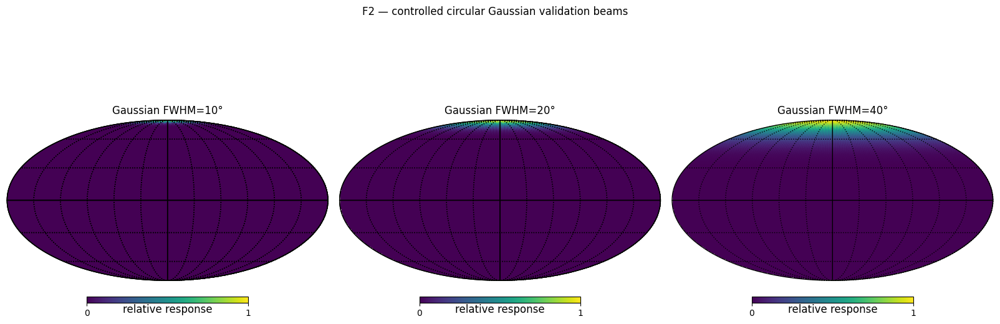

In [12]:
# ============================================================
# F2 — Gaussian beams FWHM 10°, 20°, 40°
# ============================================================

fig = plt.figure(figsize=(16, 5))

for i, fwhm in enumerate([10, 20, 40], start=1):
    beam = gaussian_beams[fwhm]
    hp.mollview(
        beam,
        fig=fig.number,
        sub=(1, 3, i),
        title=f"Gaussian FWHM={fwhm}°",
        unit="relative response",
        min=0,
        max=1,
    )
    hp.graticule()

plt.suptitle("F2 — controlled circular Gaussian validation beams", y=1.03)
save_current_figure("F2_Gaussian_beams_10_20_40.png")
plt.show()

In [13]:
# ============================================================
# 2.2 Gaussian rotation-null calculations
# ============================================================

fast_scan_for_null = rotation_scans["C"]

gaussian_rotation_null_rows = []
gaussian_rotation_null_data = {}

for fwhm, beam in gaussian_beams.items():
    tod_no_rotation = generate_physical_tod(
        beam,
        sky_nside32,
        baseline_scan,
    )

    tod_fast_rotation = generate_physical_tod(
        beam,
        sky_nside32,
        fast_scan_for_null,
    )

    delta = tod_fast_rotation - tod_no_rotation

    relative_max = np.max(np.abs(delta)) / max(
        np.max(np.abs(tod_no_rotation)),
        1e-30,
    )

    relative_rms = np.sqrt(np.mean(delta**2)) / max(
        np.sqrt(np.mean(tod_no_rotation**2)),
        1e-30,
    )

    gaussian_rotation_null_data[fwhm] = {
        "tod_no_rotation": tod_no_rotation,
        "tod_fast_rotation": tod_fast_rotation,
        "delta": delta,
    }

    gaussian_rotation_null_rows.append({
        "fwhm_deg": fwhm,
        "relative_max_difference": relative_max,
        "relative_rms_difference": relative_rms,
    })

gaussian_rotation_null_df = pd.DataFrame(gaussian_rotation_null_rows)
display(gaussian_rotation_null_df)
gaussian_rotation_null_df.to_csv(
    TABLE_DIR / "gaussian_rotation_null.csv",
    index=False,
)

100%|██████████| 1440/1440 [00:01<00:00, 1160.22it/s]


,fwhm_deg,relative_max_difference,relative_rms_difference
0,10,0.006628,0.000607
1,20,0.000817,0.000117
2,40,0.000191,0.000039


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F3_Gaussian_rotation_null.png


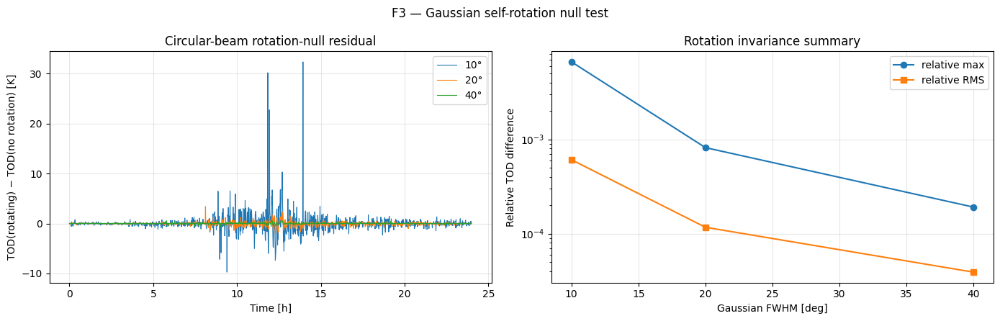

In [14]:
# ============================================================
# F3 — Gaussian rotation-null diagnostic
# ============================================================

fig, ax = plt.subplots(1, 2, figsize=(14, 4.5))

for fwhm in [10, 20, 40]:
    delta = gaussian_rotation_null_data[fwhm]["delta"]

    ax[0].plot(
        baseline_scan["time_h"],
        delta,
        lw=0.8,
        label=f"{fwhm}°",
    )

ax[0].set_xlabel("Time [h]")
ax[0].set_ylabel("TOD(rotating) − TOD(no rotation) [K]")
ax[0].set_title("Circular-beam rotation-null residual")
ax[0].grid(alpha=0.3)
ax[0].legend()

ax[1].semilogy(
    gaussian_rotation_null_df["fwhm_deg"],
    np.maximum(
        gaussian_rotation_null_df["relative_max_difference"],
        1e-30,
    ),
    marker="o",
    label="relative max",
)
ax[1].semilogy(
    gaussian_rotation_null_df["fwhm_deg"],
    np.maximum(
        gaussian_rotation_null_df["relative_rms_difference"],
        1e-30,
    ),
    marker="s",
    label="relative RMS",
)
ax[1].set_xlabel("Gaussian FWHM [deg]")
ax[1].set_ylabel("Relative TOD difference")
ax[1].set_title("Rotation invariance summary")
ax[1].grid(alpha=0.3)
ax[1].legend()

plt.suptitle("F3 — Gaussian self-rotation null test")
plt.tight_layout()
save_current_figure("F3_Gaussian_rotation_null.png")
plt.show()

In [15]:
# ============================================================
# 2.3 Gaussian closure test
# Use FWHM=40° as the representative wide-beam closure figure.
# ============================================================

GAUSSIAN_CLOSURE_FWHM = 40
gaussian_closure_beam = gaussian_beams[GAUSSIAN_CLOSURE_FWHM]

gaussian_mapper = build_mapper_with_matched_operator(
    gaussian_closure_beam,
    baseline_scan,
)
gaussian_A = np.asarray(gaussian_mapper.Tsys_operators, dtype=float)
gaussian_pix = np.asarray(gaussian_mapper.pixel_indices, dtype=int)
gaussian_hits, gaussian_weighted_hits = compute_hitmap_from_operator(gaussian_A)

gaussian_truth_full = reference_maps_full["fwhm40"]
gaussian_truth_patch = full_to_patch(gaussian_truth_full, gaussian_pix)

gaussian_closure_tod = gaussian_A @ gaussian_truth_patch

gaussian_closure_rec, gaussian_closure_unc = recover_native(
    gaussian_mapper,
    gaussian_closure_tod,
    regularization=REG_WEAK,
    dtime=baseline_scan["dt_seconds"],
)

gaussian_closure_residual = gaussian_closure_rec - gaussian_truth_patch

gaussian_closure_metrics = map_metrics(
    gaussian_closure_rec,
    gaussian_truth_patch,
    gaussian_weighted_hits,
    cut=0.0,
)

print("Gaussian closure metrics:", gaussian_closure_metrics)


Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1330.10it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1339.33it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1294.13it/s]

Gaussian closure metrics: {'n_pix': 304, 'rmse': 8.021651647984251, 'bias': -3.2222428606964817, 'std': 7.346022468540306, 'corr': 0.9999474704023465, 'mae': 5.51740311038007, 'p95_abs_residual': 18.081997557793933}


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F4_Gaussian_closure_input_recovered_residual.png


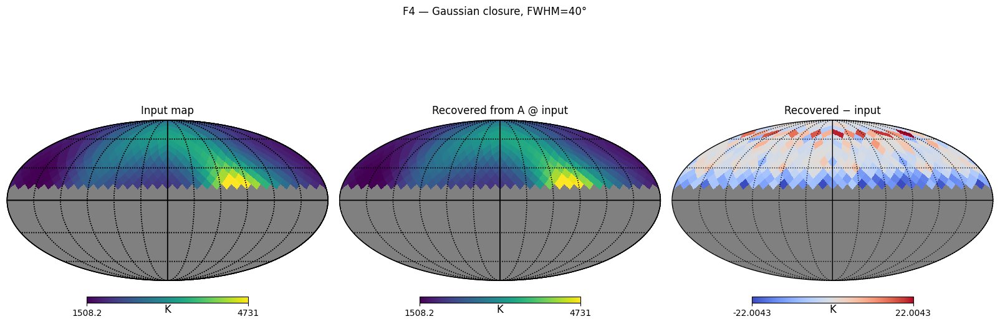

In [16]:
# ============================================================
# F4 — Gaussian closure: input / recovered / residual
# ============================================================

truth_full = patch_to_full(
    gaussian_truth_patch,
    gaussian_pix,
    MAP_NSIDE,
)
rec_full = patch_to_full(
    gaussian_closure_rec,
    gaussian_pix,
    MAP_NSIDE,
)
res_full = patch_to_full(
    gaussian_closure_residual,
    gaussian_pix,
    MAP_NSIDE,
)

vmin = finite_percentile(gaussian_truth_patch, 1)
vmax = finite_percentile(gaussian_truth_patch, 99)
rmax = finite_percentile(np.abs(gaussian_closure_residual), 98, fallback=1.0)

fig = plt.figure(figsize=(16, 5))

hp.mollview(
    truth_full,
    fig=fig.number,
    sub=(1, 3, 1),
    title="Input map",
    unit="K",
    min=vmin,
    max=vmax,
    badcolor="gray",
)
hp.graticule()

hp.mollview(
    rec_full,
    fig=fig.number,
    sub=(1, 3, 2),
    title="Recovered from A @ input",
    unit="K",
    min=vmin,
    max=vmax,
    badcolor="gray",
)
hp.graticule()

hp.mollview(
    res_full,
    fig=fig.number,
    sub=(1, 3, 3),
    title="Recovered − input",
    unit="K",
    min=-rmax,
    max=rmax,
    cmap="coolwarm",
    badcolor="gray",
)
hp.graticule()

plt.suptitle(
    f"F4 — Gaussian closure, FWHM={GAUSSIAN_CLOSURE_FWHM}°",
    y=1.03,
)
save_current_figure("F4_Gaussian_closure_input_recovered_residual.png")
plt.show()

## Additional Gaussian physical-TOD check
This is retained separately from closure: closure asks whether the inverse recovers a map generated by the exact same low-resolution operator; the physical-TOD test uses the independent high-resolution sky → beam → TOD path.

In [17]:
gaussian_physical_results = {}

for fwhm in [10, 20, 40]:
    beam = gaussian_beams[fwhm]
    mapper_g = build_mapper_with_matched_operator(beam, baseline_scan)
    pix_g = np.asarray(mapper_g.pixel_indices, dtype=int)
    A_g = np.asarray(mapper_g.Tsys_operators, dtype=float)
    _, wh_g = compute_hitmap_from_operator(A_g)

    tod_g = generate_physical_tod(beam, sky_nside32, baseline_scan)

    truth_g = full_to_patch(
        reference_maps_full[f"fwhm{fwhm}"],
        pix_g,
    )

    rec_g, unc_g = recover_native(
        mapper_g,
        tod_g,
        regularization=REG_RIDGE,
        dtime=baseline_scan["dt_seconds"],
    )

    gaussian_physical_results[fwhm] = {
        "mapper": mapper_g,
        "pix": pix_g,
        "A": A_g,
        "tod": tod_g,
        "truth_patch": truth_g,
        "recovered": rec_g,
        "unc": unc_g,
        "weighted_hits": wh_g,
        "metrics": map_metrics(rec_g, truth_g, wh_g, cut=PLOT_HIT_CUT),
    }

gaussian_physical_df = pd.DataFrame([
    {"fwhm_deg": fwhm, **result["metrics"]}
    for fwhm, result in gaussian_physical_results.items()
])

display(gaussian_physical_df)
gaussian_physical_df.to_csv(
    TABLE_DIR / "gaussian_physical_TOD_recovery.csv",
    index=False,
)


Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1306.69it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 72


100%|██████████| 1440/1440 [00:01<00:00, 1337.19it/s]


Number of data points: 1440
Number of selected pixels: 72


100%|██████████| 1440/1440 [00:01<00:00, 1127.84it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1309.06it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 164


100%|██████████| 1440/1440 [00:01<00:00, 1283.65it/s]


Number of data points: 1440
Number of selected pixels: 164


100%|██████████| 1440/1440 [00:01<00:00, 1160.76it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1369.05it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1348.76it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1153.34it/s]


,fwhm_deg,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,10,72,867.834886,-77.421978,864.374471,0.733211,506.374874,1927.047638
1,20,164,693.531698,-154.740036,676.048620,0.772395,517.788796,1421.825461
2,40,240,993.168309,-265.470609,957.031162,0.563709,757.509898,1960.427991


# 3. HornDry baseline — 24 h, no rotation
This is the deterministic science baseline. No self-rotation is present here.

In [18]:
# ============================================================
# 3.1 Load HornDry and HornWet at 70 MHz
# ============================================================

horn_dry_file = find_beam_file(HORN_DRY_DIR, FREQ_MHZ)
horn_wet_file = find_beam_file(HORN_WET_DIR, FREQ_MHZ)

horn_dry = load_healpix_beam_from_fits(
    horn_dry_file,
    target_nside=SIM_NSIDE,
)
horn_wet = load_healpix_beam_from_fits(
    horn_wet_file,
    target_nside=SIM_NSIDE,
)

real_beam = horn_dry

print("HornDry:", horn_dry_file)
print("HornWet:", horn_wet_file)
print("HornDry peak/sum:", np.max(horn_dry), np.sum(horn_dry))
print("HornWet peak/sum:", np.max(horn_wet), np.sum(horn_wet))

Chosen beam file: /Users/user/LimTOD/rhino-TODsim/data/HornDry/HornDry70.0.fits
Chosen beam file: /Users/user/LimTOD/rhino-TODsim/data/HornWet/HornWet70.0.fits
HornDry: /Users/user/LimTOD/rhino-TODsim/data/HornDry/HornDry70.0.fits
HornWet: /Users/user/LimTOD/rhino-TODsim/data/HornWet/HornWet70.0.fits
HornDry peak/sum: 1.0 462.2241887653284
HornWet peak/sum: 1.0 417.782611591654


/Users/user/LimTOD/rhino-TODsim/.venv/lib/python3.13/site-packages/healpy/visufunc.py:223: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  f = pylab.figure(fig, figsize=(8.5, 5.4))


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F6_HornDry_70MHz.png


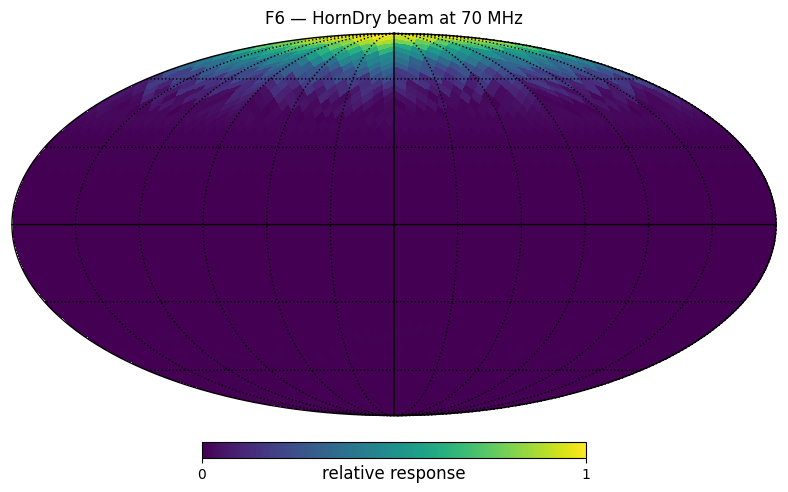

In [19]:
# ============================================================
# F6 — HornDry beam at 70 MHz
# ============================================================

fig = plt.figure(figsize=(8, 5.5))
hp.mollview(
    horn_dry,
    fig=fig.number,
    title=f"F6 — HornDry beam at {FREQ_MHZ:g} MHz",
    unit="relative response",
    min=0,
    max=1,
)
hp.graticule()
save_current_figure("F6_HornDry_70MHz.png")
plt.show()

In [20]:
# ============================================================
# 3.2 Build the baseline matched operator
# ============================================================

baseline_mapper = build_mapper_with_matched_operator(
    horn_dry,
    baseline_scan,
)

baseline_A = np.asarray(
    baseline_mapper.Tsys_operators,
    dtype=float,
)
baseline_pix = np.asarray(
    baseline_mapper.pixel_indices,
    dtype=int,
)

baseline_hits, baseline_weighted_hits = compute_hitmap_from_operator(
    baseline_A
)

baseline_reference_patches = {
    key: full_to_patch(m, baseline_pix)
    for key, m in reference_maps_full.items()
}

baseline_svals = np.linalg.svd(baseline_A, compute_uv=False)

print("Baseline operator")
print("  shape:", baseline_A.shape)
print("  selected pixels:", baseline_pix.size)
print("  rank:", np.linalg.matrix_rank(baseline_A), "/", baseline_A.shape[1])
print("  condition number:", baseline_svals[0] / baseline_svals[-1])
print_percentiles("baseline weighted hits", baseline_weighted_hits)

assert np.allclose(baseline_scan["selfrot_deg"], 0.0)


Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1353.48it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1359.54it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1348.77it/s]

Baseline operator
  shape: (1440, 304)
  selected pixels: 304
  rank: 304 / 304
  condition number: 1602.8045895059547
baseline weighted hits            : min/p1/p5/med/p95/p99/max = 0.29351 / 0.29399 / 0.29697 / 4.1942 / 9.9737 / 10.051 / 10.12


/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_37142/76852618.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Selected-pixel RA range: 0.0 354.375
Selected-pixel Dec range: 14.477512185929925 84.14973293629666
Jodrell zenith Dec ≈ 53.2421
Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/A2_baseline_selected_patch_geometry.png


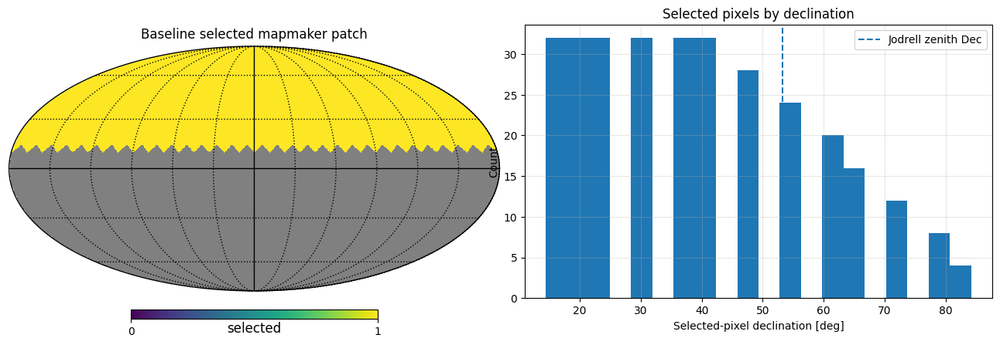

In [21]:
# ============================================================
# 3.3 Selected-pixel geometry — retained diagnostic
# ============================================================

theta_pix, phi_pix = hp.pix2ang(MAP_NSIDE, baseline_pix)
baseline_selected_dec_deg = 90.0 - np.degrees(theta_pix)
baseline_selected_ra_deg = np.degrees(phi_pix)

print("Selected-pixel RA range:",
      baseline_selected_ra_deg.min(),
      baseline_selected_ra_deg.max())
print("Selected-pixel Dec range:",
      baseline_selected_dec_deg.min(),
      baseline_selected_dec_deg.max())
print("Jodrell zenith Dec ≈", ANT_LAT_DEG)

selected_mask_full = np.full(
    hp.nside2npix(MAP_NSIDE),
    hp.UNSEEN,
    dtype=float,
)
selected_mask_full[baseline_pix] = 1.0

fig = plt.figure(figsize=(13, 4.5))

hp.mollview(
    selected_mask_full,
    fig=fig.number,
    sub=(1, 2, 1),
    title="Baseline selected mapmaker patch",
    unit="selected",
    min=0,
    max=1,
    badcolor="gray",
)
hp.graticule()

ax = fig.add_subplot(1, 2, 2)
ax.hist(baseline_selected_dec_deg, bins=20)
ax.axvline(
    ANT_LAT_DEG,
    linestyle="--",
    label="Jodrell zenith Dec",
)
ax.set_xlabel("Selected-pixel declination [deg]")
ax.set_ylabel("Count")
ax.set_title("Selected pixels by declination")
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()
save_current_figure("A2_baseline_selected_patch_geometry.png")
plt.show()

In [22]:
# ============================================================
# 3.4 Baseline physical TOD — NO ROTATION
# ============================================================

baseline_actual_TOD = generate_physical_tod(
    horn_dry,
    sky_nside32,
    baseline_scan,
)

print_percentiles("baseline_actual_TOD", baseline_actual_TOD)

# Explicitly demonstrate that baseline is non-rotating.
print(
    "Baseline selfrot min/max:",
    baseline_scan["selfrot_deg"].min(),
    baseline_scan["selfrot_deg"].max(),
)

100%|██████████| 1440/1440 [00:01<00:00, 1158.88it/s]

baseline_actual_TOD               : min/p1/p5/med/p95/p99/max = 1658.5 / 1659.4 / 1667 / 2672.5 / 3529 / 3561.2 / 3565.4
Baseline selfrot min/max: 0.0 0.0


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F5_baseline_TOD_24h_no_rotation.png


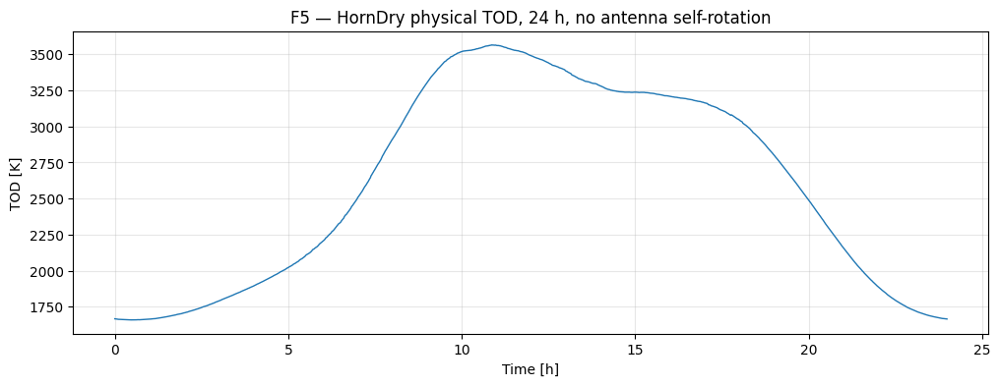

In [23]:
# ============================================================
# F5 — baseline simulated TOD, 24 h no rotation
# ============================================================

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(
    baseline_scan["time_h"],
    baseline_actual_TOD,
    lw=1.0,
)
ax.set_xlabel("Time [h]")
ax.set_ylabel("TOD [K]")
ax.set_title("F5 — HornDry physical TOD, 24 h, no antenna self-rotation")
ax.grid(alpha=0.3)

save_current_figure("F5_baseline_TOD_24h_no_rotation.png")
plt.show()

## Baseline forward-model mismatch against the four reference skies
This is retained because it separates the independent high-resolution TOD from the low-resolution reference approximation.

In [24]:
baseline_forward_rows = []

for ref_name, truth_patch in baseline_reference_patches.items():
    pred = baseline_A @ truth_patch
    diff = baseline_actual_TOD - pred

    baseline_forward_rows.append({
        "reference": ref_name,
        "std_actual_minus_Aref_K": float(np.std(diff)),
        "relative_std_mismatch": float(
            np.std(diff) / max(np.std(baseline_actual_TOD), 1e-30)
        ),
        "corr_TOD_pred": float(
            np.corrcoef(baseline_actual_TOD, pred)[0, 1]
        ),
    })

baseline_forward_df = pd.DataFrame(baseline_forward_rows)
display(baseline_forward_df)
baseline_forward_df.to_csv(
    TABLE_DIR / "baseline_forward_reference_mismatch.csv",
    index=False,
)

,reference,std_actual_minus_Aref_K,relative_std_mismatch,corr_TOD_pred
0,plain,14.131801,0.020678,0.999816
1,fwhm10,27.880209,0.040796,0.999617
2,fwhm20,81.359999,0.119051,0.997279
3,fwhm40,242.608750,0.355000,0.966860


In [25]:
# ============================================================
# 3.5 Baseline native LimTOD recovery
# ============================================================

baseline_rec, baseline_unc = recover_native(
    baseline_mapper,
    baseline_actual_TOD,
    regularization=REG_RIDGE,
    dtime=baseline_scan["dt_seconds"],
)

baseline_truth_patch = baseline_reference_patches[REPRESENTATIVE_REF]
baseline_residual = baseline_rec - baseline_truth_patch

baseline_result = {
    "scenario_id": "A",
    "scan": baseline_scan,
    "tod": baseline_actual_TOD,
    "mapper": baseline_mapper,
    "A": baseline_A,
    "pix": baseline_pix,
    "hits": baseline_hits,
    "weighted_hits": baseline_weighted_hits,
    "truth_patch": baseline_truth_patch,
    "recovered": baseline_rec,
    "unc": baseline_unc,
    "residual": baseline_residual,
    "reference": REPRESENTATIVE_REF,
    "regularization": REG_RIDGE,
    "rank": int(np.linalg.matrix_rank(baseline_A)),
    "condition_number": float(baseline_svals[0] / baseline_svals[-1]),
}

print(
    "Baseline metrics all:",
    map_metrics(
        baseline_rec,
        baseline_truth_patch,
        baseline_weighted_hits,
        cut=0.0,
    ),
)
print(
    f"Baseline metrics weighted_hit>{PLOT_HIT_CUT}:",
    map_metrics(
        baseline_rec,
        baseline_truth_patch,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    ),
)

Baseline metrics all: {'n_pix': 304, 'rmse': 1297.7551806430135, 'bias': -456.2246155670046, 'std': 1214.9187664352376, 'corr': 0.4208828981989792, 'mae': 961.924150647454, 'p95_abs_residual': 2614.5402469552473}
Baseline metrics weighted_hit>1.0: {'n_pix': 240, 'rmse': 1037.8834423849974, 'bias': -145.18757019182902, 'std': 1027.6782616357734, 'corr': 0.5736726712445452, 'mae': 785.7403146270648, 'p95_abs_residual': 2155.1842582832046}


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F7_HornDry_baseline_6panel.png


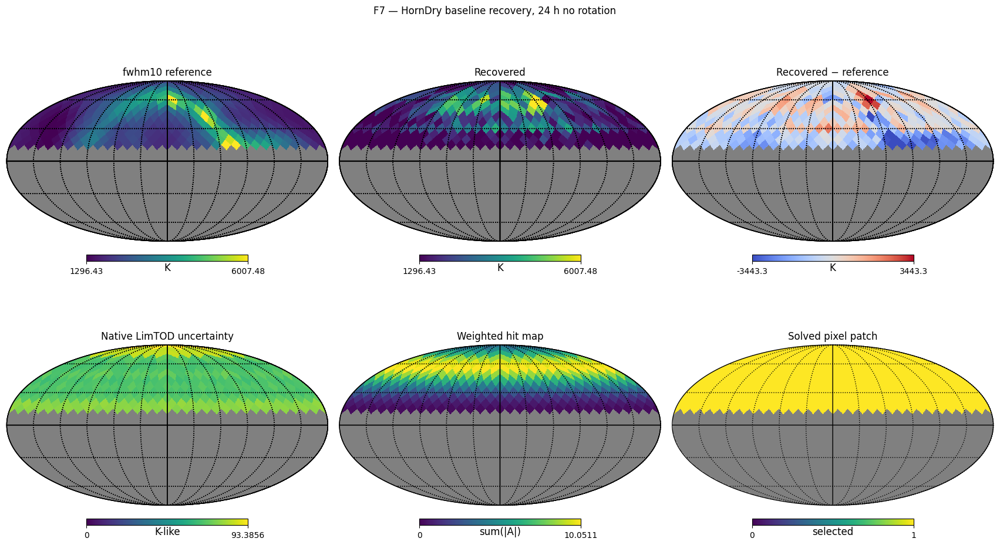

In [26]:
# ============================================================
# F7 — HornDry baseline 6-panel recovery diagnostic
# reference / recovered / residual / uncertainty / hit / mask
# ============================================================

truth_full = patch_to_full(
    baseline_truth_patch,
    baseline_pix,
    MAP_NSIDE,
)
rec_full = patch_to_full(
    baseline_rec,
    baseline_pix,
    MAP_NSIDE,
)
res_full = patch_to_full(
    baseline_residual,
    baseline_pix,
    MAP_NSIDE,
)
unc_full = patch_to_full(
    baseline_unc,
    baseline_pix,
    MAP_NSIDE,
)
hit_full = patch_to_full(
    baseline_weighted_hits,
    baseline_pix,
    MAP_NSIDE,
)

mask_full = np.full(
    hp.nside2npix(MAP_NSIDE),
    hp.UNSEEN,
    dtype=float,
)
mask_full[baseline_pix] = 1.0

vmin = finite_percentile(baseline_truth_patch, 1)
vmax = finite_percentile(baseline_truth_patch, 99)
rmax = finite_percentile(np.abs(baseline_residual), 98, fallback=1.0)
umax = finite_percentile(baseline_unc, 99, fallback=1.0)
hmax = finite_percentile(baseline_weighted_hits, 99, fallback=1.0)

fig = plt.figure(figsize=(17, 9))

hp.mollview(
    truth_full, fig=fig.number, sub=(2, 3, 1),
    title=f"{REPRESENTATIVE_REF} reference",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    rec_full, fig=fig.number, sub=(2, 3, 2),
    title="Recovered",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    res_full, fig=fig.number, sub=(2, 3, 3),
    title="Recovered − reference",
    unit="K", min=-rmax, max=rmax,
    cmap="coolwarm", badcolor="gray",
)
hp.graticule()

hp.mollview(
    unc_full, fig=fig.number, sub=(2, 3, 4),
    title="Native LimTOD uncertainty",
    unit="K-like", min=0, max=umax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    hit_full, fig=fig.number, sub=(2, 3, 5),
    title="Weighted hit map",
    unit="sum(|A|)", min=0, max=hmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    mask_full, fig=fig.number, sub=(2, 3, 6),
    title="Solved pixel patch",
    unit="selected", min=0, max=1, badcolor="gray",
)
hp.graticule()

plt.suptitle("F7 — HornDry baseline recovery, 24 h no rotation", y=1.02)
save_current_figure("F7_HornDry_baseline_6panel.png")
plt.show()

In [27]:
# ============================================================
# 3.6 Baseline recovery metrics versus every reference
# ============================================================

baseline_reference_metric_rows = []

for ref_name, full_ref in reference_maps_full.items():
    truth_patch = full_to_patch(full_ref, baseline_pix)

    for hit_cut in [0.0, PLOT_HIT_CUT]:
        met = map_metrics(
            baseline_rec,
            truth_patch,
            baseline_weighted_hits,
            cut=hit_cut,
        )

        baseline_reference_metric_rows.append({
            "reference": ref_name,
            "weighted_hit_cut": hit_cut,
            **met,
        })

baseline_reference_metrics_df = pd.DataFrame(
    baseline_reference_metric_rows
)

display(baseline_reference_metrics_df)
baseline_reference_metrics_df.to_csv(
    TABLE_DIR / "baseline_reference_metrics.csv",
    index=False,
)

,reference,weighted_hit_cut,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,plain,0.0,304,1396.267583,-454.306365,1320.291213,0.374562,1007.411732,2759.963259
1,plain,1.0,240,1171.398288,-135.653241,1163.517146,0.500926,835.960022,1998.510200
2,fwhm10,0.0,304,1297.755181,-456.224616,1214.918766,0.420883,961.924151,2614.540247
3,fwhm10,1.0,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
4,fwhm20,0.0,304,1250.421297,-460.483397,1162.543961,0.438515,940.262879,2572.199009
5,fwhm20,1.0,240,999.469335,-161.700511,986.302132,0.595518,769.421189,2028.387448
6,fwhm40,0.0,304,1250.403314,-477.133243,1155.790776,0.403568,973.275430,2504.735488
7,fwhm40,1.0,240,1045.313452,-187.636970,1028.334858,0.543848,816.083741,2137.552230


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F8_baseline_reference_smoothing_metrics.png


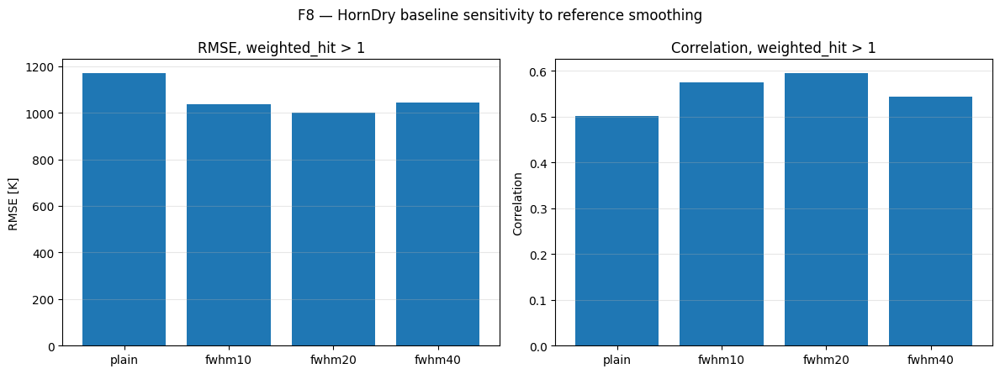

In [28]:
# ============================================================
# F8 — baseline recovery vs plain / 10 / 20 / 40 references
# ============================================================

f8_df = baseline_reference_metrics_df[
    baseline_reference_metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT
].copy()

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))

ax[0].bar(
    f8_df["reference"],
    f8_df["rmse"],
)
ax[0].set_ylabel("RMSE [K]")
ax[0].set_title(
    f"RMSE, weighted_hit > {PLOT_HIT_CUT:g}"
)
ax[0].grid(axis="y", alpha=0.3)

ax[1].bar(
    f8_df["reference"],
    f8_df["corr"],
)
ax[1].set_ylabel("Correlation")
ax[1].set_title(
    f"Correlation, weighted_hit > {PLOT_HIT_CUT:g}"
)
ax[1].grid(axis="y", alpha=0.3)

plt.suptitle(
    "F8 — HornDry baseline sensitivity to reference smoothing"
)
plt.tight_layout()
save_current_figure("F8_baseline_reference_smoothing_metrics.png")
plt.show()

# 4. Rotation A–G
All scenarios use the same sky, HornDry beam, threshold, truncation, normalisation and native LimTOD recovery settings. Only the scan/self-rotation strategy changes.

In [29]:
# ============================================================
# 4.1 Run A–G
# ============================================================

rotation_results = {}

for case_id in ["A", "B", "C", "D", "E", "F", "G"]:
    scan = rotation_scans[case_id]

    print("\n" + "=" * 90)
    print(case_id, scan["label"])
    print("=" * 90)

    result = run_native_scenario(
        scenario_id=case_id,
        scan=scan,
        beam_tod=horn_dry,
        beam_mapper=horn_dry,
        sky_map=sky_nside32,
        reference_full=reference_maps_full[REPRESENTATIVE_REF],
        reference_name=REPRESENTATIVE_REF,
        regularization=REG_RIDGE,
    )

    rotation_results[case_id] = result

rotation_metric_rows = []

for case_id, result in rotation_results.items():
    for hit_cut in [0.0, PLOT_HIT_CUT]:
        met = map_metrics(
            result["recovered"],
            result["truth_patch"],
            result["weighted_hits"],
            cut=hit_cut,
        )

        rotation_metric_rows.append({
            "ID": case_id,
            "label": result["scan"]["label"],
            "weighted_hit_cut": hit_cut,
            "n_days": result["scan"]["n_days"],
            "rotation_period_hours": result["scan"]["rotation_period_hours"],
            "same_lst_each_day": result["scan"]["same_lst_each_day"],
            "daily_phase_step_deg": result["scan"]["daily_phase_step_deg"],
            "n_tod": len(result["tod"]),
            "n_selected_pix": len(result["pix"]),
            "rank": result["rank"],
            "condition_number": result["condition_number"],
            **met,
        })

rotation_metrics_df = pd.DataFrame(rotation_metric_rows)

display(rotation_metrics_df)
rotation_metrics_df.to_csv(
    TABLE_DIR / "rotation_A_to_G_metrics.csv",
    index=False,
)


A A_no_rotation_24h


100%|██████████| 1440/1440 [00:01<00:00, 1142.35it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1343.25it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1357.09it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1336.73it/s]



B B_slow_rotation_24h_one_turn_per_day


100%|██████████| 1440/1440 [00:01<00:00, 1144.51it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1343.52it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 319


100%|██████████| 1440/1440 [00:01<00:00, 1356.75it/s]


Number of data points: 1440
Number of selected pixels: 319


100%|██████████| 1440/1440 [00:01<00:00, 1350.08it/s]



C C_fast_rotation_24h_one_turn_per_hour


100%|██████████| 1440/1440 [00:01<00:00, 1106.58it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1270.41it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 336


100%|██████████| 1440/1440 [00:01<00:00, 1316.37it/s]


Number of data points: 1440
Number of selected pixels: 336


100%|██████████| 1440/1440 [00:01<00:00, 1345.89it/s]



D D_same_LST_6days_60deg_step


100%|██████████| 8640/8640 [00:07<00:00, 1108.34it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 8640/8640 [00:06<00:00, 1332.40it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 8640
Number of selected pixels: 336


100%|██████████| 8640/8640 [00:06<00:00, 1352.22it/s]


Number of data points: 8640
Number of selected pixels: 336


100%|██████████| 8640/8640 [00:06<00:00, 1362.18it/s]



E E_same_LST_12days_30deg_step


100%|██████████| 17280/17280 [00:14<00:00, 1164.07it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:12<00:00, 1354.33it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1346.98it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1350.75it/s]



F F_same_LST_3days_fast_hourly


100%|██████████| 4320/4320 [00:03<00:00, 1084.72it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 4320/4320 [00:03<00:00, 1285.05it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 4320
Number of selected pixels: 336


100%|██████████| 4320/4320 [00:03<00:00, 1280.88it/s]


Number of data points: 4320
Number of selected pixels: 336


100%|██████████| 4320/4320 [00:03<00:00, 1297.48it/s]



G G_same_LST_12days_fast_hourly


100%|██████████| 17280/17280 [00:15<00:00, 1111.29it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:13<00:00, 1316.79it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1329.85it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1368.50it/s]


,ID,label,weighted_hit_cut,n_days,rotation_period_hours,same_lst_each_day,daily_phase_step_deg,n_tod,n_selected_pix,rank,condition_number,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,A,A_no_rotation_24h,0.0,1,NaN,False,0.0,1440,304,304,1602.804590,304,1297.755181,-456.224616,1214.918766,0.420883,961.924151,2614.540247
1,A,A_no_rotation_24h,1.0,1,NaN,False,0.0,1440,304,304,1602.804590,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
2,B,B_slow_rotation_24h_one_turn_per_day,0.0,1,24.0,False,0.0,1440,319,319,1331.610032,319,1269.010441,-434.191881,1192.419770,0.406757,949.306610,2387.812586
3,B,B_slow_rotation_24h_one_turn_per_day,1.0,1,24.0,False,0.0,1440,319,319,1331.610032,240,968.341303,-134.015474,959.022800,0.594488,775.222739,2068.940415
4,C,C_fast_rotation_24h_one_turn_per_hour,0.0,1,1.0,False,0.0,1440,336,336,1669.927921,336,1063.724825,-320.050215,1014.434997,0.559163,584.299231,2099.983664
5,C,C_fast_rotation_24h_one_turn_per_hour,1.0,1,1.0,False,0.0,1440,336,336,1669.927921,240,371.673312,33.529149,370.157868,0.924744,281.377963,696.626568
6,D,D_same_LST_6days_60deg_step,0.0,6,NaN,True,60.0,8640,336,336,1272.168759,336,1075.497901,-187.125421,1059.093863,0.518307,684.040073,1896.655079
7,D,D_same_LST_6days_60deg_step,1.0,6,NaN,True,60.0,8640,336,336,1272.168759,304,709.318932,10.651607,709.238952,0.734993,538.569849,1358.522433
8,E,E_same_LST_12days_30deg_step,0.0,12,NaN,True,30.0,17280,336,336,718.756759,336,802.328234,-129.228241,791.852674,0.706586,500.316703,1562.770855
9,E,E_same_LST_12days_30deg_step,1.0,12,NaN,True,30.0,17280,336,336,718.756759,304,601.837647,-23.307030,601.386178,0.801467,414.909136,1221.158462


,ID,rmse,corr,median_uncertainty,p95_uncertainty,condition_number
0,A,1037.883442,0.573673,67.859221,84.785804,1602.804590
1,B,968.341303,0.594488,60.798695,69.654350,1331.610032
2,C,371.673312,0.924744,30.149693,38.434205,1669.927921
3,D,709.318932,0.734993,17.189210,27.258513,1272.168759
4,E,601.837647,0.801467,10.796298,18.010474,718.756759
5,F,451.013106,0.887659,18.630795,26.704246,1669.927921
6,G,726.940296,0.733036,10.897512,19.529885,1669.927921


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F9_rotation_A_to_G_uncertainty_metrics.png


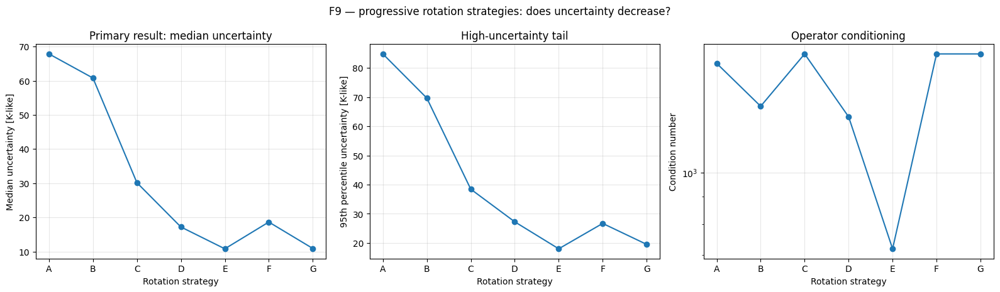

In [30]:
# ============================================================
# F9 — Rotation A–G: uncertainty is the primary result
# ============================================================

f9_df = rotation_metrics_df[
    rotation_metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT
].copy()

# Add uncertainty summaries from each case.
uncertainty_rows = []
for case_id in ["A", "B", "C", "D", "E", "F", "G"]:
    result = rotation_results[case_id]
    good = result["weighted_hits"] > PLOT_HIT_CUT

    uncertainty_rows.append({
        "ID": case_id,
        "median_uncertainty": float(np.median(result["unc"][good])),
        "p95_uncertainty": float(np.percentile(result["unc"][good], 95)),
        "median_weighted_hit": float(np.median(result["weighted_hits"][good])),
    })

uncertainty_df = pd.DataFrame(uncertainty_rows)

f9_df = f9_df.merge(
    uncertainty_df,
    on="ID",
    how="left",
)

display(
    f9_df[
        [
            "ID", "rmse", "corr",
            "median_uncertainty", "p95_uncertainty",
            "condition_number"
        ]
    ]
)

fig, ax = plt.subplots(1, 3, figsize=(16, 4.7))

ax[0].plot(
    f9_df["ID"],
    f9_df["median_uncertainty"],
    marker="o",
)
ax[0].set_xlabel("Rotation strategy")
ax[0].set_ylabel("Median uncertainty [K-like]")
ax[0].set_title("Primary result: median uncertainty")
ax[0].grid(alpha=0.3)

ax[1].plot(
    f9_df["ID"],
    f9_df["p95_uncertainty"],
    marker="o",
)
ax[1].set_xlabel("Rotation strategy")
ax[1].set_ylabel("95th percentile uncertainty [K-like]")
ax[1].set_title("High-uncertainty tail")
ax[1].grid(alpha=0.3)

ax[2].plot(
    f9_df["ID"],
    f9_df["condition_number"],
    marker="o",
)
ax[2].set_yscale("log")
ax[2].set_xlabel("Rotation strategy")
ax[2].set_ylabel("Condition number")
ax[2].set_title("Operator conditioning")
ax[2].grid(alpha=0.3)

plt.suptitle(
    "F9 — progressive rotation strategies: does uncertainty decrease?"
)
plt.tight_layout()
save_current_figure("F9_rotation_A_to_G_uncertainty_metrics.png")
plt.show()

In [31]:
# ============================================================
# 4.2 Common-pixel comparison and uncertainty ranking
# Fully self-contained
# ============================================================

if "rotation_results" not in globals():
    raise RuntimeError(
        "rotation_results is missing. Run the A–G rotation sweep first."
    )

required_cases = ["A", "B", "C", "D", "E", "F", "G"]

missing_cases = [
    case_id
    for case_id in required_cases
    if case_id not in rotation_results
]

if missing_cases:
    raise RuntimeError(
        f"rotation_results is missing cases: {missing_cases}"
    )

npix_map = hp.nside2npix(MAP_NSIDE)

# ------------------------------------------------------------
# Find pixels that are well observed in every A–G scenario.
# ------------------------------------------------------------

common_good_full = np.ones(npix_map, dtype=bool)

for case_id in required_cases:
    result = rotation_results[case_id]

    pix = np.asarray(result["pix"], dtype=int)
    weighted_hits = np.asarray(
        result["weighted_hits"],
        dtype=float,
    )

    local_good = (
        np.isfinite(weighted_hits)
        & (weighted_hits > PLOT_HIT_CUT)
    )

    good_full = np.zeros(npix_map, dtype=bool)
    good_full[pix[local_good]] = True

    common_good_full &= good_full

rotation_common_pix = np.where(common_good_full)[0]

if rotation_common_pix.size == 0:
    raise RuntimeError(
        "No common well-observed pixels remain across A–G. "
        "Check PLOT_HIT_CUT and selected-pixel support."
    )

print(
    f"Common well-observed pixels across A–G: "
    f"{rotation_common_pix.size}"
)

# ------------------------------------------------------------
# Compare all strategies on those exact same pixels.
# ------------------------------------------------------------

rotation_common_rows = []

for case_id in required_cases:
    result = rotation_results[case_id]

    pix = np.asarray(result["pix"], dtype=int)

    pixel_lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix in enumerate(pix)
    }

    missing_common = [
        int(full_pix)
        for full_pix in rotation_common_pix
        if int(full_pix) not in pixel_lookup
    ]

    if missing_common:
        raise RuntimeError(
            f"{case_id}: {len(missing_common)} common pixels "
            "are missing from the recovered patch."
        )

    idx = np.asarray(
        [
            pixel_lookup[int(full_pix)]
            for full_pix in rotation_common_pix
        ],
        dtype=int,
    )

    recovered = np.asarray(
        result["recovered"],
        dtype=float,
    )[idx]

    truth = np.asarray(
        result["truth_patch"],
        dtype=float,
    )[idx]

    uncertainty = np.asarray(
        result["unc"],
        dtype=float,
    )[idx]

    weighted_hits = np.asarray(
        result["weighted_hits"],
        dtype=float,
    )[idx]

    residual = recovered - truth

    rmse = float(
        np.sqrt(np.mean(residual**2))
    )

    mae = float(
        np.mean(np.abs(residual))
    )

    corr = np.nan
    if (
        np.std(recovered) > 0
        and np.std(truth) > 0
    ):
        corr = float(
            np.corrcoef(
                recovered,
                truth,
            )[0, 1]
        )

    finite_unc = uncertainty[
        np.isfinite(uncertainty)
    ]

    if finite_unc.size > 0:
        median_unc = float(np.median(finite_unc))
        mean_unc = float(np.mean(finite_unc))
        p95_unc = float(
            np.percentile(finite_unc, 95)
        )
    else:
        median_unc = np.nan
        mean_unc = np.nan
        p95_unc = np.nan

    rotation_common_rows.append({
        "ID": case_id,
        "n_common_pix": int(
            rotation_common_pix.size
        ),
        "rmse": rmse,
        "mae": mae,
        "corr": corr,
        "median_unc_common": median_unc,
        "mean_unc_common": mean_unc,
        "p95_unc_common": p95_unc,
        "median_weighted_hit_common": float(
            np.median(weighted_hits)
        ),
    })

rotation_common_df = pd.DataFrame(
    rotation_common_rows
)

display(rotation_common_df)

rotation_common_df.to_csv(
    TABLE_DIR / "rotation_A_to_G_common_pixel_metrics.csv",
    index=False,
)

# ------------------------------------------------------------
# Rank by uncertainty.
# ------------------------------------------------------------

uncertainty_rank_df = (
    rotation_common_df[
        [
            "ID",
            "median_unc_common",
            "p95_unc_common",
            "rmse",
            "corr",
        ]
    ]
    .sort_values(
        [
            "median_unc_common",
            "p95_unc_common",
        ],
        ascending=True,
    )
    .reset_index(drop=True)
)

display(uncertainty_rank_df)

BEST_UNCERTAINTY_CASE = (
    uncertainty_rank_df.iloc[0]["ID"]
)

print(
    "Lowest-uncertainty case:",
    BEST_UNCERTAINTY_CASE,
)

# G is the adopted high-orientation-diversity case for
# the later beam-mismatch comparison.
MISMATCH_ROTATION_CASE = "G"

# ------------------------------------------------------------
# Reduction relative to A.
# ------------------------------------------------------------

a_row = rotation_common_df[
    rotation_common_df["ID"] == "A"
].iloc[0]

baseline_unc = float(
    a_row["median_unc_common"]
)

rotation_common_df[
    "median_unc_reduction_vs_A_percent"
] = (
    100.0
    * (
        baseline_unc
        - rotation_common_df["median_unc_common"]
    )
    / max(baseline_unc, 1e-30)
)

display(
    rotation_common_df[
        [
            "ID",
            "median_unc_common",
            "p95_unc_common",
            "median_unc_reduction_vs_A_percent",
        ]
    ]
)

g_row = rotation_common_df[
    rotation_common_df["ID"] == "G"
].iloc[0]

print(
    "G median uncertainty reduction vs A [%]:",
    g_row[
        "median_unc_reduction_vs_A_percent"
    ],
)

Common well-observed pixels across A–G: 240


,ID,n_common_pix,rmse,mae,corr,median_unc_common,mean_unc_common,p95_unc_common,median_weighted_hit_common
0,A,240,1037.883442,785.740315,0.573673,67.859221,69.696368,84.785804,6.415873
1,B,240,968.341303,775.222739,0.594488,60.798695,61.116809,69.654350,6.346813
2,C,240,371.673312,281.377963,0.924744,30.149693,31.055719,38.434205,6.425443
3,D,240,616.801457,489.286547,0.804411,15.385302,16.313900,19.203782,38.560451
4,E,240,451.137753,344.051299,0.885925,9.385698,9.938350,11.994962,77.270831
5,F,240,402.632406,304.548809,0.914106,18.269536,18.892265,23.738352,19.276329
6,G,240,422.686344,317.779110,0.906507,9.355864,9.698355,12.246401,77.105316


,ID,median_unc_common,p95_unc_common,rmse,corr
0,G,9.355864,12.246401,422.686344,0.906507
1,E,9.385698,11.994962,451.137753,0.885925
2,D,15.385302,19.203782,616.801457,0.804411
3,F,18.269536,23.738352,402.632406,0.914106
4,C,30.149693,38.434205,371.673312,0.924744
5,B,60.798695,69.654350,968.341303,0.594488
6,A,67.859221,84.785804,1037.883442,0.573673


Lowest-uncertainty case: G


,ID,median_unc_common,p95_unc_common,median_unc_reduction_vs_A_percent
0,A,67.859221,84.785804,0.000000
1,B,60.798695,69.654350,10.404668
2,C,30.149693,38.434205,55.570235
3,D,15.385302,19.203782,77.327618
4,E,9.385698,11.994962,86.168869
5,F,18.269536,23.738352,73.077298
6,G,9.355864,12.246401,86.212834


G median uncertainty reduction vs A [%]: 86.2128336653519


## 4.2a Rotation maps first: what does A–G actually recover?

Before reducing the rotation experiment to a bar chart, inspect the recovered sky itself.
The following two figures put **A–G on the same common-pixel support and the same colour
scales**, so differences cannot be hidden by changing sky coverage or plotting limits.

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F9A_rotation_A_to_G_recovered_sky_atlas.png


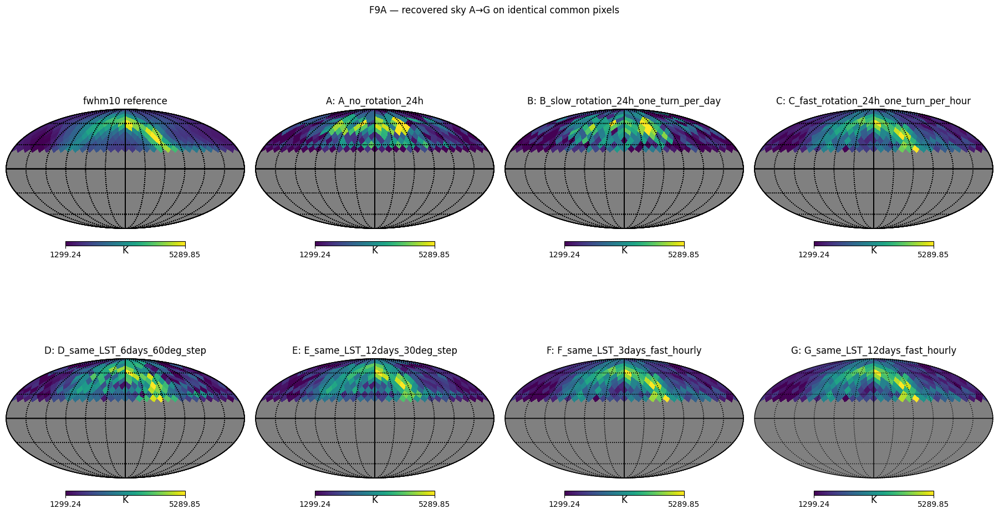

In [32]:
# ============================================================
# F9A — A–G recovered-sky atlas on identical common pixels
# ============================================================

def extract_result_on_full_pixels(result, full_pixels):
    lookup = {
        int(p): i
        for i, p in enumerate(result["pix"])
    }
    idx = np.asarray(
        [lookup[int(p)] for p in full_pixels],
        dtype=int,
    )
    return {
        "truth": result["truth_patch"][idx],
        "recovered": result["recovered"][idx],
        "residual": result["residual"][idx],
        "weighted_hits": result["weighted_hits"][idx],
        "unc": result["unc"][idx],
    }

rotation_common_data = {
    case_id: extract_result_on_full_pixels(
        result,
        rotation_common_pix,
    )
    for case_id, result in rotation_results.items()
}

common_truth = rotation_common_data["A"]["truth"]

vmin = finite_percentile(common_truth, 1)
vmax = finite_percentile(common_truth, 99)

fig = plt.figure(figsize=(18, 9))

truth_full = patch_to_full(
    common_truth,
    rotation_common_pix,
    MAP_NSIDE,
)

hp.mollview(
    truth_full,
    fig=fig.number,
    sub=(2, 4, 1),
    title=f"{REPRESENTATIVE_REF} reference",
    unit="K",
    min=vmin,
    max=vmax,
    badcolor="gray",
)
hp.graticule()

for panel, case_id in enumerate(
    ["A", "B", "C", "D", "E", "F", "G"],
    start=2,
):
    rec_full = patch_to_full(
        rotation_common_data[case_id]["recovered"],
        rotation_common_pix,
        MAP_NSIDE,
    )

    label = rotation_scans[case_id]["label"]

    hp.mollview(
        rec_full,
        fig=fig.number,
        sub=(2, 4, panel),
        title=f"{case_id}: {label}",
        unit="K",
        min=vmin,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()

plt.suptitle(
    "F9A — recovered sky A→G on identical common pixels",
    y=1.02,
)
save_current_figure("F9A_rotation_A_to_G_recovered_sky_atlas.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F9B_rotation_A_to_G_uncertainty_atlas.png


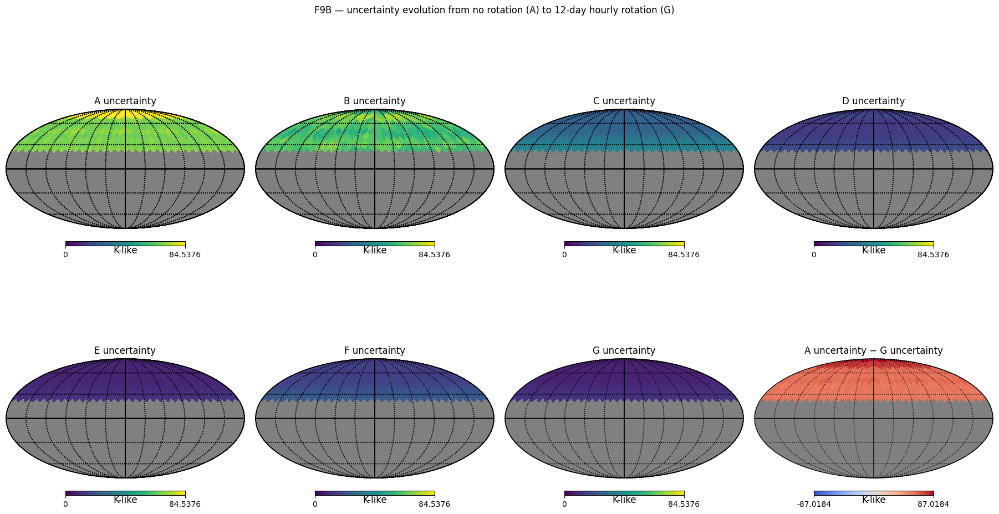

In [33]:
# ============================================================
# F9B — A–G uncertainty-map atlas on identical common pixels
# ============================================================

all_common_uncertainty = np.concatenate([
    rotation_common_data[case_id]["unc"]
    for case_id in ["A", "B", "C", "D", "E", "F", "G"]
])

unc_limit = finite_percentile(
    all_common_uncertainty,
    99,
    fallback=1.0,
)

fig = plt.figure(figsize=(18, 9))

for panel, case_id in enumerate(
    ["A", "B", "C", "D", "E", "F", "G"],
    start=1,
):
    unc_full = patch_to_full(
        rotation_common_data[case_id]["unc"],
        rotation_common_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        unc_full,
        fig=fig.number,
        sub=(2, 4, panel),
        title=f"{case_id} uncertainty",
        unit="K-like",
        min=0,
        max=unc_limit,
        badcolor="gray",
    )
    hp.graticule()

# Last panel: uncertainty reduction from A to G.
uncertainty_reduction = (
    rotation_common_data["A"]["unc"]
    - rotation_common_data["G"]["unc"]
)
reduction_limit = finite_percentile(
    np.abs(uncertainty_reduction),
    99,
    fallback=1.0,
)
reduction_full = patch_to_full(
    uncertainty_reduction,
    rotation_common_pix,
    MAP_NSIDE,
)

hp.mollview(
    reduction_full,
    fig=fig.number,
    sub=(2, 4, 8),
    title="A uncertainty − G uncertainty",
    unit="K-like",
    min=-reduction_limit,
    max=reduction_limit,
    cmap="coolwarm",
    badcolor="gray",
)
hp.graticule()

plt.suptitle(
    "F9B — uncertainty evolution from no rotation (A) to 12-day hourly rotation (G)",
    y=1.02,
)
save_current_figure("F9B_rotation_A_to_G_uncertainty_atlas.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F10_rotation_common_pixel_uncertainty.png


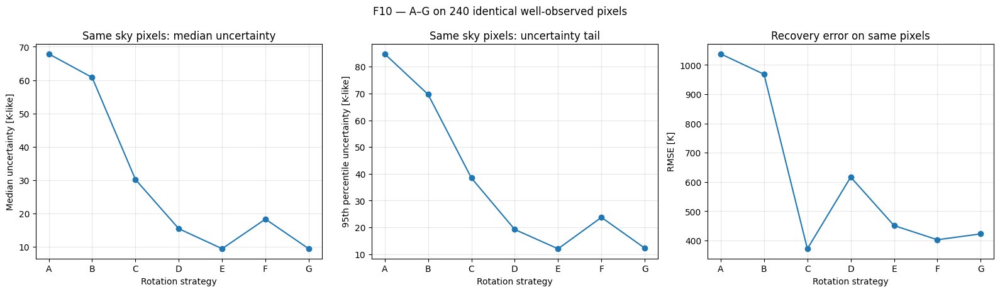

In [34]:
# ============================================================
# F10 — Rotation A–G: common-pixel uncertainty comparison
# ============================================================

fig, ax = plt.subplots(1, 3, figsize=(16, 4.7))

ax[0].plot(
    rotation_common_df["ID"],
    rotation_common_df["median_unc_common"],
    marker="o",
)
ax[0].set_xlabel("Rotation strategy")
ax[0].set_ylabel("Median uncertainty [K-like]")
ax[0].set_title("Same sky pixels: median uncertainty")
ax[0].grid(alpha=0.3)

ax[1].plot(
    rotation_common_df["ID"],
    rotation_common_df["p95_unc_common"],
    marker="o",
)
ax[1].set_xlabel("Rotation strategy")
ax[1].set_ylabel("95th percentile uncertainty [K-like]")
ax[1].set_title("Same sky pixels: uncertainty tail")
ax[1].grid(alpha=0.3)

ax[2].plot(
    rotation_common_df["ID"],
    rotation_common_df["rmse"],
    marker="o",
    label="RMSE",
)
ax[2].set_xlabel("Rotation strategy")
ax[2].set_ylabel("RMSE [K]")
ax[2].set_title("Recovery error on same pixels")
ax[2].grid(alpha=0.3)

plt.suptitle(
    f"F10 — A–G on {len(rotation_common_pix)} identical well-observed pixels"
)
plt.tight_layout()
save_current_figure("F10_rotation_common_pixel_uncertainty.png")
plt.show()

In [35]:
# ============================================================
# Rotation uncertainty reduction relative to no rotation
# ============================================================

baseline_unc_median = float(
    rotation_common_df.loc[
        rotation_common_df["ID"] == "A",
        "median_unc_common",
    ].iloc[0]
)

rotation_uncertainty_reduction_df = rotation_common_df[
    [
        "ID",
        "median_unc_common",
        "p95_unc_common",
        "rmse",
        "corr",
    ]
].copy()

rotation_uncertainty_reduction_df[
    "median_uncertainty_reduction_percent_vs_A"
] = (
    100.0
    * (
        baseline_unc_median
        - rotation_uncertainty_reduction_df["median_unc_common"]
    )
    / max(baseline_unc_median, 1e-30)
)

display(rotation_uncertainty_reduction_df)

rotation_uncertainty_reduction_df.to_csv(
    TABLE_DIR / "rotation_uncertainty_reduction_vs_A.csv",
    index=False,
)

g_row = rotation_uncertainty_reduction_df[
    rotation_uncertainty_reduction_df["ID"] == "G"
].iloc[0]

print(
    "G median-uncertainty reduction relative to A [%]:",
    g_row["median_uncertainty_reduction_percent_vs_A"],
)

,ID,median_unc_common,p95_unc_common,rmse,corr,median_uncertainty_reduction_percent_vs_A
0,A,67.859221,84.785804,1037.883442,0.573673,0.000000
1,B,60.798695,69.654350,968.341303,0.594488,10.404668
2,C,30.149693,38.434205,371.673312,0.924744,55.570235
3,D,15.385302,19.203782,616.801457,0.804411,77.327618
4,E,9.385698,11.994962,451.137753,0.885925,86.168869
5,F,18.269536,23.738352,402.632406,0.914106,73.077298
6,G,9.355864,12.246401,422.686344,0.906507,86.212834


G median-uncertainty reduction relative to A [%]: 86.2128336653519


In [36]:
# ============================================================
# 4.3 Fixed-LST orientation coverage
# ============================================================

def orientation_coverage_by_lst(scan, bin_width_deg=5.0):
    lst = np.asarray(scan["LST_deg"], dtype=float) % 360.0
    rot = np.asarray(scan["selfrot_deg"], dtype=float) % 360.0

    edges = np.arange(
        0.0,
        360.0 + bin_width_deg,
        bin_width_deg,
    )

    rows = []

    for lo, hi in zip(edges[:-1], edges[1:]):
        mask = (lst >= lo) & (lst < hi)

        if not np.any(mask):
            continue

        angles = np.sort(rot[mask])

        if angles.size <= 1:
            coverage = 0.0
        else:
            gaps = np.diff(
                np.r_[angles, angles[0] + 360.0]
            )
            coverage = 360.0 - np.max(gaps)

        rows.append({
            "lst_bin_centre": 0.5 * (lo + hi),
            "n_samples": int(mask.sum()),
            "n_unique_angles": int(
                np.unique(np.round(angles, 6)).size
            ),
            "rotation_coverage_deg": float(coverage),
        })

    return pd.DataFrame(rows)


orientation_tables = {
    case_id: orientation_coverage_by_lst(scan)
    for case_id, scan in rotation_scans.items()
}

orientation_summary_df = pd.DataFrame([
    {
        "ID": case_id,
        "median_coverage_deg": float(
            np.median(df["rotation_coverage_deg"])
        ),
        "median_unique_angles": float(
            np.median(df["n_unique_angles"])
        ),
    }
    for case_id, df in orientation_tables.items()
])

display(orientation_summary_df)
orientation_summary_df.to_csv(
    TABLE_DIR / "rotation_orientation_coverage.csv",
    index=False,
)

,ID,median_coverage_deg,median_unique_angles
0,A,0.00,1.0
1,B,4.75,20.0
2,C,114.00,20.0
3,D,300.00,6.0
4,E,330.00,12.0
5,F,114.00,20.0
6,G,114.00,20.0


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F11_rotation_orientation_coverage.png


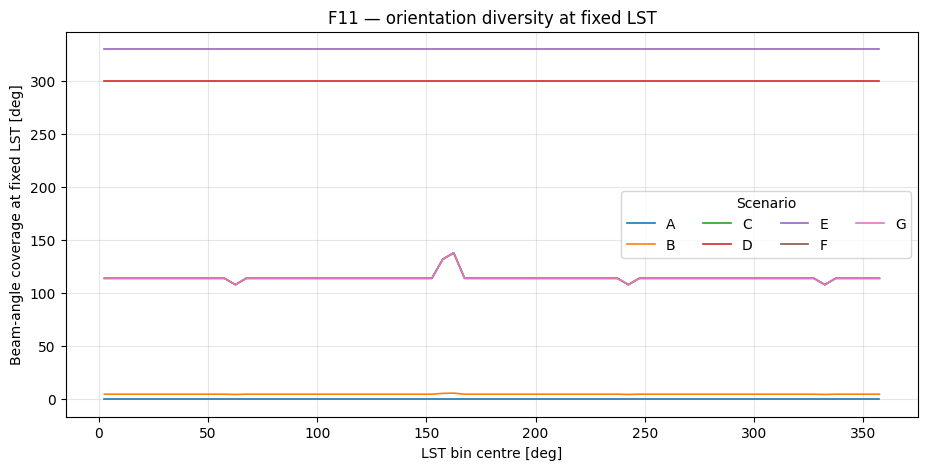

In [37]:
# ============================================================
# F11 — Rotation orientation-coverage diagnostic
# ============================================================

fig, ax = plt.subplots(figsize=(11, 5))

for case_id in ["A", "B", "C", "D", "E", "F", "G"]:
    df = orientation_tables[case_id]

    ax.plot(
        df["lst_bin_centre"],
        df["rotation_coverage_deg"],
        lw=1.2,
        label=case_id,
    )

ax.set_xlabel("LST bin centre [deg]")
ax.set_ylabel("Beam-angle coverage at fixed LST [deg]")
ax.set_title("F11 — orientation diversity at fixed LST")
ax.grid(alpha=0.3)
ax.legend(
    title="Scenario",
    ncol=4,
)

save_current_figure("F11_rotation_orientation_coverage.png")
plt.show()

In [38]:
# ============================================================
# 4.4 Prepare A (no rotation) vs G (12-day hourly rotation)
#     on the already-defined common-pixel support
# ============================================================

if "rotation_results" not in globals():
    raise RuntimeError(
        "rotation_results is missing. Run the A–G rotation sweep first."
    )

if "rotation_common_pix" not in globals():
    raise RuntimeError(
        "rotation_common_pix is missing. Run the common-pixel comparison first."
    )

rotation_baseline = rotation_results["A"]
rotation_g = rotation_results["G"]

def extract_common_rotation_fields(result, common_pix):
    pix = np.asarray(result["pix"], dtype=int)

    lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix in enumerate(pix)
    }

    missing = [
        int(full_pix)
        for full_pix in common_pix
        if int(full_pix) not in lookup
    ]

    if missing:
        raise RuntimeError(
            f"{len(missing)} common pixels are missing from "
            f"{result.get('scenario_id', 'unknown')}."
        )

    idx = np.asarray(
        [lookup[int(full_pix)] for full_pix in common_pix],
        dtype=int,
    )

    return {
        "pix": np.asarray(common_pix, dtype=int),
        "truth": np.asarray(result["truth_patch"], dtype=float)[idx],
        "recovered": np.asarray(result["recovered"], dtype=float)[idx],
        "residual": np.asarray(result["residual"], dtype=float)[idx],
        "hits": np.asarray(result["weighted_hits"], dtype=float)[idx],
        "unc": np.asarray(result["unc"], dtype=float)[idx],
    }

common_A = extract_common_rotation_fields(
    rotation_baseline,
    rotation_common_pix,
)

common_G = extract_common_rotation_fields(
    rotation_g,
    rotation_common_pix,
)

print(
    f"Prepared A vs G comparison on "
    f"{len(rotation_common_pix)} common pixels."
)

Prepared A vs G comparison on 240 common pixels.


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F12_rotation_representative_maps.png


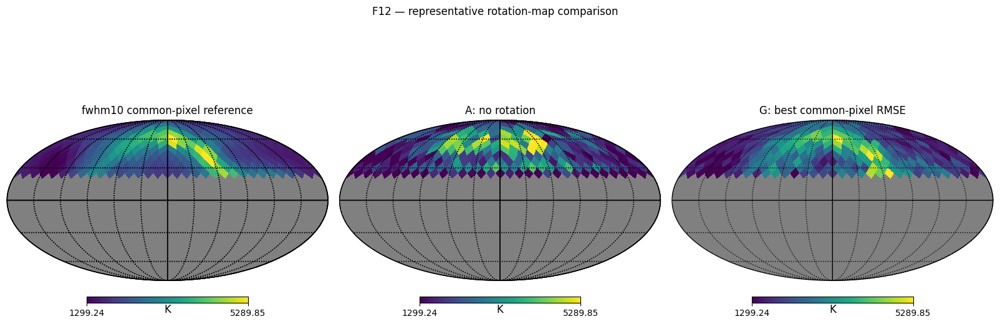

In [39]:
# ============================================================
# F12 — Representative rotation maps: baseline vs useful rotation
# ============================================================

truth_full = patch_to_full(
    common_A["truth"],
    rotation_common_pix,
    MAP_NSIDE,
)
rec_A_full = patch_to_full(
    common_A["recovered"],
    rotation_common_pix,
    MAP_NSIDE,
)
rec_B_full = patch_to_full(
    common_G["recovered"],
    rotation_common_pix,
    MAP_NSIDE,
)

vmin = finite_percentile(common_A["truth"], 1)
vmax = finite_percentile(common_A["truth"], 99)

fig = plt.figure(figsize=(16, 5))

hp.mollview(
    truth_full, fig=fig.number, sub=(1, 3, 1),
    title=f"{REPRESENTATIVE_REF} common-pixel reference",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    rec_A_full, fig=fig.number, sub=(1, 3, 2),
    title="A: no rotation",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    rec_B_full, fig=fig.number, sub=(1, 3, 3),
    title="G: best common-pixel RMSE",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

plt.suptitle("F12 — representative rotation-map comparison", y=1.03)
save_current_figure("F12_rotation_representative_maps.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F13_rotation_residual_comparison.png


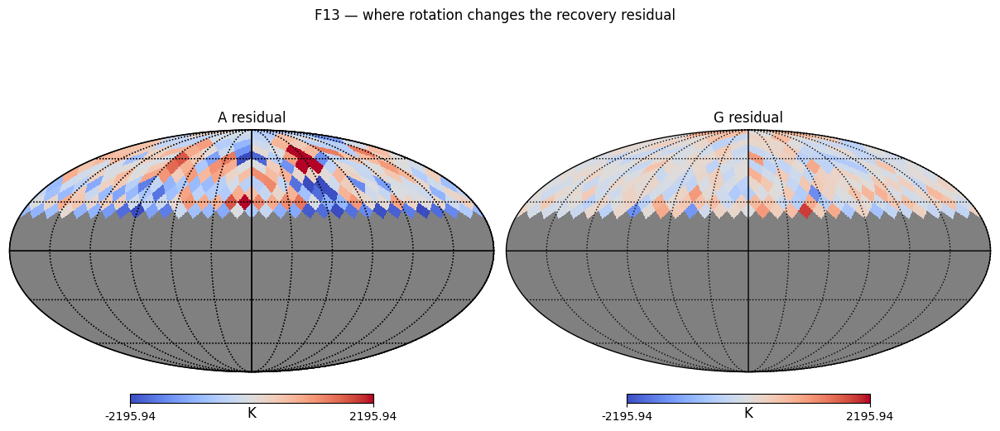

In [40]:
# ============================================================
# F13 — Rotation residual comparison
# ============================================================

res_A_full = patch_to_full(
    common_A["residual"],
    rotation_common_pix,
    MAP_NSIDE,
)
res_best_full = patch_to_full(
    common_G["residual"],
    rotation_common_pix,
    MAP_NSIDE,
)

combined_res = np.r_[
    common_A["residual"],
    common_G["residual"],
]
rmax = finite_percentile(
    np.abs(combined_res),
    98,
    fallback=1.0,
)

fig = plt.figure(figsize=(12, 5))

hp.mollview(
    res_A_full, fig=fig.number, sub=(1, 2, 1),
    title="A residual",
    unit="K", min=-rmax, max=rmax,
    cmap="coolwarm", badcolor="gray",
)
hp.graticule()

hp.mollview(
    res_best_full, fig=fig.number, sub=(1, 2, 2),
    title="G residual",
    unit="K", min=-rmax, max=rmax,
    cmap="coolwarm", badcolor="gray",
)
hp.graticule()

plt.suptitle("F13 — where rotation changes the recovery residual", y=1.03)
save_current_figure("F13_rotation_residual_comparison.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F14_rotation_hit_map_comparison.png


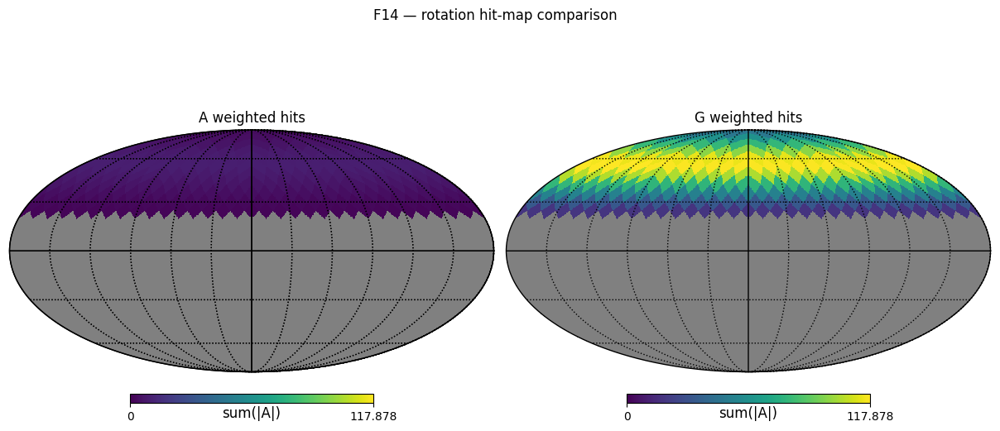

In [41]:
# ============================================================
# F14 — Rotation weighted-hit comparison
# ============================================================

hit_A_full = patch_to_full(
    common_A["hits"],
    rotation_common_pix,
    MAP_NSIDE,
)
hit_best_full = patch_to_full(
    common_G["hits"],
    rotation_common_pix,
    MAP_NSIDE,
)

hmax = finite_percentile(
    np.r_[common_A["hits"], common_G["hits"]],
    99,
    fallback=1.0,
)

fig = plt.figure(figsize=(12, 5))

hp.mollview(
    hit_A_full, fig=fig.number, sub=(1, 2, 1),
    title="A weighted hits",
    unit="sum(|A|)", min=0, max=hmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    hit_best_full, fig=fig.number, sub=(1, 2, 2),
    title="G weighted hits",
    unit="sum(|A|)", min=0, max=hmax, badcolor="gray",
)
hp.graticule()

plt.suptitle("F14 — rotation hit-map comparison", y=1.03)
save_current_figure("F14_rotation_hit_map_comparison.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F15_rotation_uncertainty_comparison.png


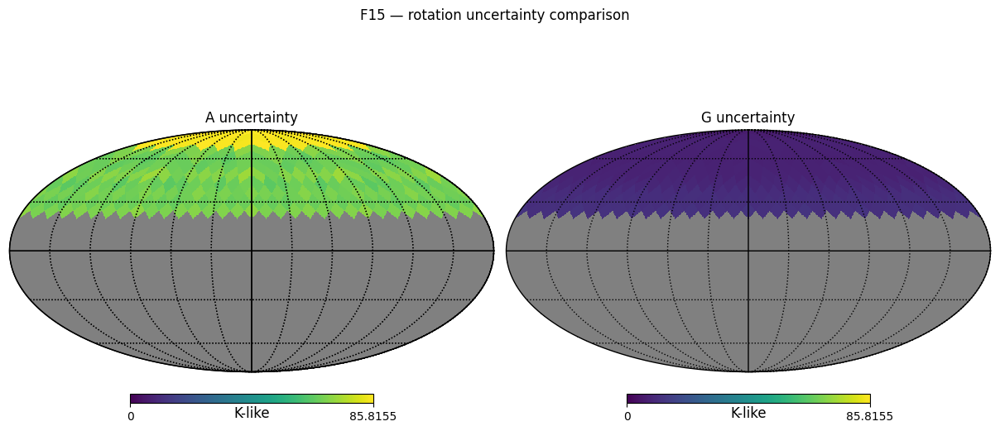

In [42]:
# ============================================================
# F15 — Rotation uncertainty comparison
# ============================================================

unc_A_full = patch_to_full(
    common_A["unc"],
    rotation_common_pix,
    MAP_NSIDE,
)
unc_best_full = patch_to_full(
    common_G["unc"],
    rotation_common_pix,
    MAP_NSIDE,
)

umax = finite_percentile(
    np.r_[common_A["unc"], common_G["unc"]],
    99,
    fallback=1.0,
)

fig = plt.figure(figsize=(12, 5))

hp.mollview(
    unc_A_full, fig=fig.number, sub=(1, 2, 1),
    title="A uncertainty",
    unit="K-like", min=0, max=umax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    unc_best_full, fig=fig.number, sub=(1, 2, 2),
    title="G uncertainty",
    unit="K-like", min=0, max=umax, badcolor="gray",
)
hp.graticule()

plt.suptitle("F15 — rotation uncertainty comparison", y=1.03)
save_current_figure("F15_rotation_uncertainty_comparison.png")
plt.show()

## Additional rotation diagnostics retained for thesis/appendix

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/A3_rotation_residual_vs_weighted_hit.png


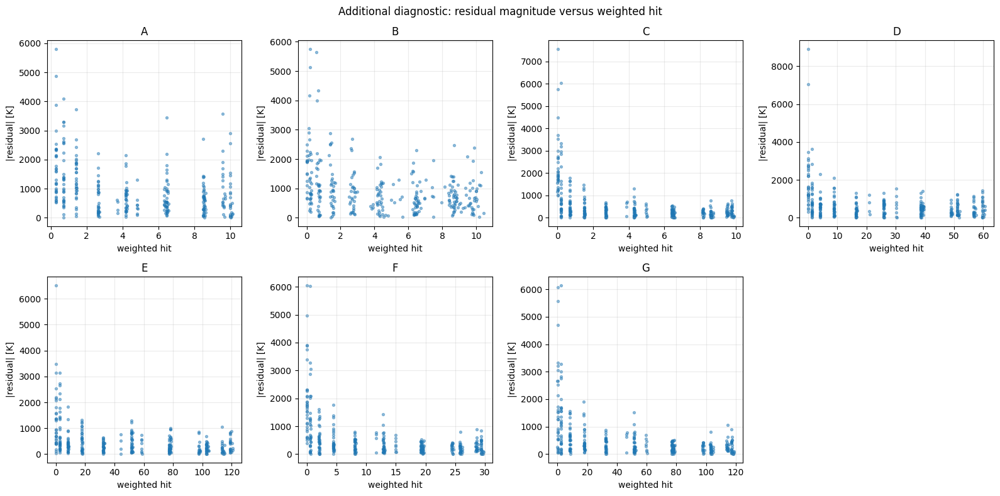

In [43]:
# Residual versus weighted-hit scatter for all A–G cases.
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
axes = ax.ravel()

for i, case_id in enumerate(["A", "B", "C", "D", "E", "F", "G"]):
    result = rotation_results[case_id]

    axes[i].scatter(
        result["weighted_hits"],
        np.abs(result["residual"]),
        s=8,
        alpha=0.45,
    )
    axes[i].set_xlabel("weighted hit")
    axes[i].set_ylabel("|residual| [K]")
    axes[i].set_title(case_id)
    axes[i].grid(alpha=0.25)

axes[-1].axis("off")

plt.suptitle("Additional diagnostic: residual magnitude versus weighted hit")
plt.tight_layout()
save_current_figure("A3_rotation_residual_vs_weighted_hit.png")
plt.show()

In [44]:
# Effective number of beam-weighted observations per selected pixel.
effective_sample_rows = []

for case_id, result in rotation_results.items():
    W = np.abs(result["A"])
    sum_w = np.sum(W, axis=0)
    sum_w2 = np.sum(W**2, axis=0)
    n_eff = sum_w**2 / (sum_w2 + 1e-30)

    effective_sample_rows.append({
        "ID": case_id,
        "median_n_eff": float(np.median(n_eff)),
        "p05_n_eff": float(np.percentile(n_eff, 5)),
        "p95_n_eff": float(np.percentile(n_eff, 95)),
    })

effective_sample_df = pd.DataFrame(effective_sample_rows)
display(effective_sample_df)
effective_sample_df.to_csv(
    TABLE_DIR / "rotation_effective_samples.csv",
    index=False,
)

,ID,median_n_eff,p05_n_eff,p95_n_eff
0,A,327.645381,111.506780,541.346637
1,B,316.349532,50.887995,551.961473
2,C,316.496544,5.969807,538.597108
3,D,1917.105937,9.992174,3256.436320
4,E,3816.590344,57.616196,6508.753683
5,F,949.489633,17.909420,1615.791323
6,G,3797.958531,71.637681,6463.165294


# 5. Native LimTOD prior / regularisation ladder
The prior ladder uses the native `Tsky_prior_mean` and `Tsky_prior_inv_cov_diag` arguments. It does not replace the LimTOD solver.

In [45]:
# ============================================================
# 5.1 Run no-prior, ridge, absolute-prior, relative-prior cases
# ============================================================

prior_ref_key = REPRESENTATIVE_REF
prior_mean = baseline_reference_patches[prior_ref_key].copy()

prior_results = {}

# Nearly unregularised
rec, unc = recover_native(
    baseline_mapper,
    baseline_actual_TOD,
    regularization=REG_WEAK,
    dtime=baseline_scan["dt_seconds"],
)
prior_results["no_prior_reg1e-8"] = {
    "map": rec,
    "unc": unc,
    "kind": "no_prior",
    "regularization": REG_WEAK,
    "prior_label": "none",
    "prior_strength_value": np.nan,
}

# Ridge baseline
rec, unc = recover_native(
    baseline_mapper,
    baseline_actual_TOD,
    regularization=REG_RIDGE,
    dtime=baseline_scan["dt_seconds"],
)
prior_results["no_prior_reg1e-4"] = {
    "map": rec,
    "unc": unc,
    "kind": "ridge_only",
    "regularization": REG_RIDGE,
    "prior_label": "ridge",
    "prior_strength_value": REG_RIDGE,
}

# Absolute sigma priors
for sigma_k in ABSOLUTE_SIGMA_K_LIST:
    prior_inv_cov_diag = np.ones_like(prior_mean) / float(sigma_k) ** 2

    rec, unc = recover_native(
        baseline_mapper,
        baseline_actual_TOD,
        regularization=REG_WEAK,
        prior_mean=prior_mean,
        prior_inv_cov_diag=prior_inv_cov_diag,
        dtime=baseline_scan["dt_seconds"],
    )

    prior_results[f"abs_sigma_{int(sigma_k)}K"] = {
        "map": rec,
        "unc": unc,
        "kind": "absolute_prior",
        "regularization": REG_WEAK,
        "prior_label": f"σ={sigma_k:g} K",
        "prior_strength_value": float(sigma_k),
    }

# Relative priors
for frac in RELATIVE_SIGMA_FRAC_LIST:
    sigma_pix = np.maximum(
        float(frac) * np.abs(prior_mean),
        RELATIVE_SIGMA_FLOOR_K,
    )
    prior_inv_cov_diag = 1.0 / sigma_pix**2

    rec, unc = recover_native(
        baseline_mapper,
        baseline_actual_TOD,
        regularization=REG_WEAK,
        prior_mean=prior_mean,
        prior_inv_cov_diag=prior_inv_cov_diag,
        dtime=baseline_scan["dt_seconds"],
    )

    prior_results[f"relative_{frac:g}"] = {
        "map": rec,
        "unc": unc,
        "kind": "relative_prior",
        "regularization": REG_WEAK,
        "prior_label": f"{frac:g}×prior, floor {RELATIVE_SIGMA_FLOOR_K:g} K",
        "prior_strength_value": float(frac),
        "sigma_pix": sigma_pix,
    }

prior_metric_rows = []

for case_name, result in prior_results.items():
    met = map_metrics(
        result["map"],
        prior_mean,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    )

    prior_metric_rows.append({
        "case": case_name,
        "kind": result["kind"],
        "prior_label": result["prior_label"],
        "regularization": result["regularization"],
        "prior_strength_value": result["prior_strength_value"],
        **met,
    })

prior_metrics_df = pd.DataFrame(prior_metric_rows)
display(prior_metrics_df)
prior_metrics_df.to_csv(
    TABLE_DIR / "native_prior_regularisation_ladder.csv",
    index=False,
)

,case,kind,prior_label,regularization,prior_strength_value,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,no_prior_reg1e-8,no_prior,none,1.000000e-08,NaN,240,1079.823198,94.904036,1075.644627,0.505951,833.179646,2175.360100
1,no_prior_reg1e-4,ridge_only,ridge,1.000000e-04,0.0001,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
2,abs_sigma_5000K,absolute_prior,σ=5000 K,1.000000e-08,5000.0000,240,1077.673527,94.718526,1073.502973,0.506963,831.279841,2171.981415
3,abs_sigma_2000K,absolute_prior,σ=2000 K,1.000000e-08,2000.0000,240,1066.950628,93.793849,1062.820002,0.512060,822.079603,2150.597994
4,abs_sigma_1000K,absolute_prior,σ=1000 K,1.000000e-08,1000.0000,240,1034.773202,91.020135,1030.762298,0.527863,797.058505,2023.954331
5,abs_sigma_500K,absolute_prior,σ=500 K,1.000000e-08,500.0000,240,954.977615,84.058455,951.270951,0.570421,738.761884,1813.024646
6,abs_sigma_200K,absolute_prior,σ=200 K,1.000000e-08,200.0000,240,783.248244,68.478879,780.248970,0.675823,605.442659,1560.086340
7,abs_sigma_100K,absolute_prior,σ=100 K,1.000000e-08,100.0000,240,623.429431,54.172411,621.071336,0.779415,475.310455,1287.154878
8,relative_0.5,relative_prior,"0.5×prior, floor 300 K",1.000000e-08,0.5000,240,1044.877438,90.416712,1040.958058,0.520974,802.532466,2057.892055
9,relative_0.3,relative_prior,"0.3×prior, floor 300 K",1.000000e-08,0.3000,240,1003.237545,84.252323,999.693512,0.540168,768.116309,1935.073803


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F16_prior_regularisation_ladder.png


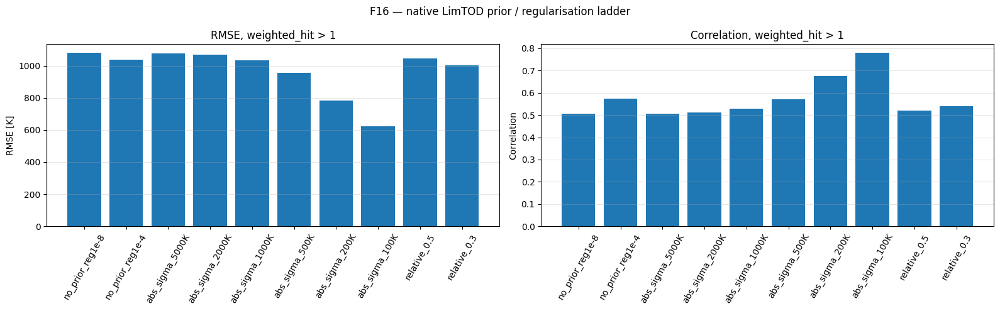

In [46]:
# ============================================================
# F16 — Prior/regularisation ladder metrics
# ============================================================

f16_df = prior_metrics_df.copy()

fig, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].bar(
    f16_df["case"],
    f16_df["rmse"],
)
ax[0].set_ylabel("RMSE [K]")
ax[0].set_title(
    f"RMSE, weighted_hit > {PLOT_HIT_CUT:g}"
)
ax[0].tick_params(axis="x", rotation=60)
ax[0].grid(axis="y", alpha=0.3)

ax[1].bar(
    f16_df["case"],
    f16_df["corr"],
)
ax[1].set_ylabel("Correlation")
ax[1].set_title(
    f"Correlation, weighted_hit > {PLOT_HIT_CUT:g}"
)
ax[1].tick_params(axis="x", rotation=60)
ax[1].grid(axis="y", alpha=0.3)

plt.suptitle("F16 — native LimTOD prior / regularisation ladder")
plt.tight_layout()
save_current_figure("F16_prior_regularisation_ladder.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F17_representative_prior_maps.png


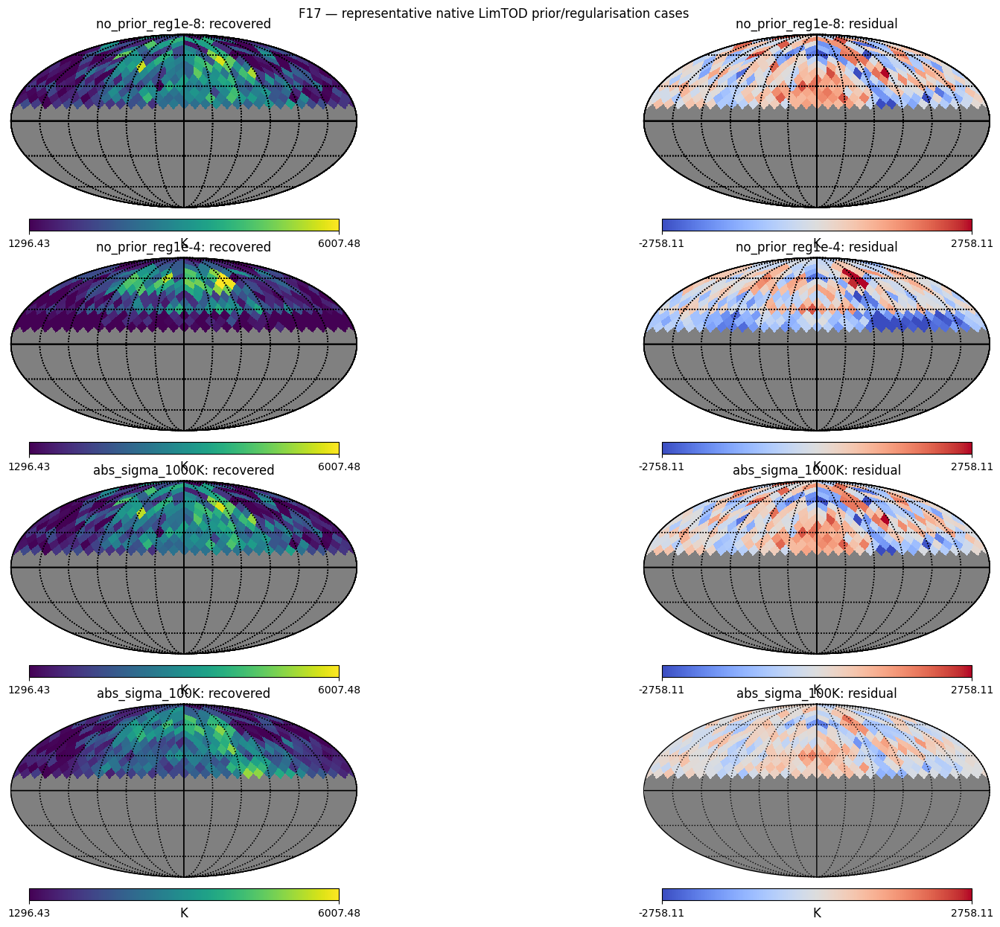

In [47]:
# ============================================================
# F17 — Representative prior maps
# under-constrained / ridge / moderate / strong
# ============================================================

representative_prior_cases = [
    "no_prior_reg1e-8",
    "no_prior_reg1e-4",
    "abs_sigma_1000K",
    "abs_sigma_100K",
]

fig = plt.figure(figsize=(17, 12))

vmin = finite_percentile(prior_mean, 1)
vmax = finite_percentile(prior_mean, 99)

all_residuals = np.concatenate([
    prior_results[name]["map"] - prior_mean
    for name in representative_prior_cases
])
rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)

for row, case_name in enumerate(representative_prior_cases):
    result = prior_results[case_name]
    rec = result["map"]
    res = rec - prior_mean

    rec_full = patch_to_full(rec, baseline_pix, MAP_NSIDE)
    res_full = patch_to_full(res, baseline_pix, MAP_NSIDE)

    hp.mollview(
        rec_full,
        fig=fig.number,
        sub=(4, 2, 2 * row + 1),
        title=f"{case_name}: recovered",
        unit="K",
        min=vmin,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        res_full,
        fig=fig.number,
        sub=(4, 2, 2 * row + 2),
        title=f"{case_name}: residual",
        unit="K",
        min=-rmax,
        max=rmax,
        cmap="coolwarm",
        badcolor="gray",
    )
    hp.graticule()

plt.suptitle(
    "F17 — representative native LimTOD prior/regularisation cases",
    y=1.01,
)
save_current_figure("F17_representative_prior_maps.png")
plt.show()

# 6. HornDry / HornWet beam mismatch
This section isolates beam-model mismatch after the matched baseline and rotation tests are established.

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F18_HornDry_vs_HornWet_70MHz.png


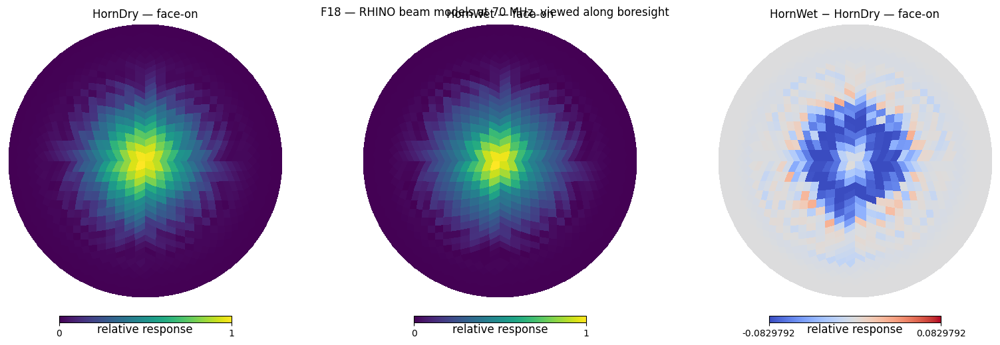

In [48]:
# ============================================================
# F18 — HornDry versus HornWet at 70 MHz, viewed along boresight
# ============================================================

beam_difference = horn_wet - horn_dry
dmax = finite_percentile(
    np.abs(beam_difference),
    99,
    fallback=1.0,
)

# The beam maps are naturally centred on the HEALPix north pole.
# rot=[0, 90, 0] points the viewer along that boresight so the
# main lobe is visually centred rather than sitting at the top
# of a Mollweide projection.
FACE_ON_ROT = [0.0, 90.0, 0.0]

fig = plt.figure(figsize=(16, 5))

hp.orthview(
    horn_dry,
    fig=fig.number,
    sub=(1, 3, 1),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornDry — face-on",
    unit="relative response",
    min=0,
    max=1,
)

hp.orthview(
    horn_wet,
    fig=fig.number,
    sub=(1, 3, 2),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet — face-on",
    unit="relative response",
    min=0,
    max=1,
)

hp.orthview(
    beam_difference,
    fig=fig.number,
    sub=(1, 3, 3),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet − HornDry — face-on",
    unit="relative response",
    min=-dmax,
    max=dmax,
    cmap="coolwarm",
)

plt.suptitle(
    f"F18 — RHINO beam models at {FREQ_MHZ:g} MHz, viewed along boresight",
    y=1.03,
)
save_current_figure("F18_HornDry_vs_HornWet_70MHz.png")
plt.show()

In [49]:
# ============================================================
# 6.1 Beam mismatch under BOTH no rotation and best rotation
# ============================================================

beam_mismatch_cases = {
    "D_to_D": (horn_dry, horn_dry),
    "D_to_W": (horn_dry, horn_wet),
    "W_to_W": (horn_wet, horn_wet),
    "W_to_D": (horn_wet, horn_dry),
}

beam_mismatch_scans = {
    "A_no_rotation": rotation_scans["A"],
    "G_12day_hourly_rotation": rotation_scans["G"],
}

beam_mismatch_results_by_scan = {}

for scan_label, mismatch_scan in beam_mismatch_scans.items():
    beam_mismatch_results_by_scan[scan_label] = {}

    for case_name, (beam_tod, beam_mapper) in beam_mismatch_cases.items():
        result = run_native_scenario(
            scenario_id=f"{scan_label}_{case_name}",
            scan=mismatch_scan,
            beam_tod=beam_tod,
            beam_mapper=beam_mapper,
            sky_map=sky_nside32,
            reference_full=reference_maps_full[REPRESENTATIVE_REF],
            reference_name=REPRESENTATIVE_REF,
            regularization=REG_RIDGE,
        )

        beam_mismatch_results_by_scan[scan_label][case_name] = result


# Create one common-pixel support across all eight scan/mismatch combinations.
beam_mismatch_common_mask = np.ones(
    hp.nside2npix(MAP_NSIDE),
    dtype=bool,
)

for scan_results in beam_mismatch_results_by_scan.values():
    for result in scan_results.values():
        local_good = result["weighted_hits"] > PLOT_HIT_CUT

        full_good = np.zeros(
            hp.nside2npix(MAP_NSIDE),
            dtype=bool,
        )
        full_good[result["pix"][local_good]] = True

        beam_mismatch_common_mask &= full_good

beam_mismatch_common_pix = np.where(
    beam_mismatch_common_mask
)[0]

if beam_mismatch_common_pix.size == 0:
    raise RuntimeError(
        "No common well-observed pixels remain across the beam-mismatch comparison."
    )

beam_mismatch_rows = []

for scan_label, scan_results in beam_mismatch_results_by_scan.items():
    for case_name, result in scan_results.items():
        sub = extract_result_on_full_pixels(
            result,
            beam_mismatch_common_pix,
        )

        met = map_metrics(
            sub["recovered"],
            sub["truth"],
        )

        beam_mismatch_rows.append({
            "scan": scan_label,
            "case": case_name,
            "sim_beam": case_name.split("_to_")[0],
            "recovery_beam": case_name.split("_to_")[1],
            "n_common_pix": beam_mismatch_common_pix.size,
            **met,
        })

beam_mismatch_df = pd.DataFrame(beam_mismatch_rows)

display(beam_mismatch_df)
beam_mismatch_df.to_csv(
    TABLE_DIR / "HornDry_HornWet_mismatch_no_rotation_vs_best_rotation.csv",
    index=False,
)

100%|██████████| 1440/1440 [00:01<00:00, 1094.73it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1134.96it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1309.46it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1082.14it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1299.57it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1304.47it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1112.48it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1292.21it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1299.71it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1084.57it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1103.16it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 926.91it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 17280/17280 [00:15<00:00, 1091.69it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:12<00:00, 1336.04it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:14<00:00, 1223.89it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:15<00:00, 1128.06it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:12<00:00, 1350.75it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1345.56it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:14<00:00, 1156.68it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:12<00:00, 1353.12it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:13<00:00, 1291.12it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:15<00:00, 1146.82it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 17280/17280 [00:12<00:00, 1348.51it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1347.68it/s]


Number of data points: 17280
Number of selected pixels: 336


100%|██████████| 17280/17280 [00:12<00:00, 1358.85it/s]


,scan,case,sim_beam,recovery_beam,n_common_pix,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,A_no_rotation,D_to_D,D,D,240,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
1,A_no_rotation,D_to_W,D,W,240,240,1022.332686,-129.916397,1014.044304,0.567699,768.647188,2048.113269
2,A_no_rotation,W_to_W,W,W,240,240,1024.932544,-129.140439,1016.764214,0.566777,769.538206,2049.559311
3,A_no_rotation,W_to_D,W,D,240,240,1045.673362,-143.007403,1035.848282,0.570140,796.079547,2064.293762
4,G_12day_hourly_rotation,D_to_D,D,D,240,240,422.686344,36.055978,421.145714,0.906507,317.779110,812.819155
5,G_12day_hourly_rotation,D_to_W,D,W,240,240,426.371205,40.413626,424.451579,0.903370,318.594765,888.922460
6,G_12day_hourly_rotation,W_to_W,W,W,240,240,416.857784,40.761232,414.860138,0.907059,317.208057,853.907762
7,G_12day_hourly_rotation,W_to_D,W,D,240,240,457.656026,37.589452,456.109714,0.890769,347.004831,877.315976


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F19_beam_mismatch_matrix_metrics.png


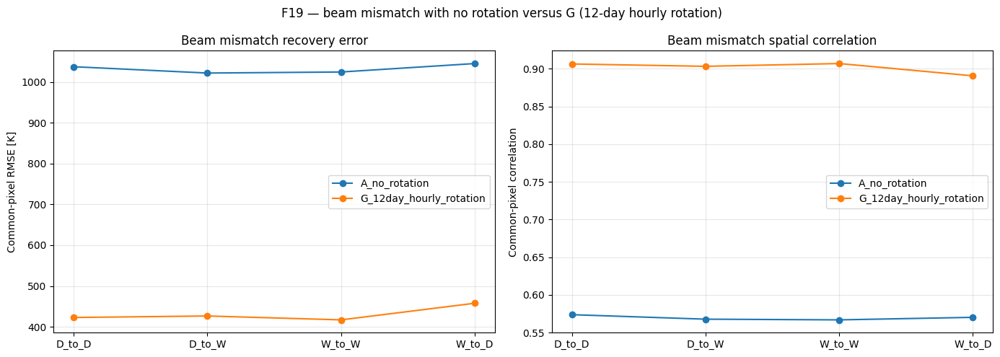

,scan,mismatch,rmse_penalty_K
0,A_no_rotation,Dry simulated → Wet recovery,-15.550757
1,A_no_rotation,Wet simulated → Dry recovery,20.740818
2,G_12day_hourly_rotation,Dry simulated → Wet recovery,3.684860
3,G_12day_hourly_rotation,Wet simulated → Dry recovery,40.798242


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F19B_rotation_mismatch_penalty.png


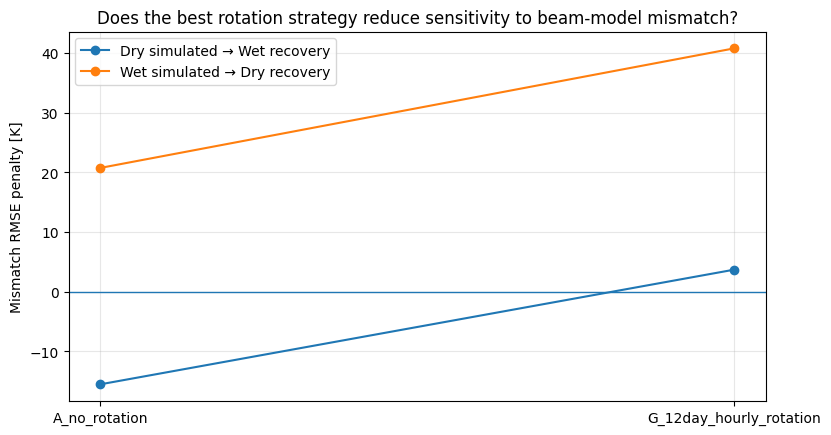

In [50]:
# ============================================================
# F19 — Beam mismatch matrix: no rotation versus best rotation
# ============================================================

case_order = ["D_to_D", "D_to_W", "W_to_W", "W_to_D"]

fig, ax = plt.subplots(1, 2, figsize=(14, 5))

for scan_label in beam_mismatch_scans:
    sub = (
        beam_mismatch_df[
            beam_mismatch_df["scan"] == scan_label
        ]
        .set_index("case")
        .loc[case_order]
        .reset_index()
    )

    ax[0].plot(
        sub["case"],
        sub["rmse"],
        marker="o",
        label=scan_label,
    )

    ax[1].plot(
        sub["case"],
        sub["corr"],
        marker="o",
        label=scan_label,
    )

ax[0].set_ylabel("Common-pixel RMSE [K]")
ax[0].set_title("Beam mismatch recovery error")
ax[0].grid(alpha=0.3)
ax[0].legend()

ax[1].set_ylabel("Common-pixel correlation")
ax[1].set_title("Beam mismatch spatial correlation")
ax[1].grid(alpha=0.3)
ax[1].legend()

plt.suptitle(
    "F19 — beam mismatch with no rotation versus G (12-day hourly rotation)"
)
plt.tight_layout()
save_current_figure("F19_beam_mismatch_matrix_metrics.png")
plt.show()


# Explicit mismatch penalty relative to the matched case for the same simulated beam.
penalty_rows = []

for scan_label in beam_mismatch_scans:
    sub = beam_mismatch_df[
        beam_mismatch_df["scan"] == scan_label
    ].set_index("case")

    dry_penalty = (
        sub.loc["D_to_W", "rmse"]
        - sub.loc["D_to_D", "rmse"]
    )
    wet_penalty = (
        sub.loc["W_to_D", "rmse"]
        - sub.loc["W_to_W", "rmse"]
    )

    penalty_rows.extend([
        {
            "scan": scan_label,
            "mismatch": "Dry simulated → Wet recovery",
            "rmse_penalty_K": dry_penalty,
        },
        {
            "scan": scan_label,
            "mismatch": "Wet simulated → Dry recovery",
            "rmse_penalty_K": wet_penalty,
        },
    ])

beam_mismatch_penalty_df = pd.DataFrame(penalty_rows)
display(beam_mismatch_penalty_df)

fig, ax = plt.subplots(figsize=(9, 4.8))

for mismatch_name in beam_mismatch_penalty_df["mismatch"].unique():
    sub = beam_mismatch_penalty_df[
        beam_mismatch_penalty_df["mismatch"] == mismatch_name
    ]
    ax.plot(
        sub["scan"],
        sub["rmse_penalty_K"],
        marker="o",
        label=mismatch_name,
    )

ax.axhline(0.0, lw=1.0)
ax.set_ylabel("Mismatch RMSE penalty [K]")
ax.set_title(
    "Does the best rotation strategy reduce sensitivity to beam-model mismatch?"
)
ax.grid(alpha=0.3)
ax.legend()

save_current_figure("F19B_rotation_mismatch_penalty.png")
plt.show()

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F20_matched_vs_mismatched_maps.png


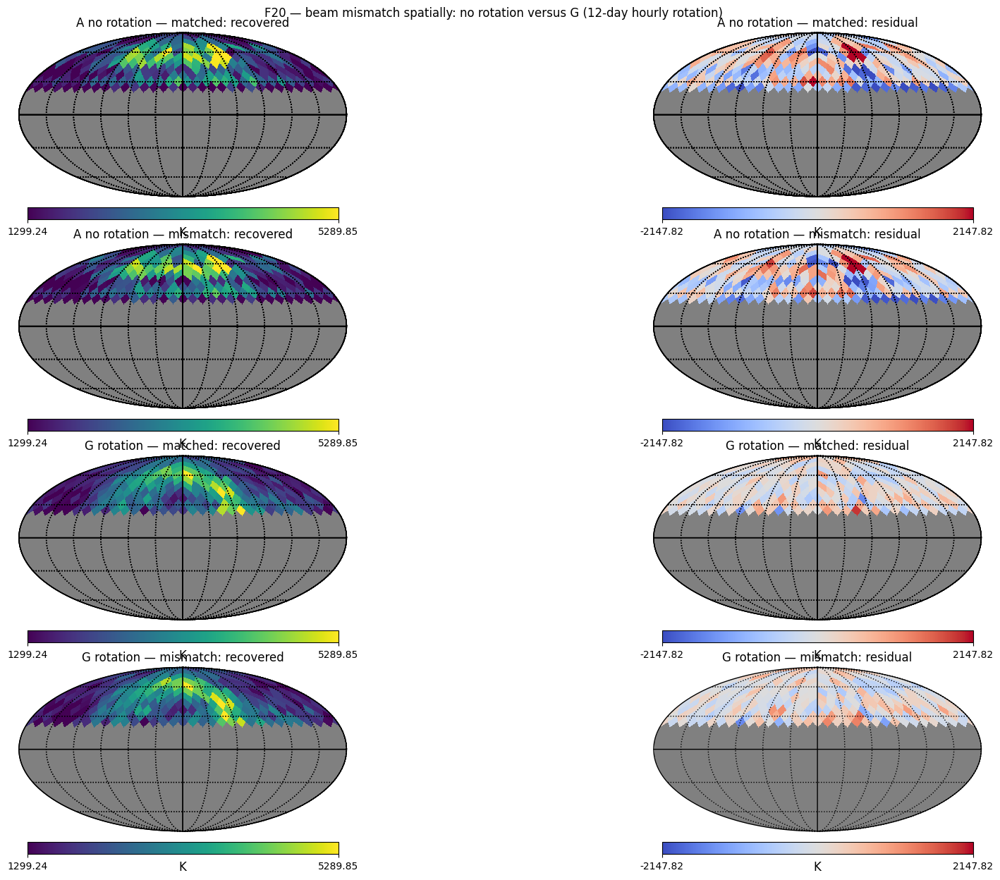

In [51]:
# ============================================================
# F20 — Matched vs mismatched maps under no rotation AND best rotation
# ============================================================

comparison_cases = [
    ("A no rotation — matched", "A_no_rotation", "D_to_D"),
    ("A no rotation — mismatch", "A_no_rotation", "D_to_W"),
    (
        "G rotation — matched",
        "G_12day_hourly_rotation",
        "D_to_D",
    ),
    (
        "G rotation — mismatch",
        "G_12day_hourly_rotation",
        "D_to_W",
    ),
]

comparison_data = {}

for title, scan_label, case_name in comparison_cases:
    result = beam_mismatch_results_by_scan[scan_label][case_name]
    comparison_data[title] = extract_result_on_full_pixels(
        result,
        beam_mismatch_common_pix,
    )

common_truth = comparison_data[comparison_cases[0][0]]["truth"]

vmin = finite_percentile(common_truth, 1)
vmax = finite_percentile(common_truth, 99)

all_res = np.concatenate([
    data["residual"]
    for data in comparison_data.values()
])
rmax = finite_percentile(
    np.abs(all_res),
    98,
    fallback=1.0,
)

fig = plt.figure(figsize=(18, 12))

for row, (title, _, _) in enumerate(comparison_cases):
    data = comparison_data[title]

    rec_full = patch_to_full(
        data["recovered"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )
    res_full = patch_to_full(
        data["residual"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        rec_full,
        fig=fig.number,
        sub=(4, 2, 2*row + 1),
        title=f"{title}: recovered",
        unit="K",
        min=vmin,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        res_full,
        fig=fig.number,
        sub=(4, 2, 2*row + 2),
        title=f"{title}: residual",
        unit="K",
        min=-rmax,
        max=rmax,
        cmap="coolwarm",
        badcolor="gray",
    )
    hp.graticule()

plt.suptitle(
    "F20 — beam mismatch spatially: no rotation versus G (12-day hourly rotation)",
    y=1.01,
)
save_current_figure("F20_matched_vs_mismatched_maps.png")
plt.show()

### How the thesis should argue for rotation

The control is **A: no rotation**. The scientific progression is then B→G,
where the beam is observed with increasingly useful orientation diversity.

The primary quantity is **map uncertainty**, not simply whether the recovered
map looks different.

The rotation argument is:

1. A establishes the no-rotation uncertainty floor for the baseline setup.
2. B–G show how the uncertainty changes as the rotation strategy becomes richer.
3. F9/F10 quantify the median and high-percentile uncertainty on the same sky pixels.
4. F9B shows the uncertainty maps themselves, including the pixel-by-pixel
   reduction from A to G.
5. F11 explains the geometry through fixed-LST orientation coverage.
6. G — 12 days with one full rotation per hour — is the designated strategy
   to carry into the beam-mismatch test.
7. The Dry/Wet mismatch section then asks whether the same G strategy also
   makes the recovery less sensitive to beam-model error.

The thesis should claim an uncertainty reduction only if the actual run confirms it.
The notebook prints and exports the percentage reduction of G relative to A.

## Additional beam-mismatch severity ladder
This keeps the later systematics work rather than discarding it. It is supplementary to F18–F20.

In [52]:
# ============================================================
# 6.2 Smooth/random beam-error ladder
# ============================================================

def normalize_beam_map(b):
    b = as_finite_array(b, clip_negative=True)
    if np.max(b) <= 0:
        raise ValueError("Cannot normalize zero beam.")
    return b / np.max(b)


def smooth_beam_mismatch(beam, smooth_fwhm_deg):
    b = normalize_beam_map(beam)
    out = hp.smoothing(
        b,
        fwhm=np.radians(float(smooth_fwhm_deg)),
        verbose=False,
    )
    return normalize_beam_map(out)


def random_beam_perturbation(
    beam,
    epsilon=0.05,
    seed=0,
    smooth_deg=10.0,
):
    rng = np.random.default_rng(seed)

    b = normalize_beam_map(beam)

    rand = rng.normal(size=b.size)
    rand = hp.smoothing(
        rand,
        fwhm=np.radians(float(smooth_deg)),
        verbose=False,
    )
    rand = rand / (np.std(rand) + 1e-30)

    wrong = b * (1.0 + float(epsilon) * rand)
    return normalize_beam_map(wrong)


beam_error_ladder = {
    "matched_Dry": horn_dry,
    "smoothed_2deg": smooth_beam_mismatch(horn_dry, 2.0),
    "smoothed_5deg": smooth_beam_mismatch(horn_dry, 5.0),
    "random_2pct": random_beam_perturbation(
        horn_dry, epsilon=0.02, seed=1, smooth_deg=10.0
    ),
    "random_5pct": random_beam_perturbation(
        horn_dry, epsilon=0.05, seed=1, smooth_deg=10.0
    ),
    "HornWet": horn_wet,
}

beam_error_results = {}

for error_name, wrong_beam in beam_error_ladder.items():
    beam_error_results[error_name] = run_native_scenario(
        scenario_id=error_name,
        scan=baseline_scan,
        beam_tod=horn_dry,
        beam_mapper=wrong_beam,
        sky_map=sky_nside32,
        reference_full=reference_maps_full[REPRESENTATIVE_REF],
        reference_name=REPRESENTATIVE_REF,
        regularization=REG_RIDGE,
    )

beam_error_df = pd.DataFrame([
    {
        "beam_model": name,
        **map_metrics(
            result["recovered"],
            result["truth_patch"],
            result["weighted_hits"],
            cut=PLOT_HIT_CUT,
        ),
    }
    for name, result in beam_error_results.items()
])

display(beam_error_df)
beam_error_df.to_csv(
    TABLE_DIR / "beam_error_severity_ladder.csv",
    index=False,
)

/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_37142/1223107856.py:14: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  out = hp.smoothing(
/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_37142/1223107856.py:33: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  rand = hp.smoothing(
100%|██████████| 1440/1440 [00:01<00:00, 1177.62it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1382.14it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1370.06it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1185.37it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1380.21it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1370.56it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1183.39it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1378.32it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1373.40it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1183.52it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1329.90it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1288.24it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1157.13it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1301.03it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1344.05it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1167.64it/s]



Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1301.20it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1354.35it/s]


Number of data points: 1440
Number of selected pixels: 304


100%|██████████| 1440/1440 [00:01<00:00, 1377.42it/s]


,beam_model,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,matched_Dry,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
1,smoothed_2deg,240,809.294382,-82.569125,805.071262,0.676999,603.329400,1681.278516
2,smoothed_5deg,240,865.818278,-181.840883,846.507639,0.682294,671.541748,1814.661406
3,random_2pct,240,1039.204767,-141.679849,1029.501514,0.571992,785.749843,2148.296582
4,random_5pct,240,1041.358122,-156.423665,1029.542799,0.579641,780.645450,2091.585568
5,HornWet,240,1022.332686,-129.916397,1014.044304,0.567699,768.647188,2048.113269


# 7. GLS / noise extension
The deterministic LimTOD pipeline is already established above. GLS now uses the validated baseline operator and selected-pixel patch.

In [53]:
# ============================================================
# 7.1 GLS solver
# ============================================================

def gls_solve_limtod(
    A,
    d,
    *,
    sigma_tod,
    reg=REG_RIDGE,
    prior_mean=None,
    prior_sigma=None,
):
    A = np.asarray(A, dtype=float)
    d = np.asarray(d, dtype=float).reshape(-1)

    if A.shape[0] != d.size:
        raise ValueError(
            f"GLS A rows={A.shape[0]} but d length={d.size}"
        )

    if sigma_tod <= 0:
        raise ValueError("sigma_tod must be positive.")

    inv_var = 1.0 / float(sigma_tod) ** 2

    lhs = inv_var * (A.T @ A)
    rhs = inv_var * (A.T @ d)

    if reg is not None and reg > 0:
        lhs = lhs + float(reg) * np.eye(A.shape[1])

    if prior_mean is not None or prior_sigma is not None:
        if prior_mean is None or prior_sigma is None:
            raise ValueError(
                "Provide both prior_mean and prior_sigma, or neither."
            )

        prior_mean = np.asarray(prior_mean, dtype=float).reshape(-1)

        if prior_mean.size != A.shape[1]:
            raise ValueError(
                "GLS prior_mean length does not match map parameters."
            )

        if np.isscalar(prior_sigma):
            prior_sigma_vec = np.full(
                A.shape[1],
                float(prior_sigma),
            )
        else:
            prior_sigma_vec = np.asarray(
                prior_sigma,
                dtype=float,
            ).reshape(-1)

        if prior_sigma_vec.size != A.shape[1]:
            raise ValueError(
                "GLS prior_sigma length does not match map parameters."
            )

        prior_sigma_vec = np.maximum(
            prior_sigma_vec,
            1e-12,
        )
        prior_precision = 1.0 / prior_sigma_vec**2

        lhs = lhs + np.diag(prior_precision)
        rhs = rhs + prior_precision * prior_mean

    try:
        factor = la.cho_factor(
            lhs,
            lower=True,
            check_finite=False,
        )
        recovered = la.cho_solve(
            factor,
            rhs,
            check_finite=False,
        )
        covariance = la.cho_solve(
            factor,
            np.eye(lhs.shape[0]),
            check_finite=False,
        )
    except la.LinAlgError:
        covariance = np.linalg.pinv(lhs)
        recovered = covariance @ rhs

    variance = np.diag(covariance)
    uncertainty = np.sqrt(
        np.maximum(variance, 0.0)
    )

    return {
        "map": recovered,
        "unc": uncertainty,
        "variance": variance,
        "cov": covariance,
        "lhs": lhs,
        "rhs": rhs,
        "sigma_tod": float(sigma_tod),
        "reg": float(reg),
    }


GLS_A = baseline_A
GLS_TRUTH = baseline_reference_patches[REPRESENTATIVE_REF]
GLS_PIX = baseline_pix
GLS_WEIGHTED_HITS = baseline_weighted_hits

print("GLS operator shape:", GLS_A.shape)
print("GLS truth length:", GLS_TRUTH.size)
print("GLS selected pixels:", GLS_PIX.size)

GLS operator shape: (1440, 304)
GLS truth length: 304
GLS selected pixels: 304


In [54]:
# ============================================================
# 7.2 Example noisy TOD entering GLS
# ============================================================

GLS_EXAMPLE_SIGMA_TOD = 10.0
GLS_RANDOM_SEED = 12345

rng = np.random.default_rng(GLS_RANDOM_SEED)

gls_example_noise = rng.normal(
    0.0,
    GLS_EXAMPLE_SIGMA_TOD,
    size=baseline_actual_TOD.size,
)

gls_example_noisy_TOD = (
    baseline_actual_TOD + gls_example_noise
)

print_percentiles("baseline clean TOD", baseline_actual_TOD)
print_percentiles("GLS noisy TOD", gls_example_noisy_TOD)
print_percentiles("injected noise", gls_example_noise)

baseline clean TOD                : min/p1/p5/med/p95/p99/max = 1658.5 / 1659.4 / 1667 / 2672.5 / 3529 / 3561.2 / 3565.4
GLS noisy TOD                     : min/p1/p5/med/p95/p99/max = 1642.4 / 1651.2 / 1668.4 / 2674.4 / 3530.9 / 3562.9 / 3576.4
injected noise                    : min/p1/p5/med/p95/p99/max = -31.196 / -24.23 / -16.336 / 0.5102 / 16.993 / 25.011 / 34.62


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F21_noisy_TOD_example.png


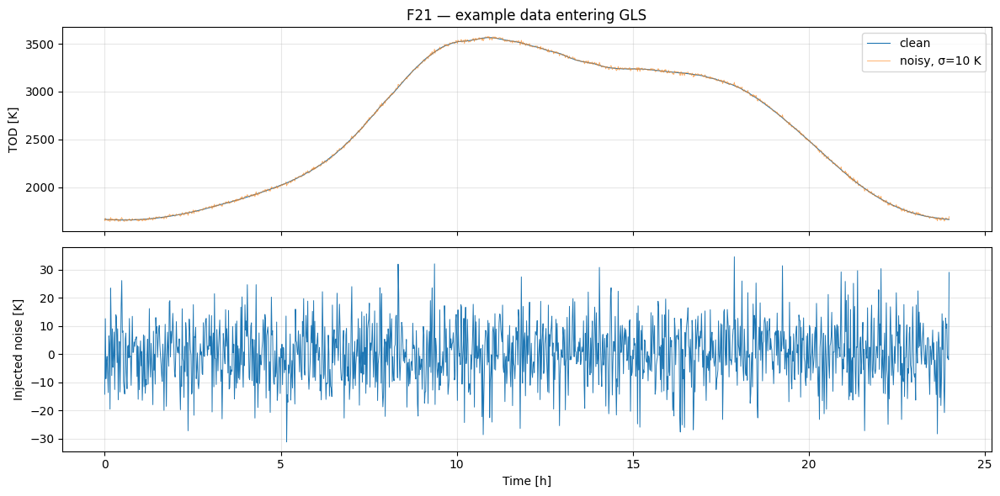

In [55]:
# ============================================================
# F21 — Noisy TOD example
# ============================================================

fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

ax[0].plot(
    baseline_scan["time_h"],
    baseline_actual_TOD,
    lw=0.8,
    label="clean",
)
ax[0].plot(
    baseline_scan["time_h"],
    gls_example_noisy_TOD,
    lw=0.6,
    alpha=0.7,
    label=f"noisy, σ={GLS_EXAMPLE_SIGMA_TOD:g} K",
)
ax[0].set_ylabel("TOD [K]")
ax[0].set_title("F21 — example data entering GLS")
ax[0].grid(alpha=0.3)
ax[0].legend()

ax[1].plot(
    baseline_scan["time_h"],
    gls_example_noise,
    lw=0.7,
)
ax[1].set_xlabel("Time [h]")
ax[1].set_ylabel("Injected noise [K]")
ax[1].grid(alpha=0.3)

plt.tight_layout()
save_current_figure("F21_noisy_TOD_example.png")
plt.show()

In [56]:
# ============================================================
# 7.3 GLS sigma-TOD sweep with explicit injected noise
# ============================================================

GLS_SIGMA_TOD_LIST = [1.0, 5.0, 10.0, 25.0, 50.0, 100.0]
GLS_REG = REG_RIDGE
GLS_PRIOR_SIGMA = 1000.0

gls_results = {}
gls_metric_rows = []

for sigma_tod in GLS_SIGMA_TOD_LIST:
    rng = np.random.default_rng(GLS_RANDOM_SEED)

    noise = rng.normal(
        0.0,
        sigma_tod,
        size=baseline_actual_TOD.size,
    )

    d_noisy = baseline_actual_TOD + noise

    result = gls_solve_limtod(
        GLS_A,
        d_noisy,
        sigma_tod=sigma_tod,
        reg=GLS_REG,
        prior_mean=GLS_TRUTH,
        prior_sigma=GLS_PRIOR_SIGMA,
    )

    result["d_noisy"] = d_noisy
    result["noise"] = noise
    result["residual"] = result["map"] - GLS_TRUTH

    gls_results[sigma_tod] = result

    met = map_metrics(
        result["map"],
        GLS_TRUTH,
        GLS_WEIGHTED_HITS,
        cut=PLOT_HIT_CUT,
    )

    gls_metric_rows.append({
        "sigma_tod_K": sigma_tod,
        "unc_median_K": float(np.median(result["unc"])),
        "unc_p95_K": float(np.percentile(result["unc"], 95)),
        "variance_p95_K2": float(np.percentile(result["variance"], 95)),
        **met,
    })

gls_metrics_df = pd.DataFrame(gls_metric_rows)
display(gls_metrics_df)
gls_metrics_df.to_csv(
    TABLE_DIR / "GLS_sigma_TOD_sweep.csv",
    index=False,
)

,sigma_tod_K,unc_median_K,unc_p95_K,variance_p95_K2,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,1.0,68.827379,84.338277,7112.950198,240,1030.511937,-144.597528,1020.316818,0.577235,779.777993,2119.520947
1,5.0,90.155401,95.408423,9102.767089,240,948.468311,-285.131839,904.594922,0.661124,725.347108,2122.818204
2,10.0,95.352432,97.965950,9597.327336,240,1029.244448,-349.593430,968.054011,0.638652,794.517681,2209.983187
3,25.0,97.966500,99.188204,9838.299764,240,1091.424179,-395.777852,1017.136486,0.612974,839.212399,2273.751919
4,50.0,98.586006,99.414426,9883.228133,240,1106.146441,-453.440256,1008.936016,0.600002,843.563284,2440.226423
5,100.0,98.875338,99.477723,9895.817403,240,1142.753447,-641.340641,945.815850,0.582373,845.980796,2474.066397


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F22_GLS_sigma_TOD_sweep.png


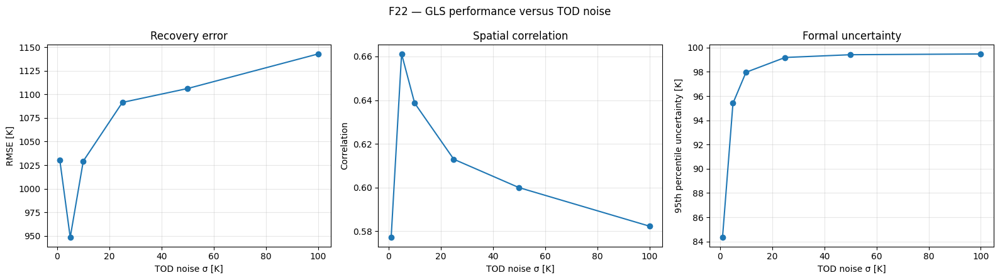

In [57]:
# ============================================================
# F22 — GLS sigma-TOD sweep
# ============================================================

fig, ax = plt.subplots(1, 3, figsize=(16, 4.5))

ax[0].plot(
    gls_metrics_df["sigma_tod_K"],
    gls_metrics_df["rmse"],
    marker="o",
)
ax[0].set_xlabel("TOD noise σ [K]")
ax[0].set_ylabel("RMSE [K]")
ax[0].set_title("Recovery error")
ax[0].grid(alpha=0.3)

ax[1].plot(
    gls_metrics_df["sigma_tod_K"],
    gls_metrics_df["corr"],
    marker="o",
)
ax[1].set_xlabel("TOD noise σ [K]")
ax[1].set_ylabel("Correlation")
ax[1].set_title("Spatial correlation")
ax[1].grid(alpha=0.3)

ax[2].plot(
    gls_metrics_df["sigma_tod_K"],
    gls_metrics_df["unc_p95_K"],
    marker="o",
)
ax[2].set_xlabel("TOD noise σ [K]")
ax[2].set_ylabel("95th percentile uncertainty [K]")
ax[2].set_title("Formal uncertainty")
ax[2].grid(alpha=0.3)

plt.suptitle("F22 — GLS performance versus TOD noise")
plt.tight_layout()
save_current_figure("F22_GLS_sigma_TOD_sweep.png")
plt.show()

In [58]:
# ============================================================
# 7.4 Representative GLS case
# ============================================================

GLS_REP_SIGMA = 10.0
gls_rep = gls_results[GLS_REP_SIGMA]

gls_rec = gls_rep["map"]
gls_unc = gls_rep["unc"]
gls_residual = gls_rep["residual"]

Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F23_GLS_map_residual_uncertainty.png


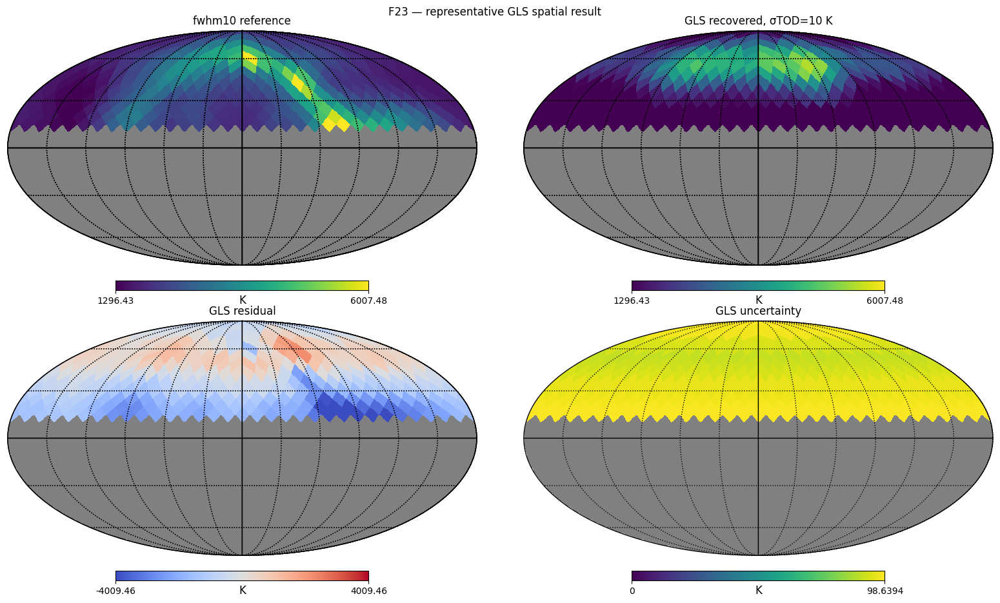

In [59]:
# ============================================================
# F23 — GLS recovered map / residual / uncertainty
# ============================================================

truth_full = patch_to_full(
    GLS_TRUTH,
    GLS_PIX,
    MAP_NSIDE,
)
rec_full = patch_to_full(
    gls_rec,
    GLS_PIX,
    MAP_NSIDE,
)
res_full = patch_to_full(
    gls_residual,
    GLS_PIX,
    MAP_NSIDE,
)
unc_full = patch_to_full(
    gls_unc,
    GLS_PIX,
    MAP_NSIDE,
)

vmin = finite_percentile(GLS_TRUTH, 1)
vmax = finite_percentile(GLS_TRUTH, 99)
rmax = finite_percentile(np.abs(gls_residual), 98, fallback=1.0)
umax = finite_percentile(gls_unc, 99, fallback=1.0)

fig = plt.figure(figsize=(16, 9))

hp.mollview(
    truth_full, fig=fig.number, sub=(2, 2, 1),
    title=f"{REPRESENTATIVE_REF} reference",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    rec_full, fig=fig.number, sub=(2, 2, 2),
    title=f"GLS recovered, σTOD={GLS_REP_SIGMA:g} K",
    unit="K", min=vmin, max=vmax, badcolor="gray",
)
hp.graticule()

hp.mollview(
    res_full, fig=fig.number, sub=(2, 2, 3),
    title="GLS residual",
    unit="K", min=-rmax, max=rmax,
    cmap="coolwarm", badcolor="gray",
)
hp.graticule()

hp.mollview(
    unc_full, fig=fig.number, sub=(2, 2, 4),
    title="GLS uncertainty",
    unit="K", min=0, max=umax, badcolor="gray",
)
hp.graticule()

plt.suptitle("F23 — representative GLS spatial result", y=1.02)
save_current_figure("F23_GLS_map_residual_uncertainty.png")
plt.show()

In [60]:
# ============================================================
# 7.5 GLS edge versus interior
# ============================================================

gls_edge_mask = edge_mask_for_patch(
    GLS_PIX,
    MAP_NSIDE,
)
gls_interior_mask = ~gls_edge_mask

print("GLS edge pixels:", gls_edge_mask.sum())
print("GLS interior pixels:", gls_interior_mask.sum())

gls_edge_rows = []

for sigma_tod, result in gls_results.items():
    residual = result["residual"]
    unc = result["unc"]
    variance = result["variance"]

    for region_name, mask in [
        ("edge", gls_edge_mask),
        ("interior", gls_interior_mask),
    ]:
        good = (
            mask
            & np.isfinite(residual)
            & np.isfinite(unc)
            & np.isfinite(variance)
            & np.isfinite(GLS_WEIGHTED_HITS)
        )

        if good.sum() == 0:
            gls_edge_rows.append({
                "sigma_tod_K": sigma_tod,
                "region": region_name,
                "n_pix": 0,
                "residual_rmse": np.nan,
                "uncertainty_median": np.nan,
                "uncertainty_p95": np.nan,
                "weighted_hit_median": np.nan,
            })
            continue

        gls_edge_rows.append({
            "sigma_tod_K": sigma_tod,
            "region": region_name,
            "n_pix": int(good.sum()),
            "residual_rmse": float(
                np.sqrt(np.mean(residual[good] ** 2))
            ),
            "uncertainty_median": float(
                np.median(unc[good])
            ),
            "uncertainty_p95": float(
                np.percentile(unc[good], 95)
            ),
            "weighted_hit_median": float(
                np.median(GLS_WEIGHTED_HITS[good])
            ),
        })

gls_edge_df = pd.DataFrame(gls_edge_rows)
display(gls_edge_df)

gls_edge_df.to_csv(
    TABLE_DIR / "GLS_edge_vs_interior.csv",
    index=False,
)

GLS edge pixels: 64
GLS interior pixels: 240


,sigma_tod_K,region,n_pix,residual_rmse,uncertainty_median,uncertainty_p95,weighted_hit_median
0,1.0,edge,64,1979.983910,77.155533,78.709691,0.504808
1,1.0,interior,240,1030.511937,67.606784,84.406279,6.415873
2,5.0,edge,64,2562.656816,95.098800,95.464972,0.504808
3,5.0,interior,240,948.468311,88.751977,93.966510,6.415873
4,10.0,edge,64,2645.084775,97.827019,97.991145,0.504808
5,10.0,interior,240,1029.244448,94.385624,96.751787,6.415873
6,25.0,edge,64,2679.260879,99.121288,99.192711,0.504808
7,25.0,interior,240,1091.424179,97.388582,98.675687,6.415873
8,50.0,edge,64,2688.980718,99.379213,99.415102,0.504808
9,50.0,interior,240,1106.146441,98.113057,99.157511,6.415873


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/F24_GLS_edge_vs_interior.png


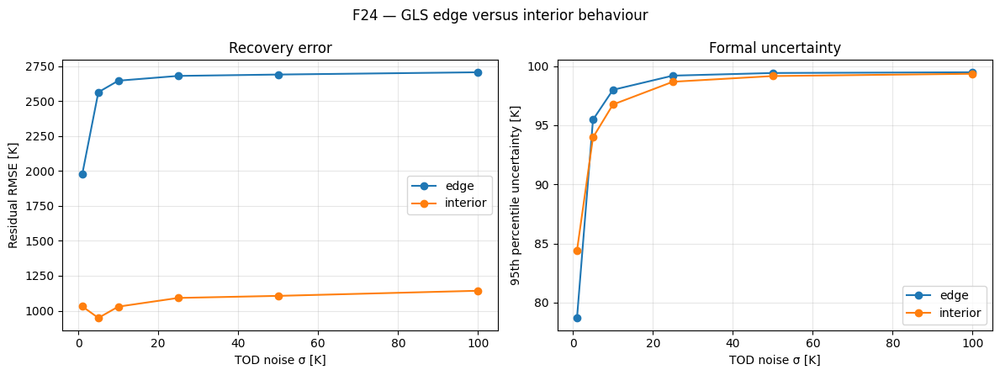

In [61]:
# ============================================================
# F24 — GLS edge versus interior diagnostic
# ============================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))

for region in ["edge", "interior"]:
    sub = gls_edge_df[
        gls_edge_df["region"] == region
    ]

    ax[0].plot(
        sub["sigma_tod_K"],
        sub["residual_rmse"],
        marker="o",
        label=region,
    )

    ax[1].plot(
        sub["sigma_tod_K"],
        sub["uncertainty_p95"],
        marker="o",
        label=region,
    )

ax[0].set_xlabel("TOD noise σ [K]")
ax[0].set_ylabel("Residual RMSE [K]")
ax[0].set_title("Recovery error")
ax[0].grid(alpha=0.3)
ax[0].legend()

ax[1].set_xlabel("TOD noise σ [K]")
ax[1].set_ylabel("95th percentile uncertainty [K]")
ax[1].set_title("Formal uncertainty")
ax[1].grid(alpha=0.3)
ax[1].legend()

plt.suptitle("F24 — GLS edge versus interior behaviour")
plt.tight_layout()
save_current_figure("F24_GLS_edge_vs_interior.png")
plt.show()

# 8. Additional robustness / appendix diagnostics
These are retained because they may be useful for the thesis discussion or appendices, but they do not replace F1–F24.

In [62]:
# ============================================================
# 8.1 Native LimTOD white-noise robustness for selected rotation cases
# ============================================================

NATIVE_NOISE_SIGMAS_K = [0.0, 1.0, 5.0, 10.0, 25.0, 50.0]
NATIVE_NOISE_SEEDS = [0, 1, 2]

native_noise_base_cases = ["A", "C", "E", "G"]
native_noise_rows = []

for case_id in native_noise_base_cases:
    base = rotation_results[case_id]

    for sigma_k in NATIVE_NOISE_SIGMAS_K:
        for seed in NATIVE_NOISE_SEEDS:
            rng = np.random.default_rng(seed)

            if sigma_k == 0.0:
                noisy_tod = base["tod"].copy()
            else:
                noisy_tod = (
                    base["tod"]
                    + rng.normal(
                        0.0,
                        sigma_k,
                        size=base["tod"].size,
                    )
                )

            rec, unc = recover_native(
                base["mapper"],
                noisy_tod,
                regularization=base.get("regularization", REG_RIDGE),
                dtime=base["scan"]["dt_seconds"],
            )

            met = map_metrics(
                rec,
                base["truth_patch"],
                base["weighted_hits"],
                cut=PLOT_HIT_CUT,
            )

            native_noise_rows.append({
                "ID": case_id,
                "sigma_K": sigma_k,
                "seed": seed,
                **met,
            })

native_noise_df = pd.DataFrame(native_noise_rows)

native_noise_summary = (
    native_noise_df
    .groupby(["ID", "sigma_K"])
    .agg(
        rmse_mean=("rmse", "mean"),
        rmse_std=("rmse", "std"),
        corr_mean=("corr", "mean"),
        corr_std=("corr", "std"),
    )
    .reset_index()
)

display(native_noise_summary)
native_noise_summary.to_csv(
    TABLE_DIR / "native_LimTOD_noise_robustness.csv",
    index=False,
)

,ID,sigma_K,rmse_mean,rmse_std,corr_mean,corr_std
0,A,0.0,1037.883442,0.000000,0.573673,0.000000
1,A,1.0,1041.198708,1.066653,0.572358,0.001300
2,A,5.0,1063.432125,4.974837,0.563652,0.006330
3,A,10.0,1110.243557,8.956436,0.545956,0.012165
4,A,25.0,1351.456458,15.212168,0.467517,0.026343
5,A,50.0,1943.702174,16.665934,0.339944,0.040592
6,C,0.0,371.673312,0.000000,0.924744,0.000000
7,C,1.0,373.157344,1.727958,0.924101,0.000541
8,C,5.0,400.360072,8.038306,0.913467,0.002528
9,C,10.0,473.300381,14.592957,0.883641,0.004599


In [63]:
# ============================================================
# 8.2 Gain drift robustness
# Uses guaranteed metadata fields from rotation_results.
# ============================================================

def gain_sinusoid(tod, scan, amplitude, period_hours):
    t = np.asarray(scan["time_s"], dtype=float)
    gain = 1.0 + float(amplitude) * np.sin(
        2.0 * np.pi * t / (float(period_hours) * 3600.0)
    )
    return tod * gain


def gain_linear(tod, scan, total_fractional_drift):
    t = np.asarray(scan["time_s"], dtype=float)
    x = (t - t.min()) / (t.max() - t.min() + 1e-30)
    gain = 1.0 + float(total_fractional_drift) * (x - 0.5)
    return tod * gain


gain_rows = []

for case_id in ["A", "C", "E"]:
    base = rotation_results[case_id]

    gain_cases = {
        "sine_1pct_6h": gain_sinusoid(
            base["tod"], base["scan"], 0.01, 6.0
        ),
        "sine_5pct_6h": gain_sinusoid(
            base["tod"], base["scan"], 0.05, 6.0
        ),
        "linear_1pct": gain_linear(
            base["tod"], base["scan"], 0.01
        ),
        "linear_5pct": gain_linear(
            base["tod"], base["scan"], 0.05
        ),
    }

    for gain_case, transformed_tod in gain_cases.items():
        rec, unc = recover_native(
            base["mapper"],
            transformed_tod,
            regularization=base.get("regularization", REG_RIDGE),
            dtime=base["scan"]["dt_seconds"],
        )

        met = map_metrics(
            rec,
            base["truth_patch"],
            base["weighted_hits"],
            cut=PLOT_HIT_CUT,
        )

        gain_rows.append({
            "ID": case_id,
            "gain_case": gain_case,
            **met,
        })

gain_df = pd.DataFrame(gain_rows)
display(gain_df)
gain_df.to_csv(
    TABLE_DIR / "gain_drift_robustness.csv",
    index=False,
)

,ID,gain_case,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,A,sine_1pct_6h,240,1038.534725,-145.673922,1028.267224,0.572034,790.032247,2047.661433
1,A,sine_5pct_6h,240,1221.401106,-147.619327,1212.447606,0.500569,935.777602,2365.697247
2,A,linear_1pct,240,1041.702341,-146.551304,1031.342079,0.574048,792.184754,2133.550449
3,A,linear_5pct,240,1094.281552,-152.006237,1083.672561,0.561465,846.971698,2112.962126
4,C,sine_1pct_6h,240,388.224835,33.973036,386.735511,0.917875,291.841091,813.746457
5,C,sine_5pct_6h,240,682.717308,35.748584,681.780728,0.787295,508.272682,1484.714747
6,C,linear_1pct,240,374.120581,35.039306,372.476115,0.923665,286.502119,685.835353
7,C,linear_5pct,240,436.816793,41.079935,434.880846,0.898577,345.770396,885.350037
8,E,sine_1pct_6h,304,620.185372,-25.207328,619.672886,0.791521,439.822318,1133.001149
9,E,sine_5pct_6h,304,968.740348,-32.808518,968.184622,0.623104,748.491471,1860.892745


Saved: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES/A4_rotation_information_eigenspectrum.png


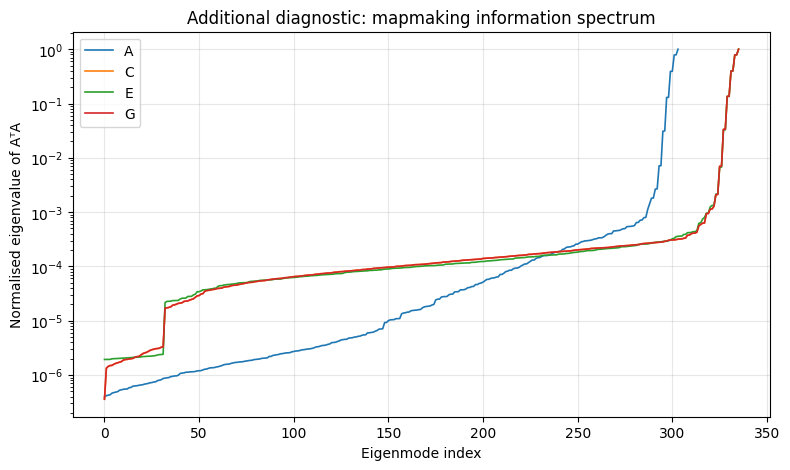

In [64]:
# ============================================================
# 8.3 Operator information/eigenspectrum diagnostic
# ============================================================

fig, ax = plt.subplots(figsize=(9, 5))

for case_id in ["A", "C", "E", "G"]:
    A_case = rotation_results[case_id]["A"]

    eig = np.linalg.eigvalsh(A_case.T @ A_case)
    eig = np.sort(np.clip(eig, 1e-30, np.inf))
    eig = eig / np.max(eig)

    ax.semilogy(
        np.arange(eig.size),
        eig,
        lw=1.2,
        label=case_id,
    )

ax.set_xlabel("Eigenmode index")
ax.set_ylabel("Normalised eigenvalue of AᵀA")
ax.set_title("Additional diagnostic: mapmaking information spectrum")
ax.grid(alpha=0.3)
ax.legend()

save_current_figure("A4_rotation_information_eigenspectrum.png")
plt.show()

# 9. F1–F24 thesis figure manifest
The notebook reaches this cell only after all required plots have been generated.

In [65]:
# ============================================================
# 9.1 Required thesis figure manifest and existence check
# ============================================================

THESIS_FIGURES = {
    "F1": "F1_GDSM_plain_10_20_40.png",
    "F2": "F2_Gaussian_beams_10_20_40.png",
    "F3": "F3_Gaussian_rotation_null.png",
    "F4": "F4_Gaussian_closure_input_recovered_residual.png",
    "F5": "F5_baseline_TOD_24h_no_rotation.png",
    "F6": "F6_HornDry_70MHz.png",
    "F7": "F7_HornDry_baseline_6panel.png",
    "F8": "F8_baseline_reference_smoothing_metrics.png",
    "F9": "F9_rotation_A_to_G_uncertainty_metrics.png",
    "F10": "F10_rotation_common_pixel_uncertainty.png",
    "F11": "F11_rotation_orientation_coverage.png",
    "F12": "F12_rotation_representative_maps.png",
    "F13": "F13_rotation_residual_comparison.png",
    "F14": "F14_rotation_hit_map_comparison.png",
    "F15": "F15_rotation_uncertainty_comparison.png",
    "F16": "F16_prior_regularisation_ladder.png",
    "F17": "F17_representative_prior_maps.png",
    "F18": "F18_HornDry_vs_HornWet_70MHz.png",
    "F19": "F19_beam_mismatch_matrix_metrics.png",
    "F20": "F20_matched_vs_mismatched_maps.png",
    "F21": "F21_noisy_TOD_example.png",
    "F22": "F22_GLS_sigma_TOD_sweep.png",
    "F23": "F23_GLS_map_residual_uncertainty.png",
    "F24": "F24_GLS_edge_vs_interior.png",
}

manifest_rows = []

for figure_id, filename in THESIS_FIGURES.items():
    path = FIG_DIR / filename

    manifest_rows.append({
        "ID": figure_id,
        "filename": filename,
        "exists": path.exists(),
        "path": str(path),
    })

figure_manifest_df = pd.DataFrame(manifest_rows)
display(figure_manifest_df)

missing_figures = figure_manifest_df[
    ~figure_manifest_df["exists"]
]

if len(missing_figures):
    raise RuntimeError(
        "The notebook reached the final manifest but some required "
        "F1–F24 files were not created:\n"
        + "\n".join(
            missing_figures["ID"] + " -> " + missing_figures["filename"]
        )
    )

figure_manifest_df.to_csv(
    TABLE_DIR / "F1_F24_figure_manifest.csv",
    index=False,
)

print("SUCCESS: all F1–F24 thesis figures exist.")
print("Figure directory:", FIG_DIR)
print("Table directory:", TABLE_DIR)

ROTATION_CRITICAL_FIGURES = {
    "F9A": "F9A_rotation_A_to_G_recovered_sky_atlas.png",
    "F9B": "F9B_rotation_A_to_G_uncertainty_atlas.png",
    "F19B": "F19B_rotation_mismatch_penalty.png",
}

rotation_manifest_rows = []
for figure_id, filename in ROTATION_CRITICAL_FIGURES.items():
    path = FIG_DIR / filename
    rotation_manifest_rows.append({
        "ID": figure_id,
        "filename": filename,
        "exists": path.exists(),
        "path": str(path),
    })

rotation_figure_manifest_df = pd.DataFrame(rotation_manifest_rows)
display(rotation_figure_manifest_df)

missing_rotation_figures = rotation_figure_manifest_df[
    ~rotation_figure_manifest_df["exists"]
]

if len(missing_rotation_figures):
    raise RuntimeError(
        "Critical rotation figures are missing:\n"
        + "\n".join(
            missing_rotation_figures["ID"]
            + " -> "
            + missing_rotation_figures["filename"]
        )
    )

rotation_figure_manifest_df.to_csv(
    TABLE_DIR / "rotation_critical_figure_manifest.csv",
    index=False,
)

print("SUCCESS: F1–F24 plus the critical rotation figures all exist.")


,ID,filename,exists,path
0,F1,F1_GDSM_plain_10_20_40.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
1,F2,F2_Gaussian_beams_10_20_40.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
2,F3,F3_Gaussian_rotation_null.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
3,F4,F4_Gaussian_closure_input_recovered_residual.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
4,F5,F5_baseline_TOD_24h_no_rotation.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
5,F6,F6_HornDry_70MHz.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
6,F7,F7_HornDry_baseline_6panel.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
7,F8,F8_baseline_reference_smoothing_metrics.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
8,F9,F9_rotation_A_to_G_uncertainty_metrics.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
9,F10,F10_rotation_common_pixel_uncertainty.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...


SUCCESS: all F1–F24 thesis figures exist.
Figure directory: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_FIGURES
Table directory: /Users/user/LimTOD/rhino-TODsim/RoastSim/THESIS_MASTER_OUTPUTS/tables


,ID,filename,exists,path
0,F9A,F9A_rotation_A_to_G_recovered_sky_atlas.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
1,F9B,F9B_rotation_A_to_G_uncertainty_atlas.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...
2,F19B,F19B_rotation_mismatch_penalty.png,True,/Users/user/LimTOD/rhino-TODsim/RoastSim/THESI...


SUCCESS: F1–F24 plus the critical rotation figures all exist.


# Thesis interpretation checklist

### Gaussian validation
- F2 defines the controlled beams.
- F3 is a null test: an axisymmetric Gaussian should not respond to self-rotation.
- F4 tests the inverse independently of the physical high-resolution forward-model mismatch.

### Baseline
- F5 is the physical HornDry observation **before any rotation experiment**.
- F7 establishes the recoverable selected patch at the fixed `0.05` threshold.
- Grey pixels are not “missing because the threshold should be lowered”; they are outside the selected mapmaker patch.
- F8 shows that the apparent recovery quality depends on which low-resolution smoothing is used as the comparison reference.

### Rotation
- F9 is the raw A–G result.
- F10 is the critical fair comparison on identical well-observed pixels.
- F11 explains the geometric difference between scan strategies.
- F12–F15 make recovery, residual, hit weighting and formal uncertainty spatially interpretable.

### Priors
- F16/F17 use the native LimTOD prior interface.
- The prior tests should be interpreted separately from rotation and beam mismatch.

### Beam mismatch
- F18 establishes the physical Dry/Wet beam difference.
- F19 measures matched/mismatched recovery quality.
- F20 shows the spatial impact on common pixels.

### GLS
- F21 explicitly shows the noisy data entering GLS.
- F22 is the main noise-performance sweep.
- F23 shows map/residual/uncertainty.
- F24 checks whether error and formal uncertainty concentrate at selected-patch boundaries.

,case,kind,prior_label,regularization,prior_strength_value,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,no_prior_reg1e-8,no_prior,none,1.000000e-08,NaN,240,1079.823198,94.904036,1075.644627,0.505951,833.179646,2175.360100
1,no_prior_reg1e-4,ridge_only,ridge,1.000000e-04,0.0001,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
2,abs_sigma_5000K,absolute_prior,σ=5000 K,1.000000e-08,5000.0000,240,1077.673527,94.718526,1073.502973,0.506963,831.279841,2171.981415
3,abs_sigma_2000K,absolute_prior,σ=2000 K,1.000000e-08,2000.0000,240,1066.950628,93.793849,1062.820002,0.512060,822.079603,2150.597994
4,abs_sigma_1000K,absolute_prior,σ=1000 K,1.000000e-08,1000.0000,240,1034.773202,91.020135,1030.762298,0.527863,797.058505,2023.954331
5,abs_sigma_500K,absolute_prior,σ=500 K,1.000000e-08,500.0000,240,954.977615,84.058455,951.270951,0.570421,738.761884,1813.024646
6,abs_sigma_200K,absolute_prior,σ=200 K,1.000000e-08,200.0000,240,783.248244,68.478879,780.248970,0.675823,605.442659,1560.086340
7,abs_sigma_100K,absolute_prior,σ=100 K,1.000000e-08,100.0000,240,623.429431,54.172411,621.071336,0.779415,475.310455,1287.154878
8,relative_0.5,relative_prior,"0.5×prior, floor 300 K",1.000000e-08,0.5000,240,1044.877438,90.416712,1040.958058,0.520974,802.532466,2057.892055
9,relative_0.3,relative_prior,"0.3×prior, floor 300 K",1.000000e-08,0.3000,240,1003.237545,84.252323,999.693512,0.540168,768.116309,1935.073803


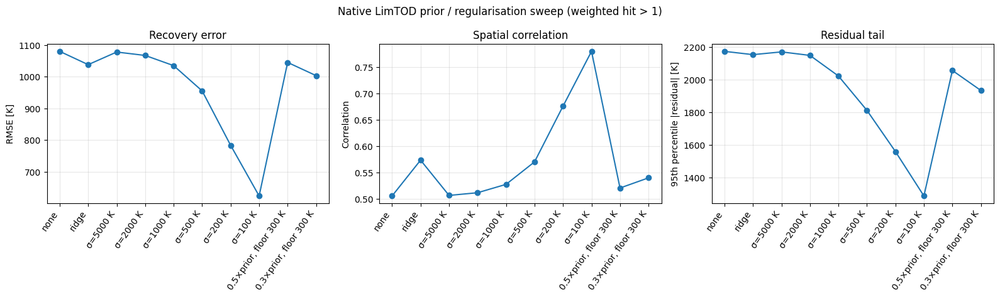

In [66]:
# ============================================================
# PRIOR / REGULARISATION SWEEP — quantitative recovery metric
# ============================================================

prior_truth = baseline_reference_patches[REPRESENTATIVE_REF]

prior_metric_rows = []

for case_name, result in prior_results.items():

    recovered = np.asarray(result["map"], dtype=float)

    met = map_metrics(
        recovered,
        prior_truth,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    )

    prior_metric_rows.append({
        "case": case_name,
        "kind": result.get("kind", "unknown"),
        "prior_label": result.get("prior_label", case_name),
        "regularization": result.get("regularization", np.nan),
        "prior_strength_value": result.get("prior_strength_value", np.nan),
        **met,
    })

prior_diagnostic_df = pd.DataFrame(prior_metric_rows)

display(prior_diagnostic_df)

fig, ax = plt.subplots(1, 3, figsize=(16, 4.8))

x = np.arange(len(prior_diagnostic_df))

ax[0].plot(
    x,
    prior_diagnostic_df["rmse"],
    marker="o",
)

ax[0].set_xticks(x)
ax[0].set_xticklabels(
    prior_diagnostic_df["prior_label"],
    rotation=55,
    ha="right",
)
ax[0].set_ylabel("RMSE [K]")
ax[0].set_title("Recovery error")
ax[0].grid(alpha=0.3)


ax[1].plot(
    x,
    prior_diagnostic_df["corr"],
    marker="o",
)

ax[1].set_xticks(x)
ax[1].set_xticklabels(
    prior_diagnostic_df["prior_label"],
    rotation=55,
    ha="right",
)
ax[1].set_ylabel("Correlation")
ax[1].set_title("Spatial correlation")
ax[1].grid(alpha=0.3)


ax[2].plot(
    x,
    prior_diagnostic_df["p95_abs_residual"],
    marker="o",
)

ax[2].set_xticks(x)
ax[2].set_xticklabels(
    prior_diagnostic_df["prior_label"],
    rotation=55,
    ha="right",
)
ax[2].set_ylabel("95th percentile |residual| [K]")
ax[2].set_title("Residual tail")
ax[2].grid(alpha=0.3)


plt.suptitle(
    f"Native LimTOD prior / regularisation sweep "
    f"(weighted hit > {PLOT_HIT_CUT:g})"
)

plt.tight_layout()
plt.show()

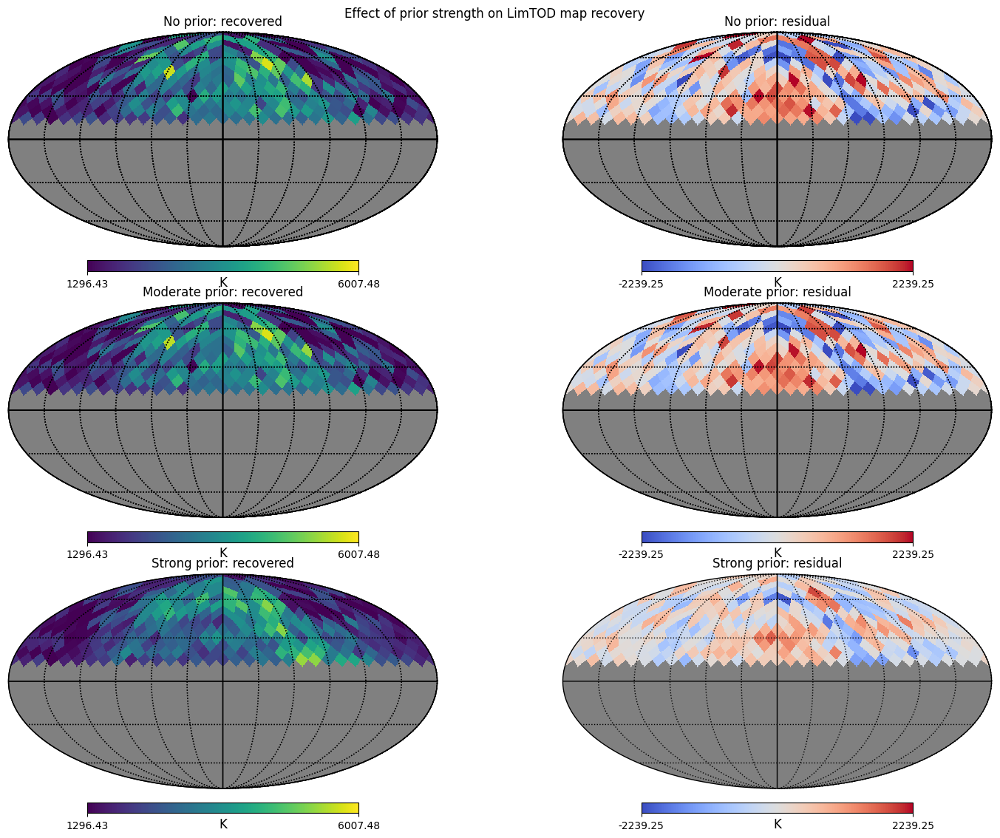

In [67]:
# ============================================================
# REPRESENTATIVE PRIOR CASES — recovered map + residual
# ============================================================

representative_prior_cases = {
    "No prior": "no_prior_reg1e-8",
    "Moderate prior": "abs_sigma_1000K",
    "Strong prior": "abs_sigma_100K",
}

prior_truth = baseline_reference_patches[REPRESENTATIVE_REF]

# Use identical colour limits for all recovered maps.
vmin = finite_percentile(prior_truth, 1)
vmax = finite_percentile(prior_truth, 99)

# Determine one common residual scale across all three cases.
all_prior_residuals = []

for label, case_name in representative_prior_cases.items():
    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    all_prior_residuals.append(
        recovered - prior_truth
    )

all_prior_residuals = np.concatenate(all_prior_residuals)

rmax = finite_percentile(
    np.abs(all_prior_residuals),
    98,
    fallback=1.0,
)


fig = plt.figure(figsize=(15, 11))

for row, (label, case_name) in enumerate(
    representative_prior_cases.items()
):

    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    residual = recovered - prior_truth

    recovered_full = patch_to_full(
        recovered,
        baseline_pix,
        MAP_NSIDE,
    )

    residual_full = patch_to_full(
        residual,
        baseline_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        recovered_full,
        fig=fig.number,
        sub=(3, 2, 2 * row + 1),
        title=f"{label}: recovered",
        unit="K",
        min=vmin,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        residual_full,
        fig=fig.number,
        sub=(3, 2, 2 * row + 2),
        title=f"{label}: residual",
        unit="K",
        min=-rmax,
        max=rmax,
        cmap="coolwarm",
        badcolor="gray",
    )
    hp.graticule()


plt.suptitle(
    "Effect of prior strength on LimTOD map recovery",
    y=1.01,
)

plt.show()

Operator shape: (1440, 304)
Rank: 304
Number of sky parameters: 304
Condition number: 1602.8045895059547


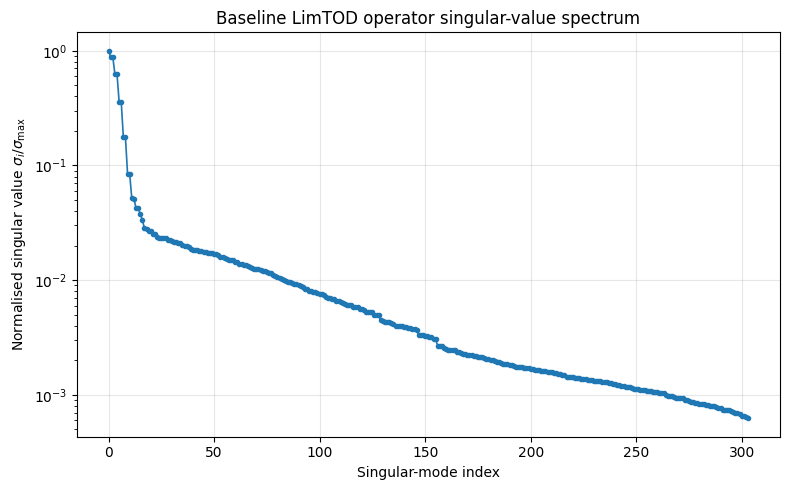

In [68]:
# ============================================================
# BASELINE OPERATOR INFORMATION CONTENT — singular-value spectrum
# ============================================================

A = np.asarray(baseline_A, dtype=float)

singular_values = np.linalg.svd(
    A,
    compute_uv=False,
)

# Sort descending explicitly.
singular_values = np.sort(
    singular_values
)[::-1]

singular_values_normalised = (
    singular_values
    / singular_values[0]
)

condition_number = (
    singular_values[0]
    / singular_values[-1]
)

print("Operator shape:", A.shape)
print("Rank:", np.linalg.matrix_rank(A))
print("Number of sky parameters:", A.shape[1])
print("Condition number:", condition_number)


fig, ax = plt.subplots(figsize=(8, 5))

ax.semilogy(
    np.arange(len(singular_values_normalised)),
    singular_values_normalised,
    marker=".",
    lw=1.2,
)

ax.set_xlabel("Singular-mode index")
ax.set_ylabel(
    r"Normalised singular value $\sigma_i/\sigma_{\max}$"
)

ax.set_title(
    "Baseline LimTOD operator singular-value spectrum"
)

ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

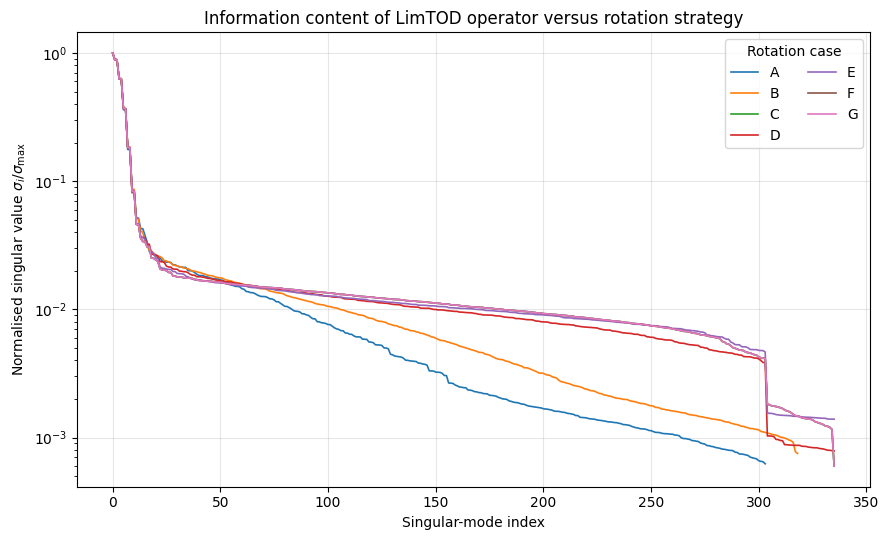

,ID,n_tod,n_map_parameters,rank,condition_number,smallest_singular_value,largest_singular_value
0,A,1440,304,304,1602.804590,0.001674,2.683712
1,B,1440,319,319,1331.610032,0.002013,2.680312
2,C,1440,336,336,1669.927921,0.001601,2.672947
3,D,8640,336,336,1272.168759,0.005153,6.555660
4,E,17280,336,336,718.756759,0.012898,9.270228
5,F,4320,336,336,1669.927921,0.002772,4.629680
6,G,17280,336,336,1669.927921,0.005545,9.259360


In [69]:
# ============================================================
# ROTATION A–G — singular-value spectra of the mapmaking operator
# ============================================================

fig, ax = plt.subplots(figsize=(9, 5.5))

rotation_spectrum_rows = []

for case_id in ["A", "B", "C", "D", "E", "F", "G"]:

    A_case = np.asarray(
        rotation_results[case_id]["A"],
        dtype=float,
    )

    s = np.linalg.svd(
        A_case,
        compute_uv=False,
    )

    s = np.sort(s)[::-1]

    s_norm = s / s[0]

    condition_number = (
        s[0] / s[-1]
        if s[-1] > 0
        else np.inf
    )

    numerical_rank = np.linalg.matrix_rank(A_case)

    rotation_spectrum_rows.append({
        "ID": case_id,
        "n_tod": A_case.shape[0],
        "n_map_parameters": A_case.shape[1],
        "rank": numerical_rank,
        "condition_number": condition_number,
        "smallest_singular_value": float(s[-1]),
        "largest_singular_value": float(s[0]),
    })

    ax.semilogy(
        np.arange(len(s_norm)),
        s_norm,
        lw=1.2,
        label=case_id,
    )


ax.set_xlabel("Singular-mode index")

ax.set_ylabel(
    r"Normalised singular value $\sigma_i/\sigma_{\max}$"
)

ax.set_title(
    "Information content of LimTOD operator versus rotation strategy"
)

ax.grid(alpha=0.3)

ax.legend(
    title="Rotation case",
    ncol=2,
)

plt.tight_layout()
plt.show()


rotation_spectrum_df = pd.DataFrame(
    rotation_spectrum_rows
)

display(rotation_spectrum_df)

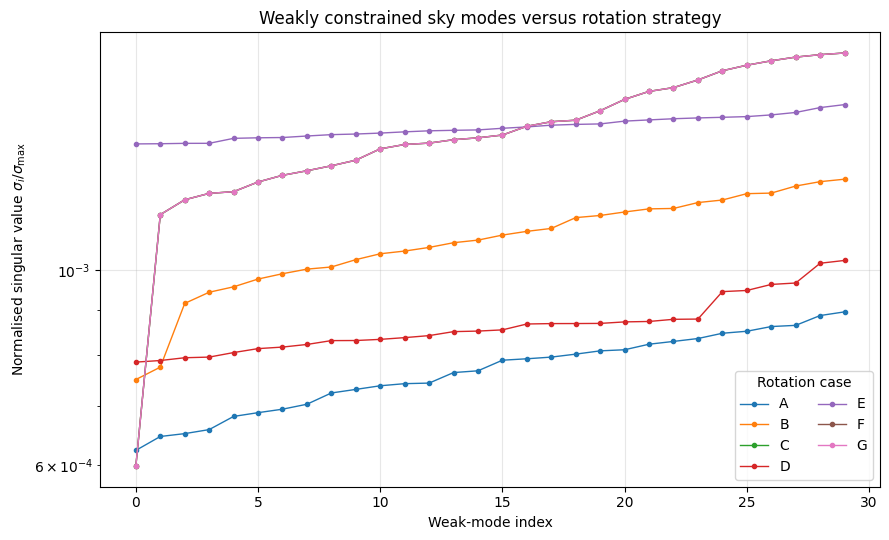

In [70]:
# ============================================================
# ROTATION A–G — weakest singular modes
# ============================================================

N_WEAKEST = 30

fig, ax = plt.subplots(figsize=(9, 5.5))

for case_id in ["A", "B", "C", "D", "E", "F", "G"]:

    A_case = np.asarray(
        rotation_results[case_id]["A"],
        dtype=float,
    )

    s = np.linalg.svd(
        A_case,
        compute_uv=False,
    )

    s = np.sort(s)

    s_norm = s / np.max(s)

    n_show = min(
        N_WEAKEST,
        len(s_norm),
    )

    weak_tail = s_norm[:n_show]

    ax.semilogy(
        np.arange(n_show),
        weak_tail,
        marker="o",
        ms=3,
        lw=1.0,
        label=case_id,
    )


ax.set_xlabel(
    "Weak-mode index"
)

ax.set_ylabel(
    r"Normalised singular value $\sigma_i/\sigma_{\max}$"
)

ax.set_title(
    "Weakly constrained sky modes versus rotation strategy"
)

ax.grid(alpha=0.3)

ax.legend(
    title="Rotation case",
    ncol=2,
)

plt.tight_layout()
plt.show()

,case,kind,prior_label,regularization,prior_strength_value,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,no_prior_reg1e-8,no_prior,none,1.000000e-08,NaN,240,1079.823198,94.904036,1075.644627,0.505951,833.179646,2175.360100
1,no_prior_reg1e-4,ridge_only,ridge,1.000000e-04,0.0001,240,1037.883442,-145.187570,1027.678262,0.573673,785.740315,2155.184258
2,abs_sigma_5000K,absolute_prior,σ=5000 K,1.000000e-08,5000.0000,240,1077.673527,94.718526,1073.502973,0.506963,831.279841,2171.981415
3,abs_sigma_2000K,absolute_prior,σ=2000 K,1.000000e-08,2000.0000,240,1066.950628,93.793849,1062.820002,0.512060,822.079603,2150.597994
4,abs_sigma_1000K,absolute_prior,σ=1000 K,1.000000e-08,1000.0000,240,1034.773202,91.020135,1030.762298,0.527863,797.058505,2023.954331
5,abs_sigma_500K,absolute_prior,σ=500 K,1.000000e-08,500.0000,240,954.977615,84.058455,951.270951,0.570421,738.761884,1813.024646
6,abs_sigma_200K,absolute_prior,σ=200 K,1.000000e-08,200.0000,240,783.248244,68.478879,780.248970,0.675823,605.442659,1560.086340
7,abs_sigma_100K,absolute_prior,σ=100 K,1.000000e-08,100.0000,240,623.429431,54.172411,621.071336,0.779415,475.310455,1287.154878
8,relative_0.5,relative_prior,"0.5×prior, floor 300 K",1.000000e-08,0.5000,240,1044.877438,90.416712,1040.958058,0.520974,802.532466,2057.892055
9,relative_0.3,relative_prior,"0.3×prior, floor 300 K",1.000000e-08,0.3000,240,1003.237545,84.252323,999.693512,0.540168,768.116309,1935.073803


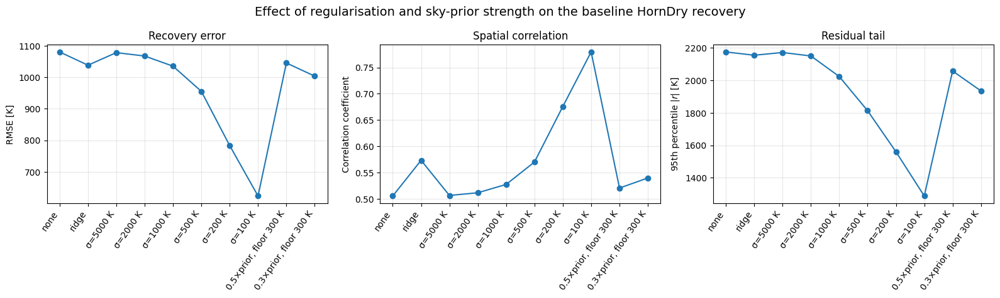

In [71]:
# ============================================================
# PRIOR / REGULARISATION SWEEP — thesis figure
# ============================================================

prior_truth = baseline_reference_patches[REPRESENTATIVE_REF]

prior_metric_rows = []

for case_name, result in prior_results.items():

    recovered = np.asarray(
        result["map"],
        dtype=float,
    )

    met = map_metrics(
        recovered,
        prior_truth,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    )

    prior_metric_rows.append({
        "case": case_name,
        "kind": result.get("kind", "unknown"),
        "prior_label": result.get(
            "prior_label",
            case_name,
        ),
        "regularization": result.get(
            "regularization",
            np.nan,
        ),
        "prior_strength_value": result.get(
            "prior_strength_value",
            np.nan,
        ),
        **met,
    })


prior_diagnostic_df = pd.DataFrame(
    prior_metric_rows
)

display(prior_diagnostic_df)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(16, 4.8),
)

x = np.arange(
    len(prior_diagnostic_df)
)

labels = prior_diagnostic_df[
    "prior_label"
]


# ---- RMSE ----

ax[0].plot(
    x,
    prior_diagnostic_df["rmse"],
    marker="o",
)

ax[0].set_xticks(x)
ax[0].set_xticklabels(
    labels,
    rotation=55,
    ha="right",
)

ax[0].set_ylabel("RMSE [K]")
ax[0].set_title("Recovery error")

ax[0].grid(
    alpha=0.3
)


# ---- Correlation ----

ax[1].plot(
    x,
    prior_diagnostic_df["corr"],
    marker="o",
)

ax[1].set_xticks(x)
ax[1].set_xticklabels(
    labels,
    rotation=55,
    ha="right",
)

ax[1].set_ylabel("Correlation coefficient")
ax[1].set_title("Spatial correlation")

ax[1].grid(
    alpha=0.3
)


# ---- Residual tail ----

ax[2].plot(
    x,
    prior_diagnostic_df["p95_abs_residual"],
    marker="o",
)

ax[2].set_xticks(x)
ax[2].set_xticklabels(
    labels,
    rotation=55,
    ha="right",
)

ax[2].set_ylabel(
    r"95th percentile $|r|$ [K]"
)

ax[2].set_title(
    "Residual tail"
)

ax[2].grid(
    alpha=0.3
)


plt.suptitle(
    "Effect of regularisation and sky-prior strength "
    "on the baseline HornDry recovery",
    fontsize=14,
)

plt.tight_layout()

plt.show()

In [72]:
representative_prior_cases = {
    "No informative prior": "no_prior_reg1e-8",
    r"$\sigma_{\rm prior}=500\,\mathrm{K}$": "abs_sigma_500K",
    r"$\sigma_{\rm prior}=100\,\mathrm{K}$": "abs_sigma_100K",
}

In [73]:
prior_truth = baseline_reference_patches[REPRESENTATIVE_REF]

vmin = finite_percentile(prior_truth, 1)
vmax = finite_percentile(prior_truth, 99)

all_residuals = []

for panel_label, case_name in representative_prior_cases.items():
    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )
    all_residuals.append(
        recovered - prior_truth
    )

all_residuals = np.concatenate(
    all_residuals
)

rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)

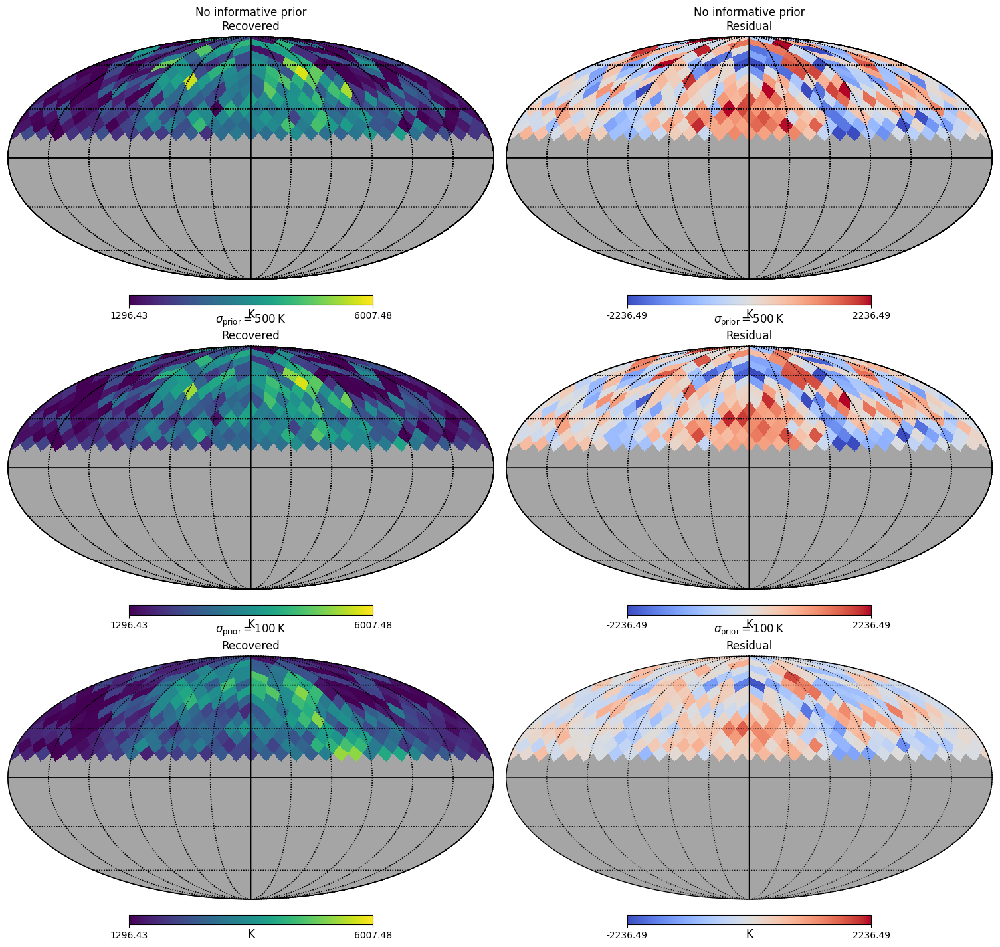

In [77]:
# ============================================================
# REPRESENTATIVE PRIOR RECOVERIES — clean thesis layout
# ============================================================

representative_prior_cases = {
    "No informative prior": "no_prior_reg1e-8",
    r"$\sigma_{\rm prior}=500\,{\rm K}$": "abs_sigma_500K",
    r"$\sigma_{\rm prior}=100\,{\rm K}$": "abs_sigma_100K",
}

prior_truth = np.asarray(
    baseline_reference_patches[REPRESENTATIVE_REF],
    dtype=float,
)


# ------------------------------------------------------------
# Common recovered-map colour scale
# ------------------------------------------------------------

vmin = finite_percentile(
    prior_truth,
    1,
)

vmax = finite_percentile(
    prior_truth,
    99,
)


# ------------------------------------------------------------
# Common residual colour scale
# ------------------------------------------------------------

all_residuals = []

for panel_label, case_name in representative_prior_cases.items():

    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    residual = recovered - prior_truth

    all_residuals.append(residual)


all_residuals = np.concatenate(all_residuals)

rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

# IMPORTANT:
# healpy.mollview manages its own axes and colour bars.
# A tall figure is therefore much safer than tight_layout().
fig = plt.figure(
    figsize=(15, 14)
)


for row, (panel_label, case_name) in enumerate(
    representative_prior_cases.items()
):

    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    residual = recovered - prior_truth


    recovered_full = patch_to_full(
        recovered,
        baseline_pix,
        MAP_NSIDE,
    )

    residual_full = patch_to_full(
        residual,
        baseline_pix,
        MAP_NSIDE,
    )


    # --------------------------------------------------------
    # Recovered map
    # --------------------------------------------------------

    hp.mollview(
        recovered_full,

        fig=fig.number,
        sub=(3, 2, 2 * row + 1),

        title=(
            f"{panel_label}\n"
            "Recovered"
        ),

        unit="K",

        min=vmin,
        max=vmax,

        badcolor="0.65",

        cbar=True,
    )

    hp.graticule(
        dpar=30,
        dmer=30,
    )


    # --------------------------------------------------------
    # Residual
    # --------------------------------------------------------

    hp.mollview(
        residual_full,

        fig=fig.number,
        sub=(3, 2, 2 * row + 2),

        title=(
            f"{panel_label}\n"
            "Residual"
        ),

        unit="K",

        min=-rmax,
        max=rmax,

        cmap="coolwarm",

        badcolor="0.65",

        cbar=True,
    )

    hp.graticule(
        dpar=30,
        dmer=30,
    )


# ------------------------------------------------------------
# DO NOT use tight_layout() with healpy mollview.
#
# Leave deliberate room between the rows because each
# mollview includes its own colourbar.
# ------------------------------------------------------------

plt.subplots_adjust(
    left=0.04,
    right=0.96,
    bottom=0.05,
    top=0.97,
    wspace=0.20,
    hspace=0.50,
)

plt.show()

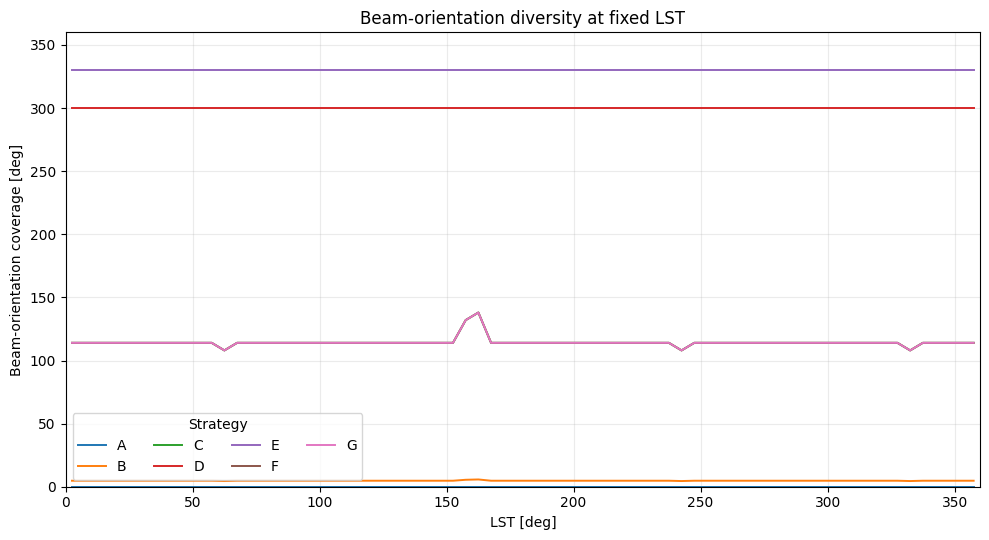

,ID,median_orientation_coverage_deg,p95_orientation_coverage_deg,median_unique_angles
0,A,0.00,0.00,1.0
1,B,4.75,4.75,20.0
2,C,114.00,114.00,20.0
3,D,300.00,300.00,6.0
4,E,330.00,330.00,12.0
5,F,114.00,114.00,20.0
6,G,114.00,114.00,20.0


In [78]:
# ============================================================
# ROTATION PLOT 1
# Orientation coverage at fixed LST
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def orientation_coverage_by_lst(
    scan,
    lst_bin_width_deg=5.0,
):
    """
    For each LST bin, quantify the circular span of self-rotation
    angles sampled in that bin.

    Coverage = 360 deg - largest gap between sampled angles.
    """

    lst = np.asarray(
        scan["LST_deg"],
        dtype=float,
    ) % 360.0

    rotation = np.asarray(
        scan["selfrot_deg"],
        dtype=float,
    ) % 360.0

    edges = np.arange(
        0.0,
        360.0 + lst_bin_width_deg,
        lst_bin_width_deg,
    )

    rows = []

    for lo, hi in zip(
        edges[:-1],
        edges[1:],
    ):

        mask = (
            (lst >= lo)
            & (lst < hi)
        )

        if not np.any(mask):
            continue

        angles = np.sort(
            rotation[mask]
        )

        if angles.size <= 1:

            coverage = 0.0

        else:

            circular_angles = np.r_[
                angles,
                angles[0] + 360.0,
            ]

            gaps = np.diff(
                circular_angles
            )

            largest_gap = np.max(
                gaps
            )

            coverage = (
                360.0
                - largest_gap
            )

        rows.append({
            "lst_bin_centre": 0.5 * (lo + hi),
            "n_samples": int(mask.sum()),
            "n_unique_rotation_angles": int(
                np.unique(
                    np.round(
                        angles,
                        6,
                    )
                ).size
            ),
            "rotation_coverage_deg": float(
                coverage
            ),
        })

    return pd.DataFrame(rows)


# ------------------------------------------------------------
# Calculate A-G
# ------------------------------------------------------------

orientation_tables = {}

for case_id in [
    "A", "B", "C", "D", "E", "F", "G"
]:

    orientation_tables[case_id] = (
        orientation_coverage_by_lst(
            rotation_scans[case_id],
            lst_bin_width_deg=5.0,
        )
    )


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 5.5)
)

for case_id in [
    "A", "B", "C", "D", "E", "F", "G"
]:

    df = orientation_tables[
        case_id
    ]

    ax.plot(
        df["lst_bin_centre"],
        df["rotation_coverage_deg"],
        lw=1.4,
        label=case_id,
    )


ax.set_xlabel(
    "LST [deg]"
)

ax.set_ylabel(
    "Beam-orientation coverage [deg]"
)

ax.set_title(
    "Beam-orientation diversity at fixed LST"
)

ax.set_xlim(
    0,
    360,
)

ax.set_ylim(
    0,
    360,
)

ax.grid(
    alpha=0.25
)

ax.legend(
    title="Strategy",
    ncol=4,
)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Useful numerical summary
# ------------------------------------------------------------

orientation_summary_rows = []

for case_id, df in orientation_tables.items():

    orientation_summary_rows.append({
        "ID": case_id,

        "median_orientation_coverage_deg":
            float(
                np.median(
                    df[
                        "rotation_coverage_deg"
                    ]
                )
            ),

        "p95_orientation_coverage_deg":
            float(
                np.percentile(
                    df[
                        "rotation_coverage_deg"
                    ],
                    95,
                )
            ),

        "median_unique_angles":
            float(
                np.median(
                    df[
                        "n_unique_rotation_angles"
                    ]
                )
            ),
    })


orientation_summary_df = pd.DataFrame(
    orientation_summary_rows
)

display(
    orientation_summary_df
)

,ID,n_pixels,rmse,corr,p95_abs_residual
0,A,240,1037.883442,0.573673,2155.184258
1,B,240,968.341303,0.594488,2068.940415
2,C,240,371.673312,0.924744,696.626568
3,D,304,709.318932,0.734993,1358.522433
4,E,304,601.837647,0.801467,1221.158462
5,F,272,451.013106,0.887659,897.191028
6,G,304,726.940296,0.733036,1475.172553


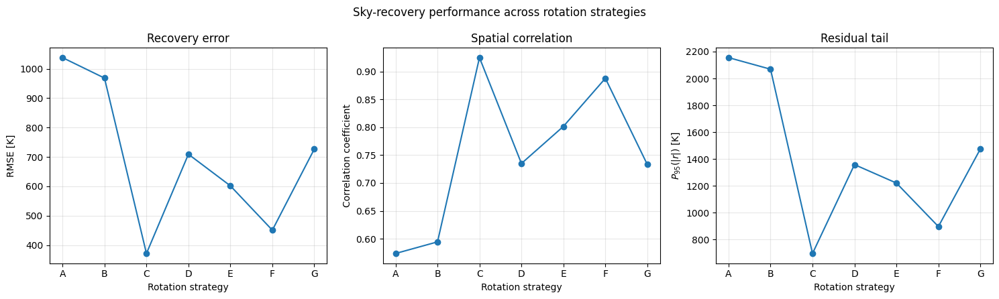

In [79]:
# ============================================================
# ROTATION PLOT 2
# A-G recovery metrics
# ============================================================

rotation_metric_rows = []


for case_id in [
    "A", "B", "C", "D", "E", "F", "G"
]:

    result = rotation_results[
        case_id
    ]

    recovered = np.asarray(
        result["recovered"],
        dtype=float,
    )

    truth = np.asarray(
        result["truth_patch"],
        dtype=float,
    )

    weighted_hits = np.asarray(
        result["weighted_hits"],
        dtype=float,
    )


    # --------------------------------------------------------
    # Same analysis criterion used elsewhere in notebook
    # --------------------------------------------------------

    good = (
        np.isfinite(recovered)
        & np.isfinite(truth)
        & np.isfinite(weighted_hits)
        & (
            weighted_hits
            > PLOT_HIT_CUT
        )
    )


    residual = (
        recovered[good]
        - truth[good]
    )


    rmse = float(
        np.sqrt(
            np.mean(
                residual**2
            )
        )
    )


    p95_residual = float(
        np.percentile(
            np.abs(residual),
            95,
        )
    )


    if (
        np.std(recovered[good]) > 0
        and np.std(truth[good]) > 0
    ):

        corr = float(
            np.corrcoef(
                recovered[good],
                truth[good],
            )[0, 1]
        )

    else:

        corr = np.nan


    rotation_metric_rows.append({

        "ID":
            case_id,

        "n_pixels":
            int(good.sum()),

        "rmse":
            rmse,

        "corr":
            corr,

        "p95_abs_residual":
            p95_residual,
    })


rotation_metric_df = pd.DataFrame(
    rotation_metric_rows
)

display(
    rotation_metric_df
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15, 4.5),
)


# RMSE

ax[0].plot(
    rotation_metric_df["ID"],
    rotation_metric_df["rmse"],
    marker="o",
)

ax[0].set_xlabel(
    "Rotation strategy"
)

ax[0].set_ylabel(
    "RMSE [K]"
)

ax[0].set_title(
    "Recovery error"
)

ax[0].grid(
    alpha=0.3
)


# Correlation

ax[1].plot(
    rotation_metric_df["ID"],
    rotation_metric_df["corr"],
    marker="o",
)

ax[1].set_xlabel(
    "Rotation strategy"
)

ax[1].set_ylabel(
    "Correlation coefficient"
)

ax[1].set_title(
    "Spatial correlation"
)

ax[1].grid(
    alpha=0.3
)


# Residual tail

ax[2].plot(
    rotation_metric_df["ID"],
    rotation_metric_df[
        "p95_abs_residual"
    ],
    marker="o",
)

ax[2].set_xlabel(
    "Rotation strategy"
)

ax[2].set_ylabel(
    r"$P_{95}(|r|)$ [K]"
)

ax[2].set_title(
    "Residual tail"
)

ax[2].grid(
    alpha=0.3
)


plt.suptitle(
    "Sky-recovery performance across rotation strategies"
)

plt.tight_layout()

plt.show()

Common A-G pixels: 240


,ID,n_common_pix,rmse,corr,p95_abs_residual
0,A,240,1037.883442,0.573673,2155.184258
1,B,240,968.341303,0.594488,2068.940415
2,C,240,371.673312,0.924744,696.626568
3,D,240,616.801457,0.804411,1214.622867
4,E,240,451.137753,0.885925,929.197518
5,F,240,402.632406,0.914106,783.244735
6,G,240,422.686344,0.906507,812.819155


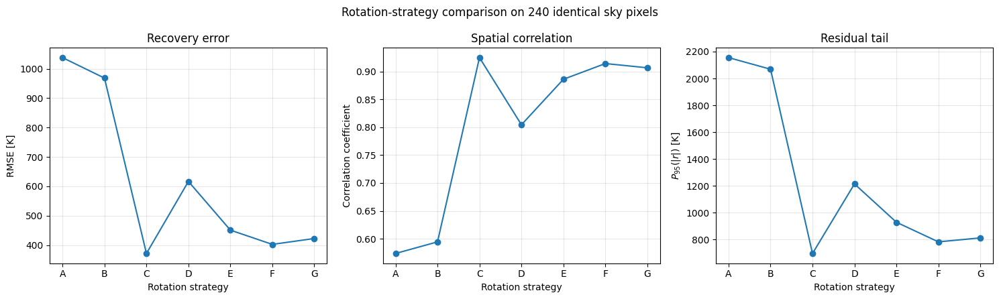

In [80]:
# ============================================================
# ROTATION PLOT 3
# A-G recovery comparison on identical sky pixels
# ============================================================

required_cases = [
    "A", "B", "C", "D", "E", "F", "G"
]

npix_map = hp.nside2npix(
    MAP_NSIDE
)


# ------------------------------------------------------------
# Construct full-sky good-pixel mask for every case
# ------------------------------------------------------------

common_mask = np.ones(
    npix_map,
    dtype=bool,
)


for case_id in required_cases:

    result = rotation_results[
        case_id
    ]

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )

    weighted_hits = np.asarray(
        result["weighted_hits"],
        dtype=float,
    )


    good_local = (
        np.isfinite(weighted_hits)
        & (
            weighted_hits
            > PLOT_HIT_CUT
        )
    )


    good_full = np.zeros(
        npix_map,
        dtype=bool,
    )

    good_full[
        pix[good_local]
    ] = True


    common_mask &= good_full


rotation_common_pix = np.where(
    common_mask
)[0]


print(
    "Common A-G pixels:",
    len(rotation_common_pix)
)


if len(rotation_common_pix) == 0:

    raise RuntimeError(
        "No common pixels found across A-G."
    )


# ------------------------------------------------------------
# Evaluate every result on this same set
# ------------------------------------------------------------

common_metric_rows = []


for case_id in required_cases:

    result = rotation_results[
        case_id
    ]

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )


    lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix
        in enumerate(pix)
    }


    idx = np.asarray(
        [
            lookup[int(full_pix)]
            for full_pix
            in rotation_common_pix
        ],
        dtype=int,
    )


    recovered = np.asarray(
        result["recovered"],
        dtype=float,
    )[idx]


    truth = np.asarray(
        result["truth_patch"],
        dtype=float,
    )[idx]


    residual = (
        recovered
        - truth
    )


    rmse = float(
        np.sqrt(
            np.mean(
                residual**2
            )
        )
    )


    p95_residual = float(
        np.percentile(
            np.abs(residual),
            95,
        )
    )


    if (
        np.std(recovered) > 0
        and np.std(truth) > 0
    ):

        corr = float(
            np.corrcoef(
                recovered,
                truth,
            )[0, 1]
        )

    else:

        corr = np.nan


    common_metric_rows.append({

        "ID":
            case_id,

        "n_common_pix":
            len(rotation_common_pix),

        "rmse":
            rmse,

        "corr":
            corr,

        "p95_abs_residual":
            p95_residual,
    })


rotation_common_metric_df = pd.DataFrame(
    common_metric_rows
)


display(
    rotation_common_metric_df
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15, 4.5),
)


ax[0].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df["rmse"],
    marker="o",
)

ax[0].set_ylabel(
    "RMSE [K]"
)

ax[0].set_xlabel(
    "Rotation strategy"
)

ax[0].set_title(
    "Recovery error"
)

ax[0].grid(
    alpha=0.3
)


ax[1].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df["corr"],
    marker="o",
)

ax[1].set_ylabel(
    "Correlation coefficient"
)

ax[1].set_xlabel(
    "Rotation strategy"
)

ax[1].set_title(
    "Spatial correlation"
)

ax[1].grid(
    alpha=0.3
)


ax[2].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df[
        "p95_abs_residual"
    ],
    marker="o",
)

ax[2].set_ylabel(
    r"$P_{95}(|r|)$ [K]"
)

ax[2].set_xlabel(
    "Rotation strategy"
)

ax[2].set_title(
    "Residual tail"
)

ax[2].grid(
    alpha=0.3
)


plt.suptitle(
    f"Rotation-strategy comparison on "
    f"{len(rotation_common_pix)} identical sky pixels"
)

plt.tight_layout()

plt.show()

In [81]:
# ============================================================
# SELECT REPRESENTATIVE ROTATION CASES FROM THE RESULTS
# ============================================================

rotating_only = (
    rotation_common_metric_df[
        rotation_common_metric_df["ID"] != "A"
    ]
    .copy()
)


# ------------------------------------------------------------
# Best recovery
# ------------------------------------------------------------

BEST_CASE = (
    rotating_only
    .sort_values(
        "rmse"
    )
    .iloc[0]["ID"]
)


# ------------------------------------------------------------
# Representative / middle-performing rotating case
# ------------------------------------------------------------

median_rmse = float(
    rotating_only["rmse"].median()
)

rotating_only[
    "distance_from_median_rmse"
] = np.abs(
    rotating_only["rmse"]
    - median_rmse
)

REPRESENTATIVE_CASE = (
    rotating_only
    .sort_values(
        "distance_from_median_rmse"
    )
    .iloc[0]["ID"]
)


MAP_CASES = [
    "A",
    REPRESENTATIVE_CASE,
    BEST_CASE,
]


print(
    "Cases selected for map figure:"
)

print(
    "Baseline:",
    "A"
)

print(
    "Representative rotating case:",
    REPRESENTATIVE_CASE
)

print(
    "Best common-pixel case:",
    BEST_CASE
)

Cases selected for map figure:
Baseline: A
Representative rotating case: E
Best common-pixel case: C


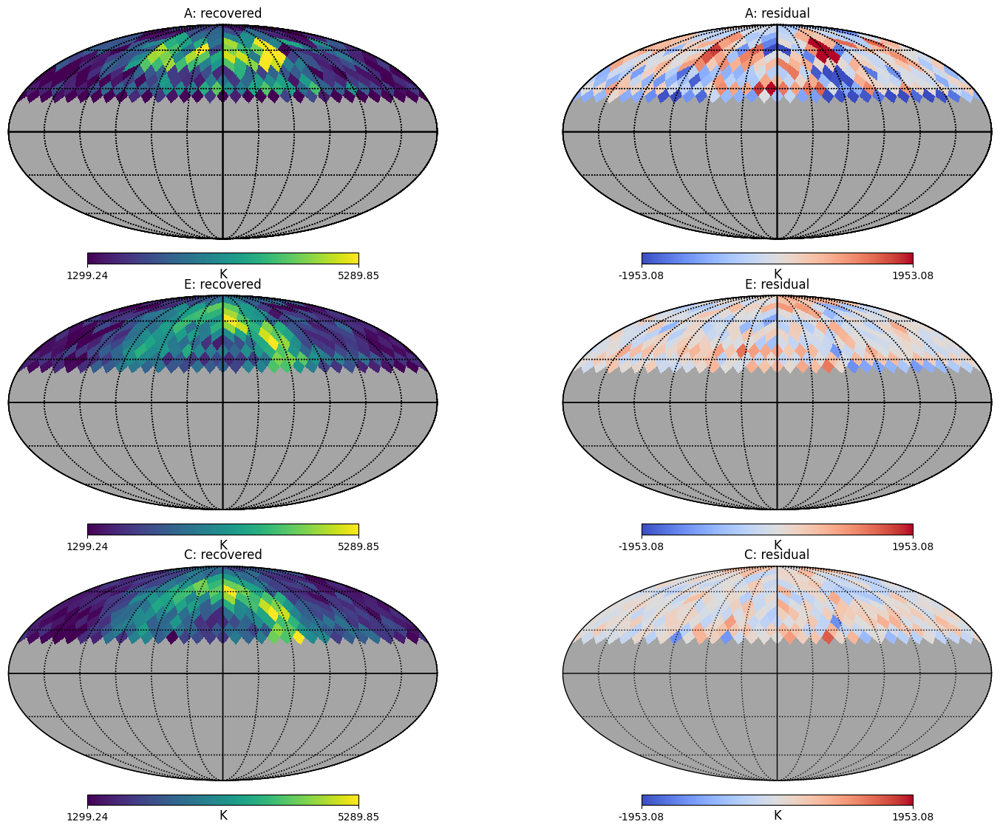

In [82]:
# ============================================================
# ROTATION PLOT 4
# Representative recovered maps and residuals
# ============================================================

def extract_common_case(
    result,
    common_pix,
):

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )

    lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix
        in enumerate(pix)
    }

    idx = np.asarray(
        [
            lookup[int(full_pix)]
            for full_pix
            in common_pix
        ],
        dtype=int,
    )

    return {
        "recovered":
            np.asarray(
                result["recovered"],
                dtype=float,
            )[idx],

        "truth":
            np.asarray(
                result["truth_patch"],
                dtype=float,
            )[idx],
    }


map_plot_data = {}

for case_id in MAP_CASES:

    data = extract_common_case(
        rotation_results[case_id],
        rotation_common_pix,
    )

    data["residual"] = (
        data["recovered"]
        - data["truth"]
    )

    map_plot_data[
        case_id
    ] = data


# ------------------------------------------------------------
# Shared colour scales
# ------------------------------------------------------------

reference_common = (
    map_plot_data["A"]["truth"]
)

vmin = finite_percentile(
    reference_common,
    1,
)

vmax = finite_percentile(
    reference_common,
    99,
)


all_residuals = np.concatenate(
    [
        map_plot_data[case_id][
            "residual"
        ]
        for case_id
        in MAP_CASES
    ]
)


rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig = plt.figure(
    figsize=(15, 11)
)


for row, case_id in enumerate(
    MAP_CASES
):

    recovered_full = patch_to_full(
        map_plot_data[
            case_id
        ]["recovered"],
        rotation_common_pix,
        MAP_NSIDE,
    )


    residual_full = patch_to_full(
        map_plot_data[
            case_id
        ]["residual"],
        rotation_common_pix,
        MAP_NSIDE,
    )


    hp.mollview(
        recovered_full,

        fig=fig.number,

        sub=(
            3,
            2,
            2 * row + 1,
        ),

        title=(
            f"{case_id}: recovered"
        ),

        unit="K",

        min=vmin,
        max=vmax,

        badcolor="0.65",
    )

    hp.graticule()


    hp.mollview(
        residual_full,

        fig=fig.number,

        sub=(
            3,
            2,
            2 * row + 2,
        ),

        title=(
            f"{case_id}: residual"
        ),

        unit="K",

        min=-rmax,
        max=rmax,

        cmap="coolwarm",

        badcolor="0.65",
    )

    hp.graticule()


plt.subplots_adjust(
    left=0.04,
    right=0.96,
    bottom=0.05,
    top=0.97,
    wspace=0.18,
    hspace=0.42,
)

plt.show()

Common pixels across A–G: 240


,ID,n_common_pix,rmse,corr,p95_abs_residual
0,A,240,1037.883442,0.573673,2155.184258
1,B,240,968.341303,0.594488,2068.940415
2,C,240,371.673312,0.924744,696.626568
3,D,240,616.801457,0.804411,1214.622867
4,E,240,451.137753,0.885925,929.197518
5,F,240,402.632406,0.914106,783.244735
6,G,240,422.686344,0.906507,812.819155


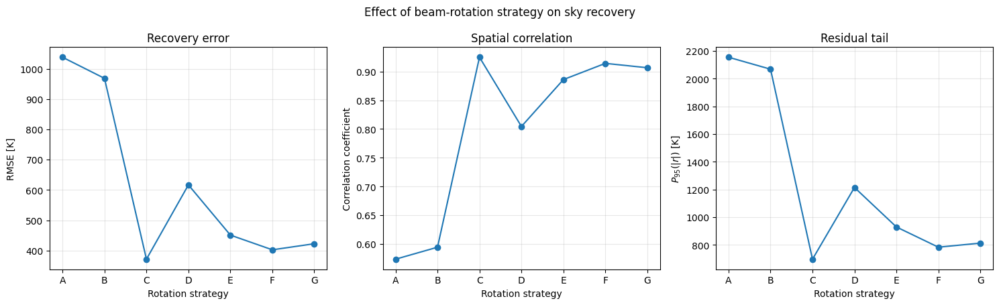

In [83]:
# ============================================================
# MAIN ROTATION COMPARISON PLOT
# A–G recovery metrics on identical common pixels
# ============================================================

required_cases = ["A", "B", "C", "D", "E", "F", "G"]

npix_map = hp.nside2npix(MAP_NSIDE)

# ------------------------------------------------------------
# Find common well-observed pixels across all A–G cases
# ------------------------------------------------------------

common_mask = np.ones(npix_map, dtype=bool)

for case_id in required_cases:

    result = rotation_results[case_id]

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )

    weighted_hits = np.asarray(
        result["weighted_hits"],
        dtype=float,
    )

    good_local = (
        np.isfinite(weighted_hits)
        & (weighted_hits > PLOT_HIT_CUT)
    )

    good_full = np.zeros(
        npix_map,
        dtype=bool,
    )

    good_full[
        pix[good_local]
    ] = True

    common_mask &= good_full


rotation_common_pix = np.where(
    common_mask
)[0]

if rotation_common_pix.size == 0:
    raise RuntimeError(
        "No common well-observed pixels remain across A–G."
    )

print(
    "Common pixels across A–G:",
    rotation_common_pix.size,
)


# ------------------------------------------------------------
# Evaluate all cases on the exact same pixels
# ------------------------------------------------------------

rotation_common_rows = []

for case_id in required_cases:

    result = rotation_results[case_id]

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )

    lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix
        in enumerate(pix)
    }

    idx = np.asarray(
        [
            lookup[int(full_pix)]
            for full_pix
            in rotation_common_pix
        ],
        dtype=int,
    )

    recovered = np.asarray(
        result["recovered"],
        dtype=float,
    )[idx]

    truth = np.asarray(
        result["truth_patch"],
        dtype=float,
    )[idx]

    residual = recovered - truth

    rmse = float(
        np.sqrt(
            np.mean(
                residual**2
            )
        )
    )

    p95_abs_residual = float(
        np.percentile(
            np.abs(residual),
            95,
        )
    )

    corr = np.nan

    if (
        np.std(recovered) > 0
        and np.std(truth) > 0
    ):
        corr = float(
            np.corrcoef(
                recovered,
                truth,
            )[0, 1]
        )

    rotation_common_rows.append({
        "ID": case_id,
        "n_common_pix": int(
            rotation_common_pix.size
        ),
        "rmse": rmse,
        "corr": corr,
        "p95_abs_residual": p95_abs_residual,
    })


rotation_common_metric_df = pd.DataFrame(
    rotation_common_rows
)

display(
    rotation_common_metric_df
)


# ------------------------------------------------------------
# Thesis figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15, 4.6),
)


# RMSE

ax[0].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df["rmse"],
    marker="o",
)

ax[0].set_xlabel(
    "Rotation strategy"
)

ax[0].set_ylabel(
    "RMSE [K]"
)

ax[0].set_title(
    "Recovery error"
)

ax[0].grid(
    alpha=0.3
)


# Correlation

ax[1].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df["corr"],
    marker="o",
)

ax[1].set_xlabel(
    "Rotation strategy"
)

ax[1].set_ylabel(
    "Correlation coefficient"
)

ax[1].set_title(
    "Spatial correlation"
)

ax[1].grid(
    alpha=0.3
)


# Residual tail

ax[2].plot(
    rotation_common_metric_df["ID"],
    rotation_common_metric_df[
        "p95_abs_residual"
    ],
    marker="o",
)

ax[2].set_xlabel(
    "Rotation strategy"
)

ax[2].set_ylabel(
    r"$P_{95}(|r|)$ [K]"
)

ax[2].set_title(
    "Residual tail"
)

ax[2].grid(
    alpha=0.3
)


plt.suptitle(
    "Effect of beam-rotation strategy on sky recovery"
)

plt.tight_layout()

plt.show()

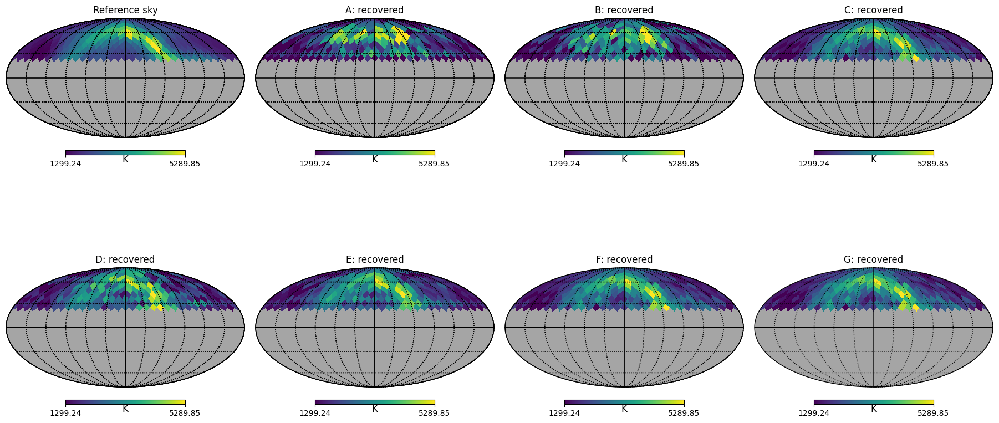

In [84]:
# ============================================================
# A–G RECOVERED-SKY ATLAS
# identical common pixels + common colour scale
# ============================================================

def extract_common_rotation_case(
    result,
    common_pix,
):

    pix = np.asarray(
        result["pix"],
        dtype=int,
    )

    lookup = {
        int(full_pix): local_idx
        for local_idx, full_pix
        in enumerate(pix)
    }

    idx = np.asarray(
        [
            lookup[int(full_pix)]
            for full_pix
            in common_pix
        ],
        dtype=int,
    )

    return {
        "truth":
            np.asarray(
                result["truth_patch"],
                dtype=float,
            )[idx],

        "recovered":
            np.asarray(
                result["recovered"],
                dtype=float,
            )[idx],

        "residual":
            np.asarray(
                result["residual"],
                dtype=float,
            )[idx],

        "unc":
            np.asarray(
                result["unc"],
                dtype=float,
            )[idx],
    }


rotation_common_data = {
    case_id: extract_common_rotation_case(
        rotation_results[case_id],
        rotation_common_pix,
    )
    for case_id in required_cases
}


common_truth = (
    rotation_common_data["A"]["truth"]
)

vmin = finite_percentile(
    common_truth,
    1,
)

vmax = finite_percentile(
    common_truth,
    99,
)


fig = plt.figure(
    figsize=(18, 9)
)


# Reference first
truth_full = patch_to_full(
    common_truth,
    rotation_common_pix,
    MAP_NSIDE,
)

hp.mollview(
    truth_full,

    fig=fig.number,

    sub=(2, 4, 1),

    title="Reference sky",

    unit="K",

    min=vmin,
    max=vmax,

    badcolor="0.65",
)

hp.graticule()


# A–G
for panel, case_id in enumerate(
    required_cases,
    start=2,
):

    recovered_full = patch_to_full(
        rotation_common_data[
            case_id
        ]["recovered"],
        rotation_common_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        recovered_full,

        fig=fig.number,

        sub=(2, 4, panel),

        title=f"{case_id}: recovered",

        unit="K",

        min=vmin,
        max=vmax,

        badcolor="0.65",
    )

    hp.graticule()


plt.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.05,
    top=0.96,
    wspace=0.15,
    hspace=0.32,
)

plt.show()

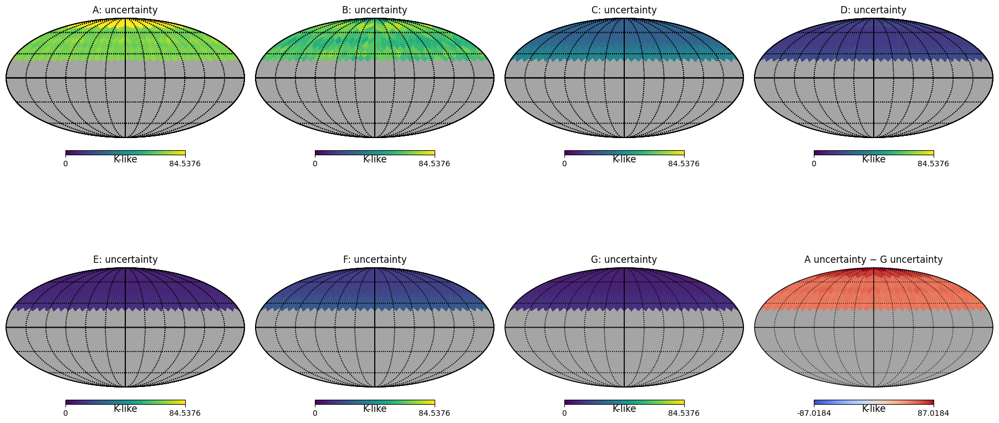

In [85]:
# ============================================================
# A–G UNCERTAINTY ATLAS
# ============================================================

all_uncertainties = np.concatenate(
    [
        rotation_common_data[
            case_id
        ]["unc"]
        for case_id
        in required_cases
    ]
)

umax = finite_percentile(
    all_uncertainties,
    99,
    fallback=1.0,
)


fig = plt.figure(
    figsize=(18, 9)
)


for panel, case_id in enumerate(
    required_cases,
    start=1,
):

    unc_full = patch_to_full(
        rotation_common_data[
            case_id
        ]["unc"],
        rotation_common_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        unc_full,

        fig=fig.number,

        sub=(2, 4, panel),

        title=f"{case_id}: uncertainty",

        unit="K-like",

        min=0,
        max=umax,

        badcolor="0.65",
    )

    hp.graticule()


# Final panel: A -> G uncertainty reduction

uncertainty_reduction = (
    rotation_common_data["A"]["unc"]
    - rotation_common_data["G"]["unc"]
)

reduction_limit = finite_percentile(
    np.abs(
        uncertainty_reduction
    ),
    99,
    fallback=1.0,
)


reduction_full = patch_to_full(
    uncertainty_reduction,
    rotation_common_pix,
    MAP_NSIDE,
)


hp.mollview(
    reduction_full,

    fig=fig.number,

    sub=(2, 4, 8),

    title="A uncertainty − G uncertainty",

    unit="K-like",

    min=-reduction_limit,
    max=reduction_limit,

    cmap="coolwarm",

    badcolor="0.65",
)

hp.graticule()


plt.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.05,
    top=0.96,
    wspace=0.15,
    hspace=0.32,
)

plt.show()

/Users/user/LimTOD/rhino-TODsim/.venv/lib/python3.13/site-packages/healpy/visufunc.py:223: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  f = pylab.figure(fig, figsize=(8.5, 5.4))


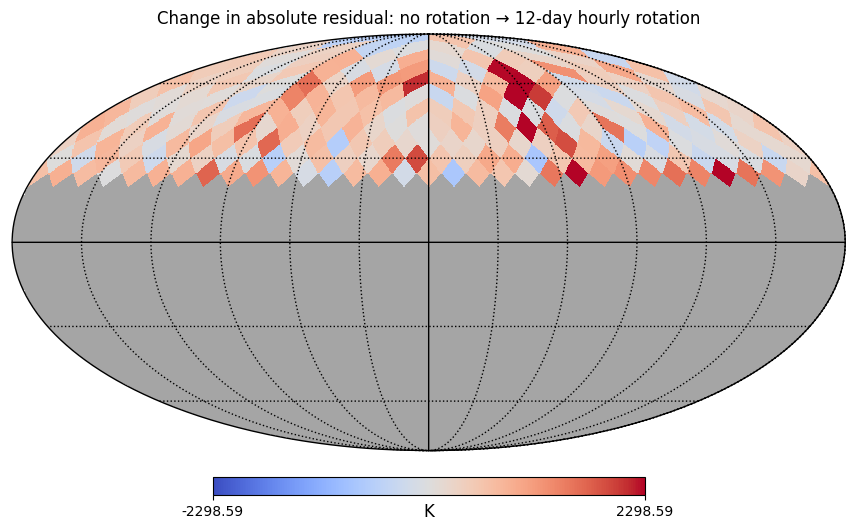

In [86]:
# ============================================================
# RESIDUAL IMPROVEMENT MAP — A versus G
#
# Positive values:
# G has smaller |residual| than A
# ============================================================

residual_A = (
    rotation_common_data["A"][
        "residual"
    ]
)

residual_G = (
    rotation_common_data["G"][
        "residual"
    ]
)


residual_improvement = (
    np.abs(residual_A)
    - np.abs(residual_G)
)


imax = finite_percentile(
    np.abs(
        residual_improvement
    ),
    98,
    fallback=1.0,
)


improvement_full = patch_to_full(
    residual_improvement,
    rotation_common_pix,
    MAP_NSIDE,
)


fig = plt.figure(
    figsize=(9, 5.5)
)


hp.mollview(
    improvement_full,

    fig=fig.number,

    title=(
        "Change in absolute residual: "
        "no rotation → 12-day hourly rotation"
    ),

    unit="K",

    min=-imax,
    max=imax,

    cmap="coolwarm",

    badcolor="0.65",
)

hp.graticule()

plt.show()

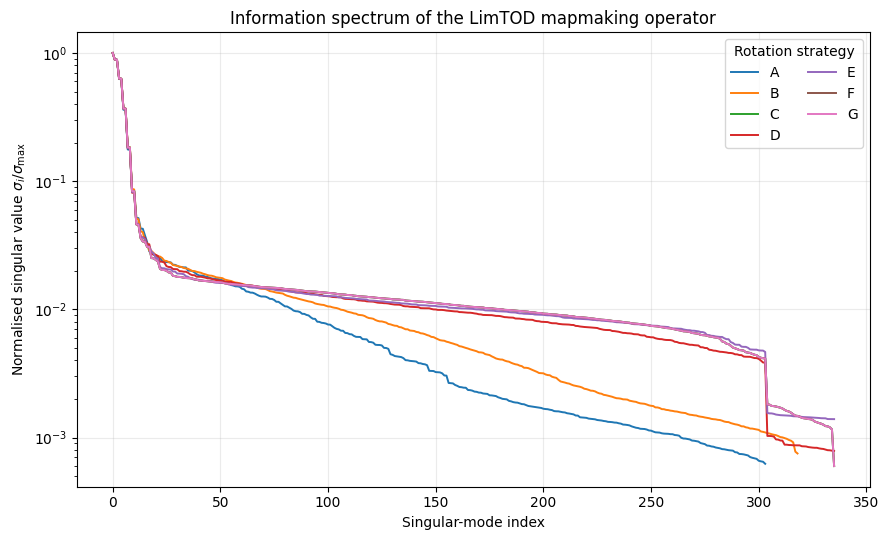

,ID,N_TOD,N_parameters,rank,rank_fraction,largest_singular_value,smallest_singular_value,condition_number
0,A,1440,304,304,1.0,0.070722,0.000044,1602.804590
1,B,1440,319,319,1.0,0.070632,0.000053,1331.610032
2,C,1440,336,336,1.0,0.070438,0.000042,1669.927921
3,D,8640,336,336,1.0,0.070528,0.000055,1272.168759
4,E,17280,336,336,1.0,0.070521,0.000098,718.756759
5,F,4320,336,336,1.0,0.070438,0.000042,1669.927921
6,G,17280,336,336,1.0,0.070438,0.000042,1669.927921


In [87]:
# ============================================================
# FIGURE 5 — A–G operator singular-value spectra
#
# Purpose:
# Test whether the different rotation strategies change the
# information content / conditioning of the LimTOD operator.
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


rotation_operator_rows = []

fig, ax = plt.subplots(
    figsize=(9, 5.5)
)


for case_id in [
    "A", "B", "C", "D", "E", "F", "G"
]:

    # --------------------------------------------------------
    # LimTOD mapmaking operator for this strategy
    # --------------------------------------------------------

    A_case = np.asarray(
        rotation_results[case_id]["A"],
        dtype=float,
    )

    n_tod = A_case.shape[0]
    n_param = A_case.shape[1]


    # --------------------------------------------------------
    # Normalise by sqrt(N_TOD)
    #
    # This removes the trivial overall scaling that comes
    # simply from having more time samples in the multi-day
    # observations.
    # --------------------------------------------------------

    A_information = (
        A_case
        / np.sqrt(float(n_tod))
    )


    # --------------------------------------------------------
    # Singular-value decomposition
    # --------------------------------------------------------

    singular_values = np.linalg.svd(
        A_information,
        compute_uv=False,
    )

    singular_values = np.sort(
        singular_values
    )[::-1]


    # Normalise each spectrum by its strongest singular mode.
    singular_values_norm = (
        singular_values
        / singular_values[0]
    )


    # --------------------------------------------------------
    # Diagnostics
    # --------------------------------------------------------

    rank = int(
        np.linalg.matrix_rank(
            A_information
        )
    )

    rank_fraction = (
        rank / n_param
    )


    smallest_sv = float(
        singular_values[-1]
    )

    largest_sv = float(
        singular_values[0]
    )


    if smallest_sv > 0:

        condition_number = (
            largest_sv
            / smallest_sv
        )

    else:

        condition_number = np.inf


    rotation_operator_rows.append({

        "ID":
            case_id,

        "N_TOD":
            n_tod,

        "N_parameters":
            n_param,

        "rank":
            rank,

        "rank_fraction":
            rank_fraction,

        "largest_singular_value":
            largest_sv,

        "smallest_singular_value":
            smallest_sv,

        "condition_number":
            condition_number,
    })


    # --------------------------------------------------------
    # Plot spectrum
    # --------------------------------------------------------

    ax.semilogy(
        np.arange(
            singular_values_norm.size
        ),
        singular_values_norm,
        lw=1.4,
        label=case_id,
    )


ax.set_xlabel(
    "Singular-mode index"
)

ax.set_ylabel(
    r"Normalised singular value "
    r"$\sigma_i/\sigma_{\rm max}$"
)

ax.set_title(
    "Information spectrum of the LimTOD mapmaking operator"
)

ax.grid(
    alpha=0.25
)

ax.legend(
    title="Rotation strategy",
    ncol=2,
)

plt.tight_layout()

plt.show()


# ------------------------------------------------------------
# Table of operator diagnostics
# ------------------------------------------------------------

rotation_operator_df = pd.DataFrame(
    rotation_operator_rows
)

display(
    rotation_operator_df
)

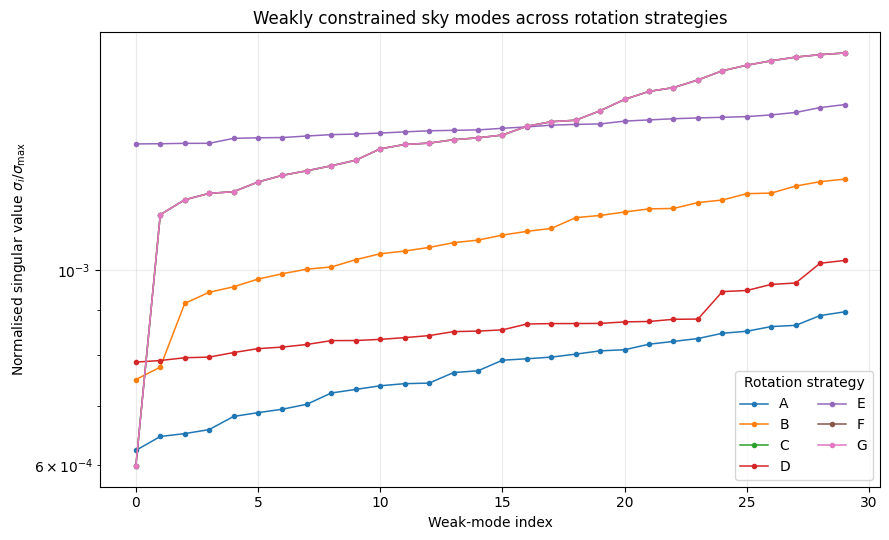

In [88]:
# ============================================================
# FIGURE 5b — weakest constrained modes
# ============================================================

N_WEAKEST = 30

fig, ax = plt.subplots(
    figsize=(9, 5.5)
)


for case_id in [
    "A", "B", "C", "D", "E", "F", "G"
]:

    A_case = np.asarray(
        rotation_results[case_id]["A"],
        dtype=float,
    )


    A_information = (
        A_case
        / np.sqrt(
            float(A_case.shape[0])
        )
    )


    singular_values = np.linalg.svd(
        A_information,
        compute_uv=False,
    )


    # Sort ascending:
    # weakest modes appear first.
    singular_values = np.sort(
        singular_values
    )


    # Normalise to the strongest mode.
    singular_values_norm = (
        singular_values
        / np.max(
            singular_values
        )
    )


    n_show = min(
        N_WEAKEST,
        singular_values_norm.size,
    )


    weak_tail = (
        singular_values_norm[
            :n_show
        ]
    )


    ax.semilogy(
        np.arange(n_show),
        weak_tail,
        marker="o",
        ms=3,
        lw=1.1,
        label=case_id,
    )


ax.set_xlabel(
    "Weak-mode index"
)

ax.set_ylabel(
    r"Normalised singular value "
    r"$\sigma_i/\sigma_{\rm max}$"
)

ax.set_title(
    "Weakly constrained sky modes across rotation strategies"
)

ax.grid(
    alpha=0.25
)

ax.legend(
    title="Rotation strategy",
    ncol=2,
)

plt.tight_layout()

plt.show()

,ID,N_TOD,N_parameters,rank,rank_fraction,largest_singular_value,smallest_singular_value,condition_number
0,A,1440,304,304,1.0,0.070722,0.000044,1602.804590
1,B,1440,319,319,1.0,0.070632,0.000053,1331.610032
2,C,1440,336,336,1.0,0.070438,0.000042,1669.927921
3,D,8640,336,336,1.0,0.070528,0.000055,1272.168759
4,E,17280,336,336,1.0,0.070521,0.000098,718.756759
5,F,4320,336,336,1.0,0.070438,0.000042,1669.927921
6,G,17280,336,336,1.0,0.070438,0.000042,1669.927921


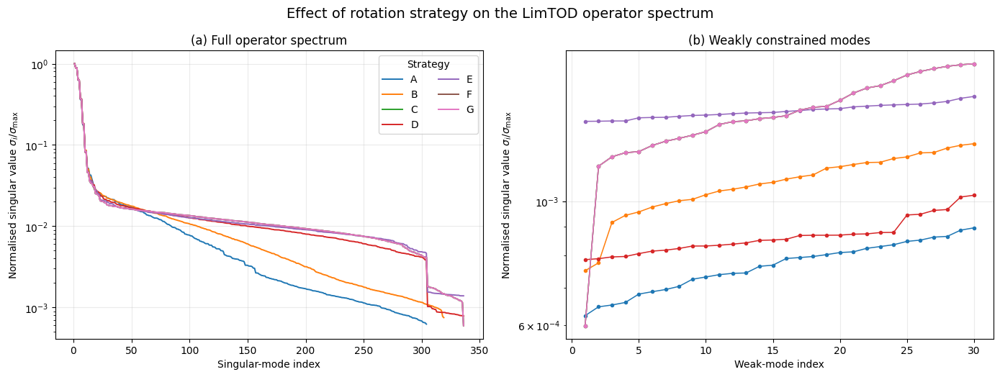

In [89]:
# ============================================================
# OPERATOR DIAGNOSTIC
# A–G full singular-value spectrum + weak-mode tail
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

CASES = ["A", "B", "C", "D", "E", "F", "G"]
N_WEAKEST = 30

rotation_operator_rows = []
rotation_spectra = {}


# ------------------------------------------------------------
# 1. Calculate spectra once
# ------------------------------------------------------------

for case_id in CASES:

    A_case = np.asarray(
        rotation_results[case_id]["A"],
        dtype=float,
    )

    n_tod, n_param = A_case.shape

    # Remove trivial scaling associated with number of TOD samples
    A_information = (
        A_case / np.sqrt(float(n_tod))
    )

    s = np.linalg.svd(
        A_information,
        compute_uv=False,
    )

    # Descending: strongest -> weakest
    s = np.sort(s)[::-1]

    # Shape/conditioning comparison
    s_norm = s / s[0]

    rotation_spectra[case_id] = {
        "s": s,
        "s_norm": s_norm,
    }

    # Numerical rank using NumPy's standard SVD-based tolerance
    rank = int(
        np.linalg.matrix_rank(A_information)
    )

    # Only quote the naive condition number when the matrix is
    # numerically full column rank.
    if rank == n_param and s[-1] > 0:
        condition_number = float(
            s[0] / s[-1]
        )
    else:
        condition_number = np.inf

    rotation_operator_rows.append({
        "ID": case_id,
        "N_TOD": n_tod,
        "N_parameters": n_param,
        "rank": rank,
        "rank_fraction": rank / n_param,
        "largest_singular_value": float(s[0]),
        "smallest_singular_value": float(s[-1]),
        "condition_number": condition_number,
    })


rotation_operator_df = pd.DataFrame(
    rotation_operator_rows
)

display(rotation_operator_df)


# ------------------------------------------------------------
# 2. Combined thesis figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    2,
    figsize=(14, 5.3),
)


# ============================================================
# LEFT — complete spectrum
# ============================================================

for case_id in CASES:

    s_norm = rotation_spectra[
        case_id
    ]["s_norm"]

    ax[0].semilogy(
        np.arange(1, len(s_norm) + 1),
        s_norm,
        lw=1.4,
        label=case_id,
    )


ax[0].set_xlabel(
    "Singular-mode index"
)

ax[0].set_ylabel(
    r"Normalised singular value "
    r"$\sigma_i/\sigma_{\max}$"
)

ax[0].set_title(
    "(a) Full operator spectrum"
)

ax[0].grid(
    alpha=0.25
)

ax[0].legend(
    title="Strategy",
    ncol=2,
)


# ============================================================
# RIGHT — weakest modes
# ============================================================

for case_id in CASES:

    s_norm = rotation_spectra[
        case_id
    ]["s_norm"]

    n_show = min(
        N_WEAKEST,
        len(s_norm),
    )

    # Last N elements of descending spectrum are weakest.
    # Reverse them so x=1 is the weakest mode.
    weak = s_norm[-n_show:][::-1]

    ax[1].semilogy(
        np.arange(1, n_show + 1),
        weak,
        marker="o",
        ms=3,
        lw=1.1,
        label=case_id,
    )


ax[1].set_xlabel(
    "Weak-mode index"
)

ax[1].set_ylabel(
    r"Normalised singular value "
    r"$\sigma_i/\sigma_{\max}$"
)

ax[1].set_title(
    "(b) Weakly constrained modes"
)

ax[1].grid(
    alpha=0.25
)


plt.suptitle(
    "Effect of rotation strategy on the LimTOD operator spectrum",
    fontsize=14,
)

plt.tight_layout()

plt.show()

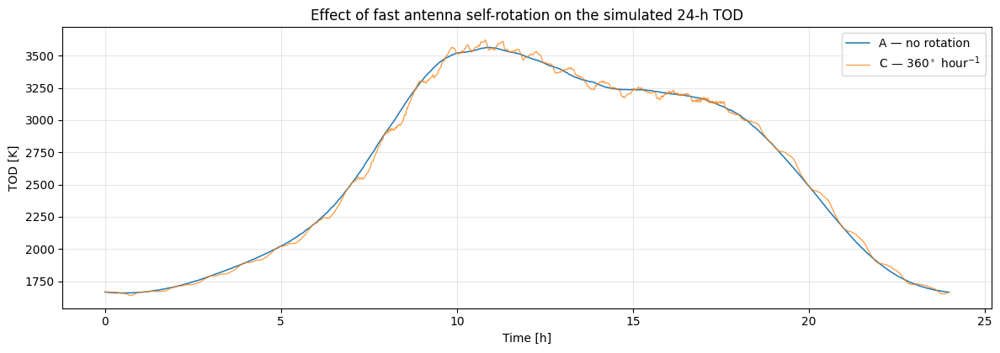

In [90]:
# ============================================================
# ROTATION TOD ILLUSTRATION
# A: no rotation vs C: 360 deg/hour
# same 24-hour duration
# ============================================================

tod_A = np.asarray(
    rotation_results["A"]["tod"],
    dtype=float,
)

tod_C = np.asarray(
    rotation_results["C"]["tod"],
    dtype=float,
)

time_A_h = np.asarray(
    rotation_results["A"]["scan"]["time_h"],
    dtype=float,
)

time_C_h = np.asarray(
    rotation_results["C"]["scan"]["time_h"],
    dtype=float,
)

# Sanity check: this comparison is deliberately same-duration.
if len(tod_A) != len(tod_C):
    raise RuntimeError(
        "A and C do not contain the same number of TOD samples. "
        "This figure is intended to compare equal-duration 24 h observations."
    )

if not np.allclose(time_A_h, time_C_h):
    raise RuntimeError(
        "A and C do not share the same time sampling."
    )


fig, ax = plt.subplots(
    figsize=(12, 4.3)
)

ax.plot(
    time_A_h,
    tod_A,
    lw=1.1,
    label="A — no rotation",
)

ax.plot(
    time_C_h,
    tod_C,
    lw=0.9,
    alpha=0.8,
    label=r"C — $360^\circ$ hour$^{-1}$",
)

ax.set_xlabel(
    "Time [h]"
)

ax.set_ylabel(
    "TOD [K]"
)

ax.set_title(
    "Effect of fast antenna self-rotation on the simulated 24-h TOD"
)

ax.grid(
    alpha=0.3
)

ax.legend()

plt.tight_layout()
plt.show()

,case,sigma_prior_K,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,abs_sigma_5000K,5000.0,240,1077.673527,94.718526,1073.502973,0.506963,831.279841,2171.981415
1,abs_sigma_2000K,2000.0,240,1066.950628,93.793849,1062.820002,0.512060,822.079603,2150.597994
2,abs_sigma_1000K,1000.0,240,1034.773202,91.020135,1030.762298,0.527863,797.058505,2023.954331
3,abs_sigma_500K,500.0,240,954.977615,84.058455,951.270951,0.570421,738.761884,1813.024646
4,abs_sigma_200K,200.0,240,783.248244,68.478879,780.248970,0.675823,605.442659,1560.086340
5,abs_sigma_100K,100.0,240,623.429431,54.172411,621.071336,0.779415,475.310455,1287.154878


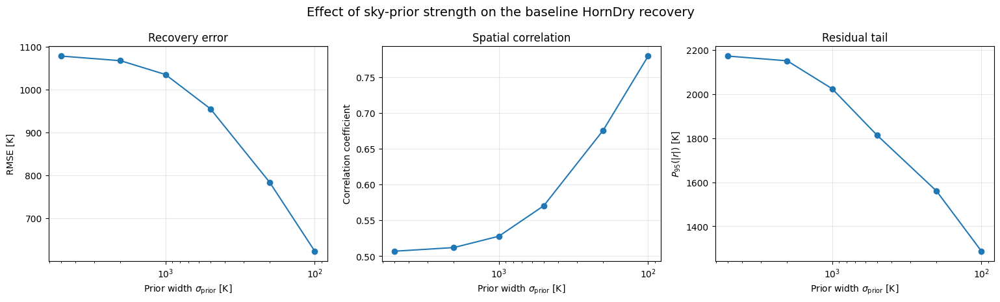

In [95]:
# ============================================================
# PRIOR RESULT 1
# Absolute sky-prior strength versus recovery quality
# Uses the EXISTING prior_results from this notebook
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# Truth/reference used by the prior experiment itself
# ------------------------------------------------------------

prior_truth = np.asarray(
    prior_mean,
    dtype=float,
)


# ------------------------------------------------------------
# Extract ONLY the absolute-prior ladder
# ------------------------------------------------------------

absolute_prior_rows = []

for case_name, result in prior_results.items():

    if result["kind"] != "absolute_prior":
        continue

    sigma_prior_K = float(
        result["prior_strength_value"]
    )

    recovered = np.asarray(
        result["map"],
        dtype=float,
    )

    metrics = map_metrics(
        recovered,
        prior_truth,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    )

    absolute_prior_rows.append({
        "case": case_name,
        "sigma_prior_K": sigma_prior_K,
        **metrics,
    })


absolute_prior_df = (
    pd.DataFrame(absolute_prior_rows)
    .sort_values(
        "sigma_prior_K",
        ascending=False,
    )
    .reset_index(drop=True)
)

display(absolute_prior_df)


# ------------------------------------------------------------
# Plot
#
# Larger sigma = weaker prior
# Smaller sigma = stronger prior
#
# Invert x axis so left -> right means increasing constraint.
# ------------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15.5, 4.7),
)


# RMSE
ax[0].plot(
    absolute_prior_df["sigma_prior_K"],
    absolute_prior_df["rmse"],
    marker="o",
)

ax[0].set_xscale("log")
ax[0].invert_xaxis()

ax[0].set_xlabel(
    r"Prior width $\sigma_{\rm prior}$ [K]"
)

ax[0].set_ylabel(
    "RMSE [K]"
)

ax[0].set_title(
    "Recovery error"
)

ax[0].grid(
    alpha=0.3
)


# Correlation
ax[1].plot(
    absolute_prior_df["sigma_prior_K"],
    absolute_prior_df["corr"],
    marker="o",
)

ax[1].set_xscale("log")
ax[1].invert_xaxis()

ax[1].set_xlabel(
    r"Prior width $\sigma_{\rm prior}$ [K]"
)

ax[1].set_ylabel(
    "Correlation coefficient"
)

ax[1].set_title(
    "Spatial correlation"
)

ax[1].grid(
    alpha=0.3
)


# Residual tail
ax[2].plot(
    absolute_prior_df["sigma_prior_K"],
    absolute_prior_df["p95_abs_residual"],
    marker="o",
)

ax[2].set_xscale("log")
ax[2].invert_xaxis()

ax[2].set_xlabel(
    r"Prior width $\sigma_{\rm prior}$ [K]"
)

ax[2].set_ylabel(
    r"$P_{95}(|r|)$ [K]"
)

ax[2].set_title(
    "Residual tail"
)

ax[2].grid(
    alpha=0.3
)


plt.suptitle(
    "Effect of sky-prior strength on the baseline HornDry recovery",
    fontsize=14,
)

plt.tight_layout()
plt.show()

Recovered range: 1296.4258110692056 6007.4839646935725
Residual range: -2247.850967492805 2247.850967492805
Uncertainty range: 0 366.48697256080914


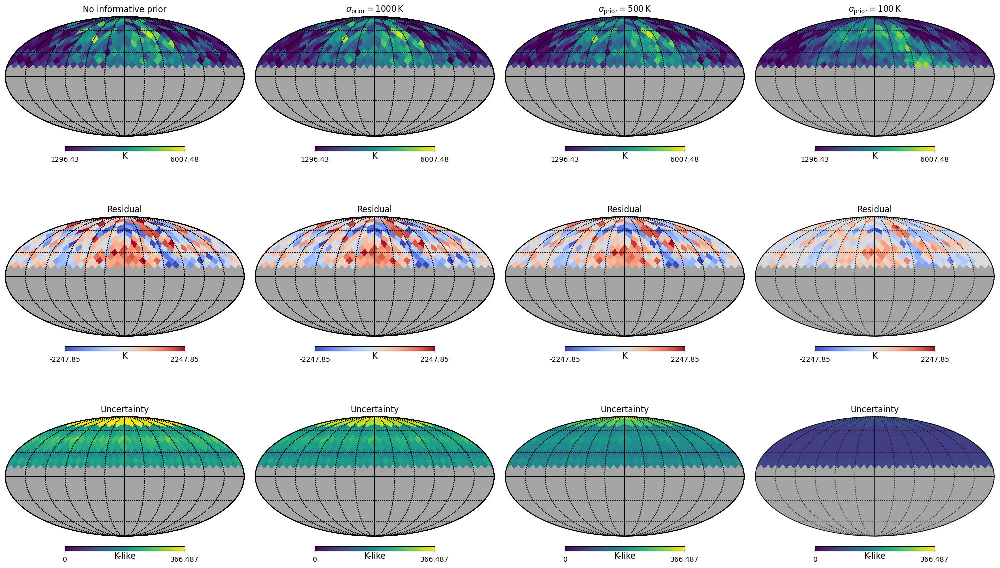

In [96]:
# ============================================================
# PRIOR RESULT 2
#
# Representative prior progression
#
# Columns:
#   no prior | 1000 K | 500 K | 100 K
#
# Rows:
#   recovered
#   residual
#   uncertainty
# ============================================================

representative_prior_cases = [
    (
        "No informative prior",
        "no_prior_reg1e-8",
    ),
    (
        r"$\sigma_{\rm prior}=1000\,{\rm K}$",
        "abs_sigma_1000K",
    ),
    (
        r"$\sigma_{\rm prior}=500\,{\rm K}$",
        "abs_sigma_500K",
    ),
    (
        r"$\sigma_{\rm prior}=100\,{\rm K}$",
        "abs_sigma_100K",
    ),
]


# ------------------------------------------------------------
# Validate cases before plotting
# ------------------------------------------------------------

missing_cases = [
    case_name
    for _, case_name in representative_prior_cases
    if case_name not in prior_results
]

if missing_cases:
    raise RuntimeError(
        f"Missing prior cases: {missing_cases}"
    )


# ------------------------------------------------------------
# Gather data
# ------------------------------------------------------------

prior_truth = np.asarray(
    prior_mean,
    dtype=float,
)

prior_plot_data = {}


for label, case_name in representative_prior_cases:

    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    uncertainty = np.asarray(
        prior_results[case_name]["unc"],
        dtype=float,
    )

    residual = (
        recovered
        - prior_truth
    )

    prior_plot_data[case_name] = {
        "label": label,
        "recovered": recovered,
        "residual": residual,
        "uncertainty": uncertainty,
    }


# ------------------------------------------------------------
# Shared recovered-map colour scale
# ------------------------------------------------------------

vmin = finite_percentile(
    prior_truth,
    1,
)

vmax = finite_percentile(
    prior_truth,
    99,
)


# ------------------------------------------------------------
# Shared residual scale
# ------------------------------------------------------------

all_residuals = np.concatenate([
    data["residual"]
    for data in prior_plot_data.values()
])

rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)


# ------------------------------------------------------------
# Shared uncertainty scale
# ------------------------------------------------------------

all_uncertainties = np.concatenate([
    data["uncertainty"]
    for data in prior_plot_data.values()
])

umax = finite_percentile(
    all_uncertainties,
    99,
    fallback=1.0,
)


print(
    "Recovered range:",
    vmin,
    vmax,
)

print(
    "Residual range:",
    -rmax,
    rmax,
)

print(
    "Uncertainty range:",
    0,
    umax,
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig = plt.figure(
    figsize=(20, 12)
)


for col, (
    panel_label,
    case_name,
) in enumerate(
    representative_prior_cases
):

    data = prior_plot_data[
        case_name
    ]


    recovered_full = patch_to_full(
        data["recovered"],
        baseline_pix,
        MAP_NSIDE,
    )

    residual_full = patch_to_full(
        data["residual"],
        baseline_pix,
        MAP_NSIDE,
    )

    uncertainty_full = patch_to_full(
        data["uncertainty"],
        baseline_pix,
        MAP_NSIDE,
    )


    # ========================================================
    # ROW 1 — recovered
    # ========================================================

    hp.mollview(
        recovered_full,

        fig=fig.number,

        sub=(
            3,
            4,
            col + 1,
        ),

        title=panel_label,

        unit="K",

        min=vmin,
        max=vmax,

        badcolor="0.65",
    )

    hp.graticule()


    # ========================================================
    # ROW 2 — residual
    # ========================================================

    hp.mollview(
        residual_full,

        fig=fig.number,

        sub=(
            3,
            4,
            col + 5,
        ),

        title="Residual",

        unit="K",

        min=-rmax,
        max=rmax,

        cmap="coolwarm",

        badcolor="0.65",
    )

    hp.graticule()


    # ========================================================
    # ROW 3 — uncertainty
    # ========================================================

    hp.mollview(
        uncertainty_full,

        fig=fig.number,

        sub=(
            3,
            4,
            col + 9,
        ),

        title="Uncertainty",

        unit="K-like",

        min=0,
        max=umax,

        badcolor="0.65",
    )

    hp.graticule()


# Don't use tight_layout with healpy.
plt.subplots_adjust(
    left=0.02,
    right=0.98,
    bottom=0.04,
    top=0.97,
    wspace=0.10,
    hspace=0.38,
)

plt.show()

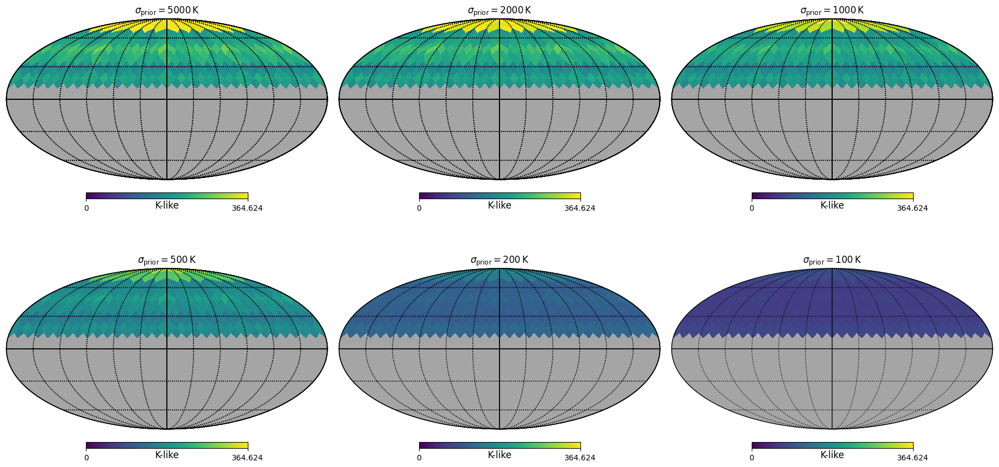

In [97]:
# ============================================================
# PRIOR RESULT 3
# Full uncertainty progression across ALL absolute priors
# ============================================================

absolute_cases = [
    (
        r"$\sigma_{\rm prior}=5000\,{\rm K}$",
        "abs_sigma_5000K",
    ),
    (
        r"$\sigma_{\rm prior}=2000\,{\rm K}$",
        "abs_sigma_2000K",
    ),
    (
        r"$\sigma_{\rm prior}=1000\,{\rm K}$",
        "abs_sigma_1000K",
    ),
    (
        r"$\sigma_{\rm prior}=500\,{\rm K}$",
        "abs_sigma_500K",
    ),
    (
        r"$\sigma_{\rm prior}=200\,{\rm K}$",
        "abs_sigma_200K",
    ),
    (
        r"$\sigma_{\rm prior}=100\,{\rm K}$",
        "abs_sigma_100K",
    ),
]


all_unc = np.concatenate([
    np.asarray(
        prior_results[case_name]["unc"],
        dtype=float,
    )
    for _, case_name in absolute_cases
])

umax = finite_percentile(
    all_unc,
    99,
    fallback=1.0,
)


fig = plt.figure(
    figsize=(18, 9)
)


for panel, (
    label,
    case_name,
) in enumerate(
    absolute_cases,
    start=1,
):

    uncertainty = np.asarray(
        prior_results[case_name]["unc"],
        dtype=float,
    )

    uncertainty_full = patch_to_full(
        uncertainty,
        baseline_pix,
        MAP_NSIDE,
    )

    hp.mollview(
        uncertainty_full,

        fig=fig.number,

        sub=(
            2,
            3,
            panel,
        ),

        title=label,

        unit="K-like",

        min=0,
        max=umax,

        badcolor="0.65",
    )

    hp.graticule()


plt.subplots_adjust(
    left=0.025,
    right=0.975,
    bottom=0.05,
    top=0.97,
    wspace=0.12,
    hspace=0.38,
)

plt.show()

,label,n_pix,rmse,bias,std,corr,mae,p95_abs_residual
0,No informative prior,240,1079.823198,94.904036,1075.644627,0.505951,833.179646,2175.360100
1,Absolute: $\sigma=1000$ K,240,1034.773202,91.020135,1030.762298,0.527863,797.058505,2023.954331
2,Absolute: $\sigma=500$ K,240,954.977615,84.058455,951.270951,0.570421,738.761884,1813.024646
3,"Relative: $0.5\,T_{\rm prior}$",240,1044.877438,90.416712,1040.958058,0.520974,802.532466,2057.892055
4,"Relative: $0.3\,T_{\rm prior}$",240,1003.237545,84.252323,999.693512,0.540168,768.116309,1935.073803


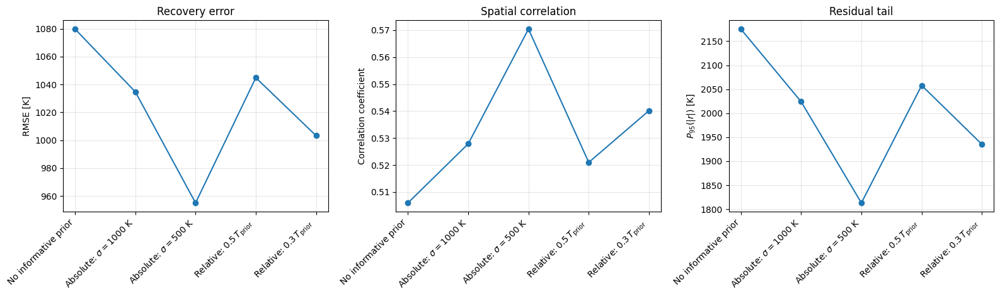

In [98]:
# ============================================================
# OPTIONAL PRIOR RESULT
# Absolute versus relative prior prescriptions
# ============================================================

comparison_cases = [
    (
        "No informative prior",
        "no_prior_reg1e-8",
    ),
    (
        r"Absolute: $\sigma=1000$ K",
        "abs_sigma_1000K",
    ),
    (
        r"Absolute: $\sigma=500$ K",
        "abs_sigma_500K",
    ),
    (
        r"Relative: $0.5\,T_{\rm prior}$",
        "relative_0.5",
    ),
    (
        r"Relative: $0.3\,T_{\rm prior}$",
        "relative_0.3",
    ),
]


rows = []

for label, case_name in comparison_cases:

    recovered = np.asarray(
        prior_results[case_name]["map"],
        dtype=float,
    )

    met = map_metrics(
        recovered,
        prior_mean,
        baseline_weighted_hits,
        cut=PLOT_HIT_CUT,
    )

    rows.append({
        "label": label,
        **met,
    })


prior_type_df = pd.DataFrame(
    rows
)

display(prior_type_df)


x = np.arange(
    len(prior_type_df)
)

fig, ax = plt.subplots(
    1,
    3,
    figsize=(16, 4.8),
)


ax[0].plot(
    x,
    prior_type_df["rmse"],
    marker="o",
)

ax[1].plot(
    x,
    prior_type_df["corr"],
    marker="o",
)

ax[2].plot(
    x,
    prior_type_df["p95_abs_residual"],
    marker="o",
)


for a in ax:

    a.set_xticks(x)

    a.set_xticklabels(
        prior_type_df["label"],
        rotation=45,
        ha="right",
    )

    a.grid(
        alpha=0.3
    )


ax[0].set_ylabel("RMSE [K]")
ax[0].set_title("Recovery error")

ax[1].set_ylabel("Correlation coefficient")
ax[1].set_title("Spatial correlation")

ax[2].set_ylabel(
    r"$P_{95}(|r|)$ [K]"
)
ax[2].set_title("Residual tail")


plt.tight_layout()
plt.show()

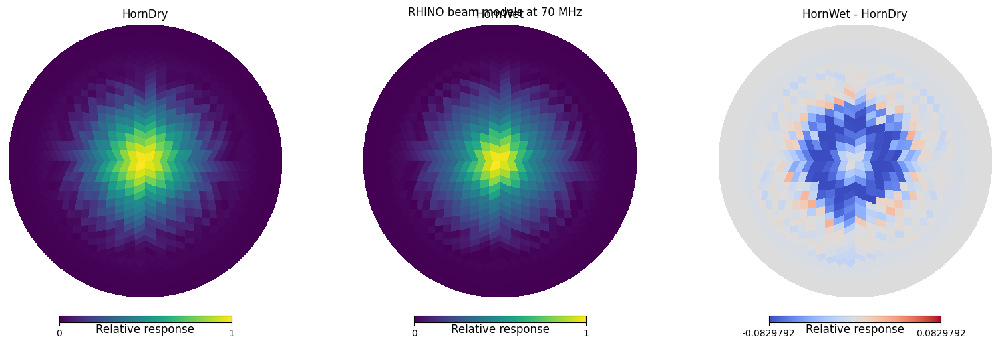

In [99]:
# ============================================================
# BEAM MISMATCH FIGURE 1
# HornDry | HornWet | Wet - Dry
# ============================================================

beam_difference = horn_wet - horn_dry

dmax = finite_percentile(
    np.abs(beam_difference),
    99,
    fallback=1.0,
)

FACE_ON_ROT = [0.0, 90.0, 0.0]

fig = plt.figure(figsize=(16, 5))


hp.orthview(
    horn_dry,
    fig=fig.number,
    sub=(1, 3, 1),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornDry",
    unit="Relative response",
    min=0,
    max=1,
)


hp.orthview(
    horn_wet,
    fig=fig.number,
    sub=(1, 3, 2),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet",
    unit="Relative response",
    min=0,
    max=1,
)


hp.orthview(
    beam_difference,
    fig=fig.number,
    sub=(1, 3, 3),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet - HornDry",
    unit="Relative response",
    min=-dmax,
    max=dmax,
    cmap="coolwarm",
)


plt.suptitle(
    f"RHINO beam models at {FREQ_MHZ:g} MHz",
    y=1.03,
)

plt.show()

Common pixels: 240
Recovered range: 1289.2327230640515 5414.863596620631
Residual range: -2706.7848545455395 2706.7848545455395


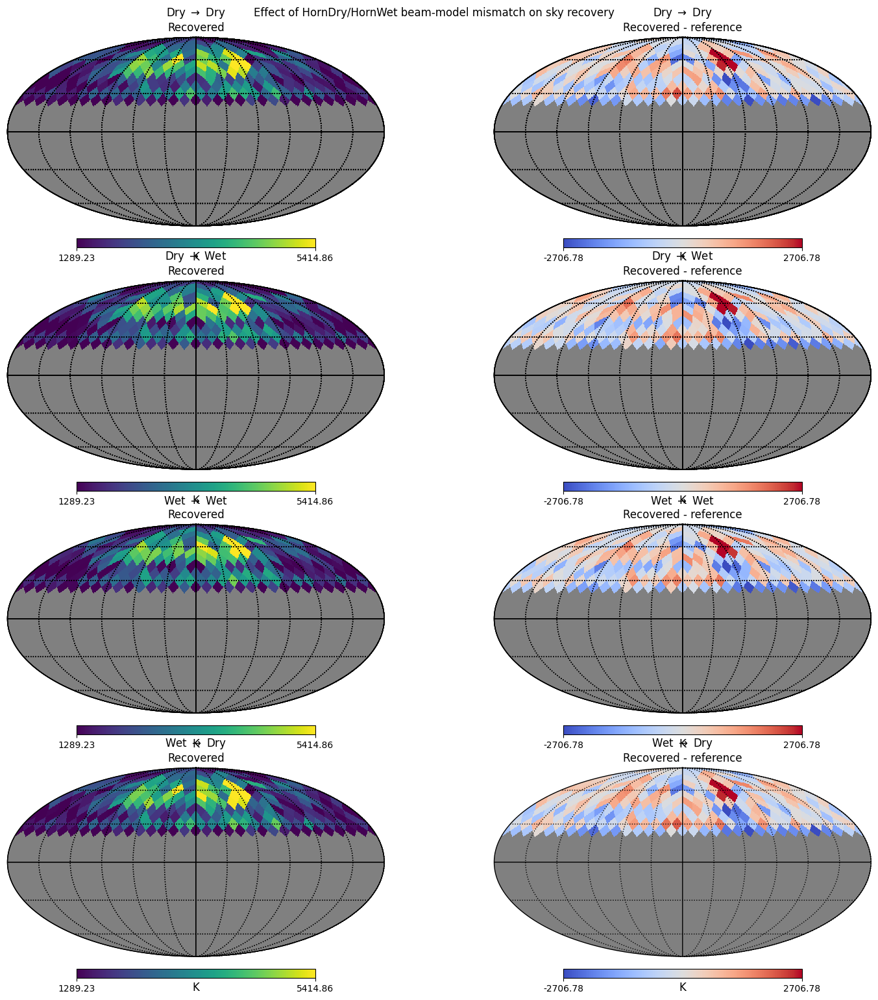

In [100]:
# ============================================================
# BEAM MISMATCH FIGURE 2
#
# Four-case mismatch recovery atlas
# NO ROTATION
#
# Rows:
# D -> D
# D -> W
# W -> W
# W -> D
#
# Columns:
# Recovered | Residual
# ============================================================

MISMATCH_SCAN = "A_no_rotation"

case_order = [
    "D_to_D",
    "D_to_W",
    "W_to_W",
    "W_to_D",
]

case_labels = {
    "D_to_D": r"Dry $\rightarrow$ Dry",
    "D_to_W": r"Dry $\rightarrow$ Wet",
    "W_to_W": r"Wet $\rightarrow$ Wet",
    "W_to_D": r"Wet $\rightarrow$ Dry",
}


# ------------------------------------------------------------
# Extract all four cases on EXACTLY the same pixels
# ------------------------------------------------------------

mismatch_plot_data = {}

for case_name in case_order:

    result = (
        beam_mismatch_results_by_scan[
            MISMATCH_SCAN
        ][case_name]
    )

    mismatch_plot_data[case_name] = (
        extract_result_on_full_pixels(
            result,
            beam_mismatch_common_pix,
        )
    )


# ------------------------------------------------------------
# Common recovered-map scale
# ------------------------------------------------------------

all_truth = np.concatenate([
    data["truth"]
    for data in mismatch_plot_data.values()
])

vmin = finite_percentile(
    all_truth,
    1,
)

vmax = finite_percentile(
    all_truth,
    99,
)


# ------------------------------------------------------------
# Common residual scale
# ------------------------------------------------------------

all_residuals = np.concatenate([
    data["residual"]
    for data in mismatch_plot_data.values()
])

rmax = finite_percentile(
    np.abs(all_residuals),
    98,
    fallback=1.0,
)


print(
    "Common pixels:",
    beam_mismatch_common_pix.size
)

print(
    "Recovered range:",
    vmin,
    vmax
)

print(
    "Residual range:",
    -rmax,
    rmax
)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig = plt.figure(
    figsize=(15, 15)
)


for row, case_name in enumerate(
    case_order
):

    data = mismatch_plot_data[
        case_name
    ]


    recovered_full = patch_to_full(
        data["recovered"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )


    residual_full = patch_to_full(
        data["residual"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )


    # --------------------------------------------------------
    # Recovered
    # --------------------------------------------------------

    hp.mollview(
        recovered_full,

        fig=fig.number,

        sub=(4, 2, 2 * row + 1),

        title=(
            f"{case_labels[case_name]}"
            "\nRecovered"
        ),

        unit="K",

        min=vmin,
        max=vmax,

        badcolor="gray",
    )

    hp.graticule()


    # --------------------------------------------------------
    # Residual
    # --------------------------------------------------------

    hp.mollview(
        residual_full,

        fig=fig.number,

        sub=(4, 2, 2 * row + 2),

        title=(
            f"{case_labels[case_name]}"
            "\nRecovered - reference"
        ),

        unit="K",

        min=-rmax,
        max=rmax,

        cmap="coolwarm",

        badcolor="gray",
    )

    hp.graticule()


plt.suptitle(
    "Effect of HornDry/HornWet beam-model mismatch on sky recovery",
    y=1.01,
)

plt.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.03,
    top=0.96,
    wspace=0.10,
    hspace=0.32,
)

plt.show()

In [101]:
# ============================================================
# MISMATCH SECTION — PRE-FLIGHT CHECK
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp

G_SCAN = "G_12day_hourly_rotation"
A_SCAN = "A_no_rotation"

MISMATCH_CASES = [
    "D_to_D",
    "D_to_W",
    "W_to_W",
    "W_to_D",
]

MISMATCH_LABELS = {
    "D_to_D": r"Dry $\rightarrow$ Dry",
    "D_to_W": r"Dry $\rightarrow$ Wet",
    "W_to_W": r"Wet $\rightarrow$ Wet",
    "W_to_D": r"Wet $\rightarrow$ Dry",
}

required = [
    "beam_mismatch_results_by_scan",
    "beam_mismatch_common_pix",
    "extract_result_on_full_pixels",
    "patch_to_full",
    "finite_percentile",
    "MAP_NSIDE",
]

missing = [x for x in required if x not in globals()]

if missing:
    raise RuntimeError(
        f"Missing required notebook objects: {missing}"
    )

for scan_name in [A_SCAN, G_SCAN]:
    if scan_name not in beam_mismatch_results_by_scan:
        raise KeyError(
            f"Missing scan '{scan_name}'. "
            f"Available scans: {list(beam_mismatch_results_by_scan.keys())}"
        )

    missing_cases = [
        c for c in MISMATCH_CASES
        if c not in beam_mismatch_results_by_scan[scan_name]
    ]

    if missing_cases:
        raise KeyError(
            f"{scan_name} is missing cases: {missing_cases}"
        )

print("Mismatch results are ready.")
print("Common comparison pixels:", len(beam_mismatch_common_pix))
print("Scans:", A_SCAN, "and", G_SCAN)
print("Cases:", MISMATCH_CASES)

Mismatch results are ready.
Common comparison pixels: 240
Scans: A_no_rotation and G_12day_hourly_rotation
Cases: ['D_to_D', 'D_to_W', 'W_to_W', 'W_to_D']


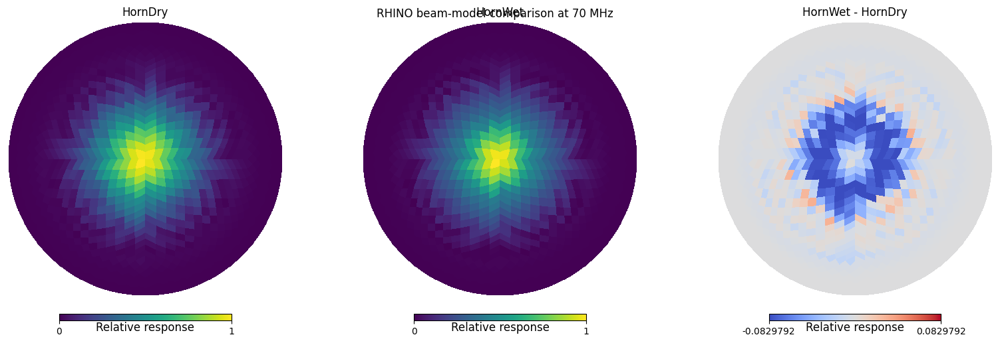

In [102]:
# ============================================================
# FIGURE 1 — BEAM MODEL COMPARISON
# HornDry | HornWet | Wet - Dry
# ============================================================

beam_difference = (
    np.asarray(horn_wet, dtype=float)
    - np.asarray(horn_dry, dtype=float)
)

dmax = finite_percentile(
    np.abs(beam_difference),
    99,
    fallback=1.0,
)

FACE_ON_ROT = [0.0, 90.0, 0.0]

fig = plt.figure(figsize=(16, 5))

hp.orthview(
    horn_dry,
    fig=fig.number,
    sub=(1, 3, 1),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornDry",
    unit="Relative response",
    min=0,
    max=1,
)

hp.orthview(
    horn_wet,
    fig=fig.number,
    sub=(1, 3, 2),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet",
    unit="Relative response",
    min=0,
    max=1,
)

hp.orthview(
    beam_difference,
    fig=fig.number,
    sub=(1, 3, 3),
    rot=FACE_ON_ROT,
    half_sky=True,
    title="HornWet - HornDry",
    unit="Relative response",
    min=-dmax,
    max=dmax,
    cmap="coolwarm",
)

plt.suptitle(
    f"RHINO beam-model comparison at {FREQ_MHZ:g} MHz",
    y=1.02,
)

plt.show()

In [ ]:
# ============================================================
# FIGURE 2 — ROTATION-ASSISTED BEAM MISMATCH RECOVERY
#
# Case G throughout
#
# Rows:
#   Dry -> Dry
#   Dry -> Wet
#   Wet -> Wet
#   Wet -> Dry
#
# Columns:
#   Recovered | Residual
# ============================================================

g_plot_data = {}

for case_name in MISMATCH_CASES:

    result = beam_mismatch_results_by_scan[
        G_SCAN
    ][case_name]

    g_plot_data[case_name] = (
        extract_result_on_full_pixels(
            result,
            beam_mismatch_common_pix,
        )
    )


# ------------------------------------------------------------
# COMMON recovered-map scale
# ------------------------------------------------------------

all_truth_G = np.concatenate([
    np.asarray(d["truth"], dtype=float)
    for d in g_plot_data.values()
])

vmin_G = finite_percentile(
    all_truth_G,
    1,
)

vmax_G = finite_percentile(
    all_truth_G,
    99,
)


# ------------------------------------------------------------
# COMMON residual scale
# ------------------------------------------------------------

all_residual_G = np.concatenate([
    np.asarray(d["residual"], dtype=float)
    for d in g_plot_data.values()
])

rmax_G = finite_percentile(
    np.abs(all_residual_G),
    98,
    fallback=1.0,
)

print("Recovered scale:", vmin_G, vmax_G)
print("Residual scale:", -rmax_G, rmax_G)


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig = plt.figure(
    figsize=(15, 15)
)

for row, case_name in enumerate(
    MISMATCH_CASES
):

    data = g_plot_data[
        case_name
    ]

    rec_full = patch_to_full(
        data["recovered"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )

    res_full = patch_to_full(
        data["residual"],
        beam_mismatch_common_pix,
        MAP_NSIDE,
    )


    # Recovered
    hp.mollview(
        rec_full,
        fig=fig.number,
        sub=(4, 2, 2 * row + 1),

        title=(
            f"{MISMATCH_LABELS[case_name]}"
            "\nRecovered"
        ),

        unit="K",
        min=vmin_G,
        max=vmax_G,
        badcolor="gray",
    )

    hp.graticule()


    # Residual
    hp.mollview(
        res_full,
        fig=fig.number,
        sub=(4, 2, 2 * row + 2),

        title=(
            f"{MISMATCH_LABELS[case_name]}"
            "\nRecovered - reference"
        ),

        unit="K",
        min=-rmax_G,
        max=rmax_G,
        cmap="coolwarm",
        badcolor="gray",
    )

    hp.graticule()


plt.suptitle(
    "Beam-model mismatch under the Case G rotation strategy",
    y=0.995,
)

plt.subplots_adjust(
    left=0.03,
    right=0.97,
    bottom=0.03,
    top=0.96,
    wspace=0.08,
    hspace=0.30,
)

plt.show()

Recovered scale: 1289.2327230640515 5414.863596620631
Residual scale: -1182.8245613328017 1182.8245613328017
